# Module 1. Samples

## Getting Started with Jupyter Notebooks

Jupyter Notebooks (or iPython Notebooks) are files with a mixture of Markdown and Python code. It's a very convenient format so we'll be using this quite a lot during this course!

### Google Colab

To get started, it is not necessary to install software on your laptop. [Google Colab](https://colab.research.google.com/) is a free online iPython development environment, but it does require a Google account in order to use it. You can create a local clone of the Github repo with the lab assignments and upload the Notebook files you want to work with to Colab.

Remark that the Google Colab environment has older versions installed of the Python libraries that we will be using throughout this course. Usually, that's not a problem, but sometimes you will run into errors, e.g. because some parameter in our Python code didn't exist yet in that version. The solution is to add a new code block at the beginning of your Notebook file with content:

In [ ]:
%pip install --upgrade matplotlib
%pip install --upgrade scipy
%pip install --upgrade statsmodels

You only have to do this in Notebooks where you encounter errors, and only for the libraries that cause these errors. The installation may take a while and you need to restart the Python runtime afterwards by clicking the button that appears.

### Local environment

If you prefer to have a local development environment, you need to install Python and Visual Studio Code with the necessary extensions for working with Python (e.g. Pylance, Jupyter, Jupyter Keymap, etc.) The first time you open a Notebook file, VSCode will offer you to install these extensions.

To install Python and VSCode on Windows, we recommend using `winget`. First, check the latest version of Python on the [Python website](https://www.python.org/downloads/windows/). For example, at the time of writing, the latest version was 3.12.2. We'll need to specify the major and minor version (e.g. 3.12) when installing. Then, open a PowerShell or command prompt as Administrator and run:

```console
> winget install Microsoft.VisualStudioCode
> winget install Python.Python.3.12
```

Remark that `winget upgrade --all` will install maintenance releases of Python, but it will not upgrade to a new major or minor version.

Most Python scripts (or Jupyter Notebooks) for analyzing data use the same program libraries. The most important ones are:

- `numpy` - multidimensional arrays, linear algebra, etc.
- `scipy` - mathematics, science, engineering etc.
- `pandas` - data-analysis and -manipulation
- `matplotlib`, `seaborn` - data visualisation
- `scikit-learn` - regression and machine learning

You can install these using `pip`:

```console
> pip install matplotlib numpy pandas scipy seaborn scikit-learn statsmodels
```

Or, alteratively, by executing the following code block:

In [1]:
%pip install matplotlib
%pip install numpy
%pip install pandas
%pip install scipy
%pip install seaborn
%pip install scikit-learn
%pip install statsmodels

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated pa


Since you usually need the same packages every time, it is best to put them at the top of every script or Notebook file you write. By convention, package names are often abbreviated in a consistent manner, e.g. `np` for `numpy`, `sns` for `seaborn`, etc.

In [2]:
# Importing the necessary packages
import numpy as np                                  # "Scientific computing"
import scipy.stats as stats                         # Statistical tests

import pandas as pd                                 # Data Frame
from pandas.api.types import CategoricalDtype

import matplotlib.pyplot as plt                     # Basic visualisation
from statsmodels.graphics.mosaicplot import mosaic  # Mosaic diagram
import seaborn as sns                               # Advanced data visualisation

## Opening a Dataset, General Information

You can read in a dataset from a variety of sources (Rajagopalan, 2021, p.158). You can specify a path to a file or even a URL:

In [22]:
# Importing the Titanic dataset. (Rajagopalan, 2021, p. 106)
titanic = pd.read_csv('https://raw.githubusercontent.com/DataRepo2019/Data-files/master/titanic.csv')
# Show the first few records of the Data Frame
titanic.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


If you want to open a dataset that you stored on Google Drive (where Google Colab stores all your Notebooks), you can use the following code instead:

In [ ]:
# Ensure your Google Drive is accessible from within the notebook
from google.colab import drive
drive.mount('/content/drive')

# Load the dataset from your Google Drive (here, we stored it in a subfolder
# called "data")
titanic = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/data/titanic.csv')
titanic.head()

Let's take a look at the properties of the dataset we just loaded:

In [25]:
# How many  rows does the DataFrame have?
print(f"Number of rows: {len(titanic)}")
# How many columns?
print(f"Number of columns: {len(titanic.columns)}")
# How many rows and columns, i.e. the shape
print(f"The shape of the Data Frame is: {titanic.shape}")
# General information about the DataFrame
print("*"*50)
titanic.info()

# Give the data type of each column.
print("*"*50)
print(titanic.dtypes)

# How many columns of each data type are there?
#   Watch it! The book says to use get_dtype_counts(), but this method no longer exists
print("*"*50)
print(titanic.dtypes.value_counts())

Number of rows: 891
Number of columns: 12
The shape of the Data Frame is: (891, 12)
**************************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   PassengerId  891 non-null    int64   
 1   Survived     891 non-null    category
 2   Pclass       891 non-null    int64   
 3   Name         891 non-null    object  
 4   Sex          891 non-null    object  
 5   Age          714 non-null    float64 
 6   SibSp        891 non-null    int64   
 7   Parch        891 non-null    int64   
 8   Ticket       891 non-null    object  
 9   Fare         891 non-null    float64 
 10  Cabin        204 non-null    object  
 11  Embarked     889 non-null    object  
dtypes: category(1), float64(2), int64(4), object(5)
memory usage: 77.7+ KB
**************************************************
PassengerId       int64
Survive

## Indices

The columns "PassengerId" is not an actual variabele, but contains a number to identify each observation. You can mark this column as an index:

In [10]:
titanic.set_index(['PassengerId'])

,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
PassengerId,,,,,,,,,,,
1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...
887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S


## Qualitative variables

Some of the variables, such as `Survived` and `Pclass`, are incorrectly considered to be quantitative. You can correct this by explicitly converting them to a **qualitative** (categorical) variable:

In [24]:
# Describe the variable Survived -> is considered to be quantitative
print(titanic.Survived.describe())
# Convert to a categorical variable
titanic.Survived = titanic.Survived.astype('category')
# Ask to describe once more -> now it is considered to be qualitative
print(titanic.Survived.describe())

count    891.000000
mean       0.383838
std        0.486592
min        0.000000
25%        0.000000
50%        0.000000
75%        1.000000
max        1.000000
Name: Survived, dtype: float64
count     891
unique      2
top         0
freq      549
Name: Survived, dtype: int64


You can also mark variables as **ordinal**, that is, with an ordering. We will do this as an example with the variable "Embarked" and order the ports in the order of departure. The Titanic departed at SouthHampton, and then picked up passengers first at Cherbourg and then at Queenstown.

For cases like this, define your own datatype specifying the order:

In [5]:
print(titanic.Embarked.unique())

embarked_type = CategoricalDtype(categories=['S', 'C', 'Q'], ordered=True)
titanic.Embarked = titanic.Embarked.astype(embarked_type)
titanic.Embarked.describe()

['S' 'C' 'Q' nan]


count     889
unique      3
top         S
freq      644
Name: Embarked, dtype: object

This order will then always be respected, e.g. in graphs

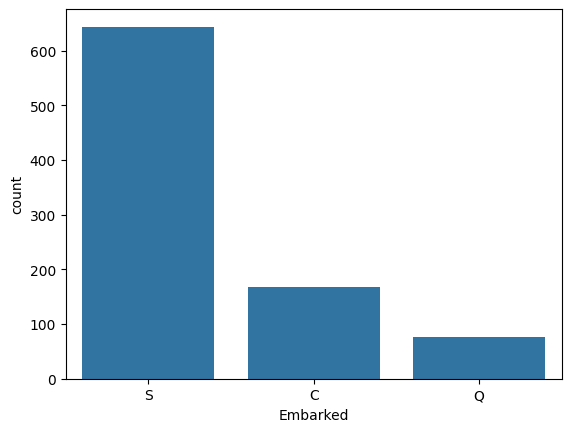

In [6]:
sns.countplot(data=titanic, x='Embarked');

## Selecting Data

In [19]:
# Select all observations for a single variable (i.e. a DataFrame column)
# titanic.Age
# This also works (and is preferable as it will also work when the column name has a space in it):
titanic['Age']
# This also works, but isn't very nice
# titanic.loc[:, 'Age']

0      22.0
1      38.0
2      26.0
3      35.0
4      35.0
       ... 
886    27.0
887    19.0
888     NaN
889    26.0
890    32.0
Name: Age, Length: 891, dtype: float64

In [20]:
# Select adjacent columns
titanic.iloc[:, 2:4]

,Pclass,Name
0,3,"Braund, Mr. Owen Harris"
1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th..."
2,3,"Heikkinen, Miss. Laina"
3,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)"
4,3,"Allen, Mr. William Henry"
...,...,...
886,2,"Montvila, Rev. Juozas"
887,1,"Graham, Miss. Margaret Edith"
888,3,"Johnston, Miss. Catherine Helen ""Carrie"""
889,1,"Behr, Mr. Karl Howell"


You can also select multiple columns based on their names.
This is often clearer than selecting based on position and the columns must 
not be adjacent.

In [23]:
titanic[['Name', 'Age', 'Cabin']] # Note: two sets of square brackets!

,Name,Age,Cabin
0,"Braund, Mr. Owen Harris",22.0,NaN
1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",38.0,C85
2,"Heikkinen, Miss. Laina",26.0,NaN
3,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",35.0,C123
4,"Allen, Mr. William Henry",35.0,NaN
...,...,...,...
886,"Montvila, Rev. Juozas",27.0,NaN
887,"Graham, Miss. Margaret Edith",19.0,B42
888,"Johnston, Miss. Catherine Helen ""Carrie""",NaN,NaN
889,"Behr, Mr. Karl Howell",26.0,C148


In [32]:
# Observation with row number 5 (counting from zero)
print(titanic.iloc[5])

# The first 4 observations
titanic.iloc[0:4]

PassengerId                   6
Survived                      0
Pclass                        3
Name           Moran, Mr. James
Sex                        male
Age                         NaN
SibSp                         0
Parch                         0
Ticket                   330877
Fare                     8.4583
Cabin                       NaN
Embarked                      Q
Name: 5, dtype: object


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S


In [33]:
# Select observations where the value of Age is less than 18
titanic[titanic.Age < 18]  

# The same, but only keep the column 'Embarked'
titanic[titanic.Age < 18].Embarked

# The same, but keep columns 'Age' and 'Embarked'
titanic[titanic['Age'] < 18][['Age', 'Embarked']]

,Age,Embarked
7,2.0,S
9,14.0,C
10,4.0,S
14,14.0,S
16,2.0,Q
...,...,...
850,4.0,S
852,9.0,C
853,16.0,S
869,4.0,S


In [7]:
# Select all boys younger than 10
titanic.query("(Sex=='male') and (Age < 10)")

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
7,8,0,3,"Palsson, Master. Gosta Leonard",male,2.00,3,1,349909,21.0750,NaN,S
16,17,0,3,"Rice, Master. Eugene",male,2.00,4,1,382652,29.1250,NaN,Q
50,51,0,3,"Panula, Master. Juha Niilo",male,7.00,4,1,3101295,39.6875,NaN,S
63,64,0,3,"Skoog, Master. Harald",male,4.00,3,2,347088,27.9000,NaN,S
78,79,1,2,"Caldwell, Master. Alden Gates",male,0.83,0,2,248738,29.0000,NaN,S
164,165,0,3,"Panula, Master. Eino Viljami",male,1.00,4,1,3101295,39.6875,NaN,S
165,166,1,3,"Goldsmith, Master. Frank John William ""Frankie""",male,9.00,0,2,363291,20.5250,NaN,S
171,172,0,3,"Rice, Master. Arthur",male,4.00,4,1,382652,29.1250,NaN,Q
182,183,0,3,"Asplund, Master. Clarence Gustaf Hugo",male,9.00,4,2,347077,31.3875,NaN,S
183,184,1,2,"Becker, Master. Richard F",male,1.00,2,1,230136,39.0000,F4,S


## Dropping Data and Working with Missing Data

Pandas tries to make working with missing data as easy as possible. E.g., all of the descriptive statistics on pandas objects exclude missing data by default.

Let's starting by reading the titanic data again.

In [8]:
titanic = pd.read_csv('https://raw.githubusercontent.com/DataRepo2019/Data-files/master/titanic.csv')
titanic.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


The `PassengerId` column is identical to the index hence it doesn't provide any additional useful information. Let's drop this column (rather than setting it as the index as before). This can by done using `drop`.

In [9]:
titanic.drop("PassengerId", axis="columns")

,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...
886,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
887,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
888,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S
889,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C


Notice that we actually didn't change the `titanic` `DataFrame`.  We can either assign the result of `drop` to a (new) `DataFrame`
or we can use `inplace=True`.

In [38]:
titanic.head(3) # PassengerId is still here

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S


In [10]:
titanic = titanic.drop("PassengerId", axis="columns")
titanic.head(3) # PassengerId is now gone

,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S


From the output of the `info` method we can infer that certain columns contain many missing values, e.g. `Cabin` only contains 204 non-missing values. 
For the purposes of illustration, let's drop any row that has a missing observation by using 
the default behaviour of the `dropna` method.

In [40]:
titanic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  891 non-null    int64  
 1   Pclass    891 non-null    int64  
 2   Name      891 non-null    object 
 3   Sex       891 non-null    object 
 4   Age       714 non-null    float64
 5   SibSp     891 non-null    int64  
 6   Parch     891 non-null    int64  
 7   Ticket    891 non-null    object 
 8   Fare      891 non-null    float64
 9   Cabin     204 non-null    object 
 10  Embarked  889 non-null    object 
dtypes: float64(2), int64(4), object(5)
memory usage: 76.7+ KB


In [41]:
cleaned = titanic.dropna() # Drop any row that has at least one missing value
print(cleaned.info())
cleaned.head(5)

<class 'pandas.core.frame.DataFrame'>
Index: 183 entries, 1 to 889
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  183 non-null    int64  
 1   Pclass    183 non-null    int64  
 2   Name      183 non-null    object 
 3   Sex       183 non-null    object 
 4   Age       183 non-null    float64
 5   SibSp     183 non-null    int64  
 6   Parch     183 non-null    int64  
 7   Ticket    183 non-null    object 
 8   Fare      183 non-null    float64
 9   Cabin     183 non-null    object 
 10  Embarked  183 non-null    object 
dtypes: float64(2), int64(4), object(5)
memory usage: 17.2+ KB
None


,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
1,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
3,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
6,0,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,51.8625,E46,S
10,1,3,"Sandstrom, Miss. Marguerite Rut",female,4.0,1,1,PP 9549,16.7000,G6,S
11,1,1,"Bonnell, Miss. Elizabeth",female,58.0,0,0,113783,26.5500,C103,S


This would only keep 183 values, which isn't a lot. We could also choose to drop only the rows that consist of nothing but missing values (there are no such rows in the `titanic` `DataFrame`), but here you can see how this would be done.

In [42]:
cleaned = titanic.dropna(how="all")
cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  891 non-null    int64  
 1   Pclass    891 non-null    int64  
 2   Name      891 non-null    object 
 3   Sex       891 non-null    object 
 4   Age       714 non-null    float64
 5   SibSp     891 non-null    int64  
 6   Parch     891 non-null    int64  
 7   Ticket    891 non-null    object 
 8   Fare      891 non-null    float64
 9   Cabin     204 non-null    object 
 10  Embarked  889 non-null    object 
dtypes: float64(2), int64(4), object(5)
memory usage: 76.7+ KB


Instead of relying on `info` to compute the number of non missing values we can also use the `isnull` and/or `notnull` methods.
`notnull` computes a boolean `DataFrame` where an entry is `True` if and only if that entry is considered to be non missing in the original `DataFrame`. We can then use `sum` the compute the sum of each column. This gives the number of non missing values per column.  

In [43]:
not_null_df = titanic.notnull()
print(not_null_df.tail(3))
print("Number of non null values in each column:")
print(not_null_df.sum())

     Survived  Pclass  Name   Sex    Age  SibSp  Parch  Ticket  Fare  Cabin  \
888      True    True  True  True  False   True   True    True  True  False   
889      True    True  True  True   True   True   True    True  True   True   
890      True    True  True  True   True   True   True    True  True  False   

     Embarked  
888      True  
889      True  
890      True  
Number of non null values in each column:
Survived    891
Pclass      891
Name        891
Sex         891
Age         714
SibSp       891
Parch       891
Ticket      891
Fare        891
Cabin       204
Embarked    889
dtype: int64


An even easier alternative is to simply use `count` on the `DataFrame`.

In [44]:
print(titanic.count())

Survived    891
Pclass      891
Name        891
Sex         891
Age         714
SibSp       891
Parch       891
Ticket      891
Fare        891
Cabin       204
Embarked    889
dtype: int64


The `Cabin` column has too many missing values, so probably isn't useful. For the `Age` column, we can *impute* the missing values, e.g. with the average age of all passengers. (We will see later what this means exactly). Let's do this using `fillna`.

In [ ]:
# First compute the average age
avg_age = titanic['Age'].mean()
print(f"(Rounded) Average age of passengers: {round(avg_age)}")
titanic = titanic.fillna(value={'Age' : avg_age})
print("We should now confirm that the 'Age' column no longer has missing values")
titanic.count()


(Rounded) Average age of passengers: 30
We should now confirm that the 'Age' column no longer has missing values


Survived    891
Pclass      891
Name        891
Sex         891
Age         891
SibSp       891
Parch       891
Ticket      891
Fare        891
Cabin       204
Embarked    889
dtype: int64

## Creating New Columns

We use a dataset containing $NO_2$ measurements in the the stations of Paris, Antwerp and London.

Let's read the data and check whether it worked.

In [12]:
URL = "https://raw.githubusercontent.com/pandas-dev/pandas/master/doc/data/air_quality_no2.csv"
air_quality = pd.read_csv(URL)
air_quality.info()
air_quality.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1035 entries, 0 to 1034
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   datetime         1035 non-null   object 
 1   station_antwerp  95 non-null     float64
 2   station_paris    1004 non-null   float64
 3   station_london   969 non-null    float64
dtypes: float64(3), object(1)
memory usage: 32.5+ KB


,datetime,station_antwerp,station_paris,station_london
0,2019-05-07 02:00:00,NaN,NaN,23.0
1,2019-05-07 03:00:00,50.5,25.0,19.0
2,2019-05-07 04:00:00,45.0,27.7,19.0
3,2019-05-07 05:00:00,NaN,50.4,16.0
4,2019-05-07 06:00:00,NaN,61.9,NaN


We see that 
- the dates are stored as strings (object)
- `datetime` is added as a column and we have a `RangeIndex`.

We would like to
- parse the dates, so that they are available as `datetime` objects
- index the `DataFrame` rows by this date.

This can be achieved by specifying the index column and by indicating that dates must be parsed on `read_csv`. Let's try again.

In [14]:
air_quality = pd.read_csv(URL, index_col=0, parse_dates=True)
print(air_quality.info())
air_quality.head()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1035 entries, 2019-05-07 02:00:00 to 2019-06-21 02:00:00
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   station_antwerp  95 non-null     float64
 1   station_paris    1004 non-null   float64
 2   station_london   969 non-null    float64
dtypes: float64(3)
memory usage: 32.3 KB
None


,station_antwerp,station_paris,station_london
datetime,,,
2019-05-07 02:00:00,NaN,NaN,23.0
2019-05-07 03:00:00,50.5,25.0,19.0
2019-05-07 04:00:00,45.0,27.7,19.0
2019-05-07 05:00:00,NaN,50.4,16.0
2019-05-07 06:00:00,NaN,61.9,NaN


We can clearly see the difference!

### Creating a New Column Derived from (an) Existing Column(s)

Assume we would like to express the concentration of the station in London in mg/m^3

*(If we assume temperature of 25 degrees Celsius and pressure of 1013 hPa, the conversion factor is 1.882)*

In [15]:
air_quality["london_mg_per_cubic"] = air_quality["station_london"] * 1.882
air_quality.head()

,station_antwerp,station_paris,station_london,london_mg_per_cubic
datetime,,,,
2019-05-07 02:00:00,NaN,NaN,23.0,43.286
2019-05-07 03:00:00,50.5,25.0,19.0,35.758
2019-05-07 04:00:00,45.0,27.7,19.0,35.758
2019-05-07 05:00:00,NaN,50.4,16.0,30.112
2019-05-07 06:00:00,NaN,61.9,NaN,NaN


To create a new column, use the `[]` brackets with the new column name at the left side of the assignment.  The computation is done **element wise**, hence there is no need for an explict loop!

We can also use multiple columns to derive a new column.

Let's check the ratio of the values in Paris versus Antwerp and save the result in a new column.

In [16]:
air_quality["ratio_paris_antwerp"] = air_quality["station_paris"] / air_quality["station_antwerp"]
air_quality.head()

,station_antwerp,station_paris,station_london,london_mg_per_cubic,ratio_paris_antwerp
datetime,,,,,
2019-05-07 02:00:00,NaN,NaN,23.0,43.286,NaN
2019-05-07 03:00:00,50.5,25.0,19.0,35.758,0.495050
2019-05-07 04:00:00,45.0,27.7,19.0,35.758,0.615556
2019-05-07 05:00:00,NaN,50.4,16.0,30.112,NaN
2019-05-07 06:00:00,NaN,61.9,NaN,NaN,NaN


We can also perform more general mappings on columns, either using a function or a dictionary.

Let's work with the Titanic data once more.  Let's say we want to numerically encode the `Sex` column, this can be done as follows. First let's check the unique values in the `Sex` column.

In [17]:
titanic['Sex'].unique()

array(['male', 'female'], dtype=object)

In [18]:
mapping_dict = {'male' : 0, 'female' : 1}
titanic['Sex'] = titanic['Sex'].map(mapping_dict)

Let's check whether it worked.

In [19]:
titanic.head()

,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,0,3,"Braund, Mr. Owen Harris",0,22.0,1,0,A/5 21171,7.2500,NaN,S
1,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",1,38.0,1,0,PC 17599,71.2833,C85,C
2,1,3,"Heikkinen, Miss. Laina",1,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",1,35.0,1,0,113803,53.1000,C123,S
4,0,3,"Allen, Mr. William Henry",0,35.0,0,0,373450,8.0500,NaN,S


Let's add a new feature (i.e. a new column). When `Age` is less than 12 we will call this passenger a `child`, 
between 12 and 18 a `teen` and over 18 will be `adult`s.  First, we define a Python function implementing 
this mapping, and then we apply it to the `Age` column.

In [20]:
def age_to_category(age):
    if age < 12:
        return "child"
    if age < 18:
        return "teen"
    return "adult"

titanic['AgeCategory'] = titanic['Age'].map(age_to_category)
titanic.head()

,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,AgeCategory
0,0,3,"Braund, Mr. Owen Harris",0,22.0,1,0,A/5 21171,7.2500,NaN,S,adult
1,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",1,38.0,1,0,PC 17599,71.2833,C85,C,adult
2,1,3,"Heikkinen, Miss. Laina",1,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S,adult
3,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",1,35.0,1,0,113803,53.1000,C123,S,adult
4,0,3,"Allen, Mr. William Henry",0,35.0,0,0,373450,8.0500,NaN,S,adult


Here, we only scratched the surface of what is possible with pandas (and indeed, whole books have been written about pandas). In general the pandas getting started guide, the user guide and the API reference are very good resources to find additional information. You can find 
all of these [here](https://pandas.pydata.org/pandas-docs/stable/index.html).

# Module 2. Univariate analysis

In [6]:
# Importing the necessary packages
import numpy as np                                  # "Scientific computing"
import scipy.stats as stats                         # Statistical tests

import pandas as pd                                 # Data Frame
from pandas.api.types import CategoricalDtype

import matplotlib.pyplot as plt                     # Basic visualisation
from statsmodels.graphics.mosaicplot import mosaic  # Mosaic diagram
import seaborn as sns                               # Advanced data visualisation

Seaborn contains some datasets that we will use here as examples.

In [7]:
# Example dataset, included with Seaborn
tips = sns.load_dataset("tips")    # Info on tips given at restaurants

We show the first rows of this dataset to get an idea of their contents:

In [8]:
tips.shape

(244, 7)

In [5]:
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


In [11]:
tips.info()
type(tips)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244 entries, 0 to 243
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   total_bill  244 non-null    float64 
 1   tip         244 non-null    float64 
 2   sex         244 non-null    category
 3   smoker      244 non-null    category
 4   day         244 non-null    category
 5   time        244 non-null    category
 6   size        244 non-null    int64   
dtypes: category(4), float64(2), int64(1)
memory usage: 7.4 KB


pandas.core.frame.DataFrame

## Qualitative Variables

### Visualisation using a Bar Chart

In [ ]:
tips.day.unique()

['Sun', 'Sat', 'Thur', 'Fri']
Categories (4, object): ['Thur', 'Fri', 'Sat', 'Sun']

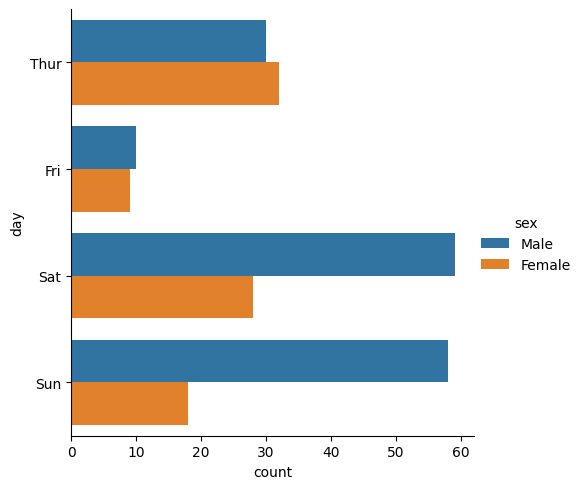

In [ ]:
# Bar chart in Seaborn: catplot() with 'kind = "count"''
sns.catplot(data=tips, kind='count', y='day', hue='sex' );

### Centrality Measures

In [24]:
# Mode for all the variables in the DataFrame
tips.mode()

,total_bill,tip,sex,smoker,day,time,size
0,13.42,2.0,Male,No,Sat,Dinner,2


In [25]:
# Mode for a specific variable
tips.day.mode()

0    Sat
Name: day, dtype: category
Categories (4, object): ['Thur', 'Fri', 'Sat', 'Sun']

In [26]:
# Some descriptive measures
tips.day.describe()

count     244
unique      4
top       Sat
freq       87
Name: day, dtype: object

In [36]:
tips.smoker.value_counts()

smoker
No     151
Yes     93
Name: count, dtype: int64

## Quantitative Variables


### Visualisation

**Box-and-whisker plots** (sometimes referred to as boxplots) typically show only five 'points' from the distribution - the top and bottom of the range, the median and the upper and lower quartiles (UQ and LQ).  
These five values are sometimes known as the quartiles and the notation Q<sub>0</sub>, Q<sub>1</sub>, Q<sub>2</sub>, Q<sub>3</sub>, Q<sub>4</sub> is sometimes used to refer to minimum, LQ, median, UQ and maximum respectively. 

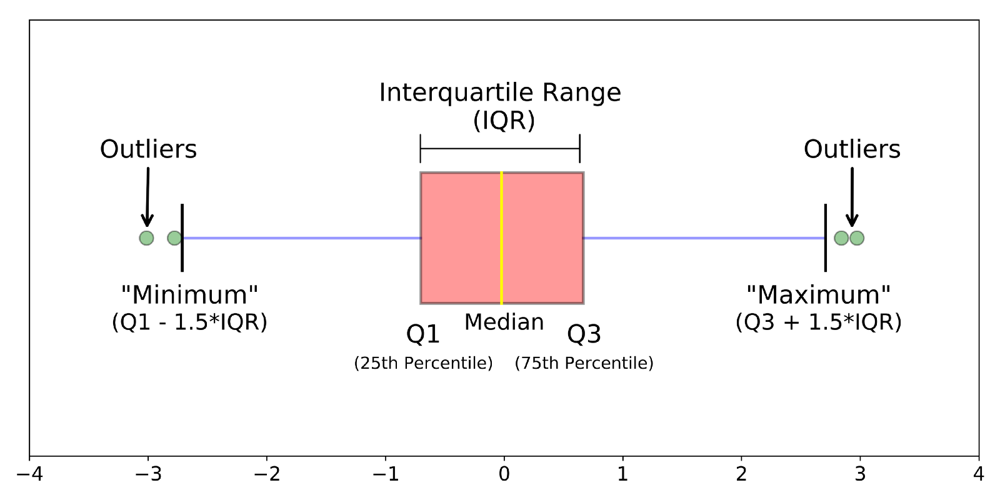

Source: https://spatiallychallenged.com/2019/05/31/box-and-whisker-plots/ 

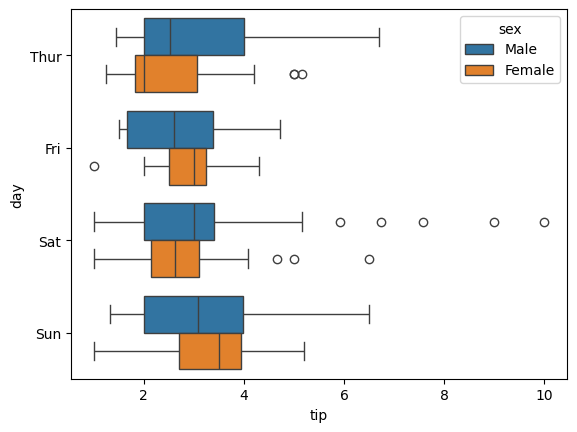

In [45]:
# Visualisation using a box plot (Seaborn)
sns.boxplot(data=tips, x='tip', y='day', hue='sex');

In [41]:
tips.tip.describe()

count    244.000000
mean       2.998279
std        1.383638
min        1.000000
25%        2.000000
50%        2.900000
75%        3.562500
max       10.000000
Name: tip, dtype: float64

In a **histogram**, the domain of the variable is subdivided into intervals (also called *bins*), usually of equal size. The frequency of the variable in each interval is represented by the height of a bar.

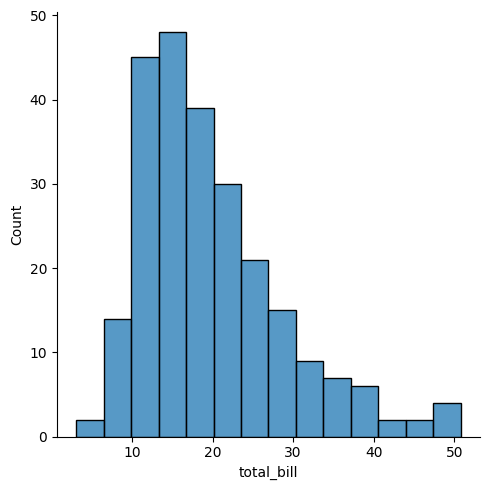

In [48]:
sns.displot(data=tips, x='total_bill');

You can set the number of intervals with the parameter `bins`.

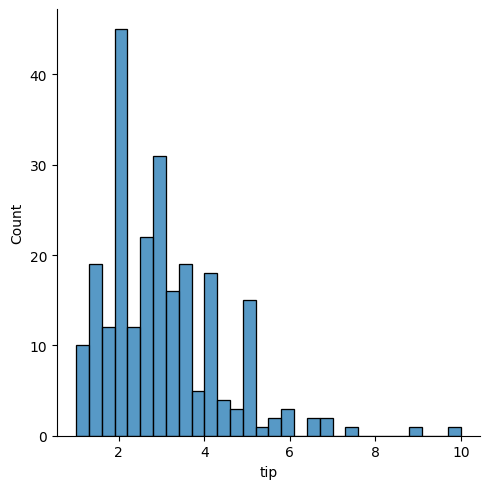

In [60]:
sns.displot(data=tips, x='tip', bins=30);

A **kernel density** plot is a form of a graph that uses a single continuous curve to show the distribution of values in a dataset. A kernel density plot is similar to a histogram, but it is better at depicting the shape of distribution because the number of bins used in the histogram has no effect on it.

Below we show a plot of the probability density (kde or kernel density estimation).

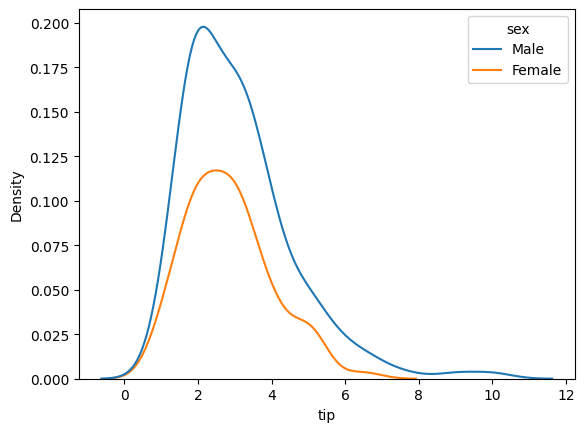

In [19]:
sns.kdeplot(data=tips, x='tip', hue='sex');

A histogram can be superimposed with a kernel density estimate:

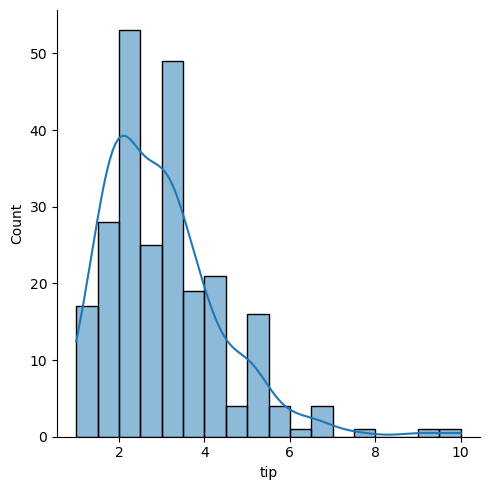

In [19]:
sns.displot(data=tips, x='tip', kde=True);

A **violin plot** is a combination of a box plot and a kernel density plot.

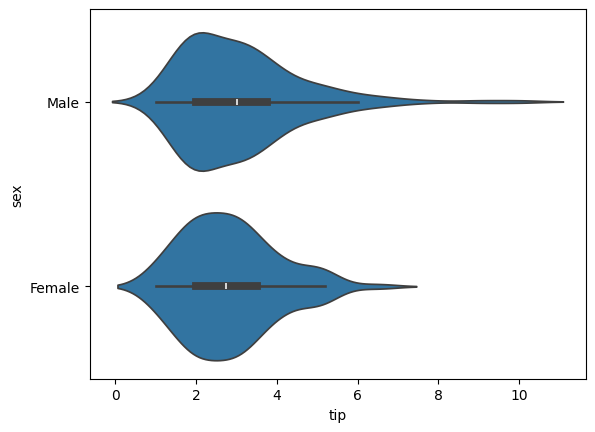

In [20]:
sns.violinplot(data=tips, x='tip', y='sex');

### Centrality and Dispersion Measures

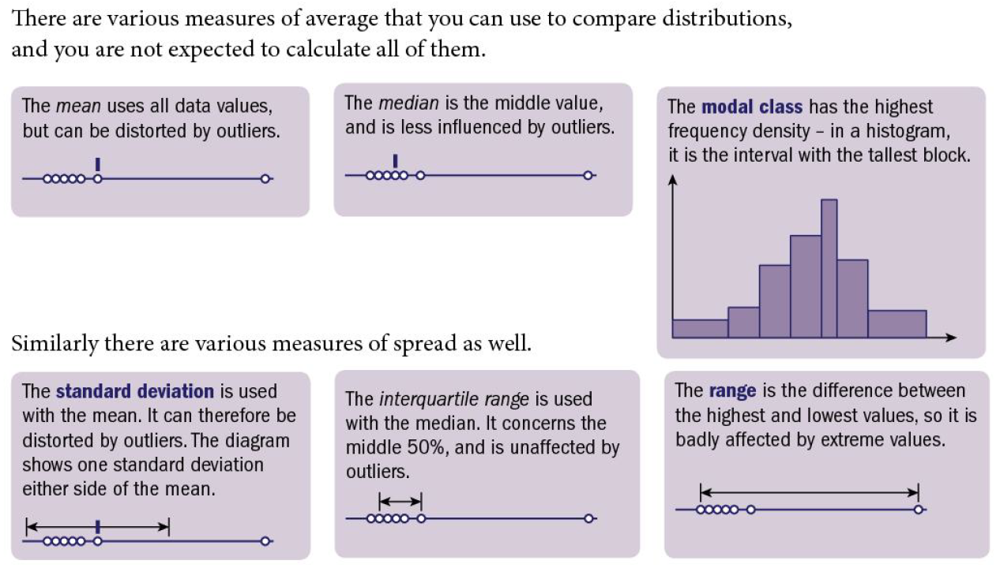

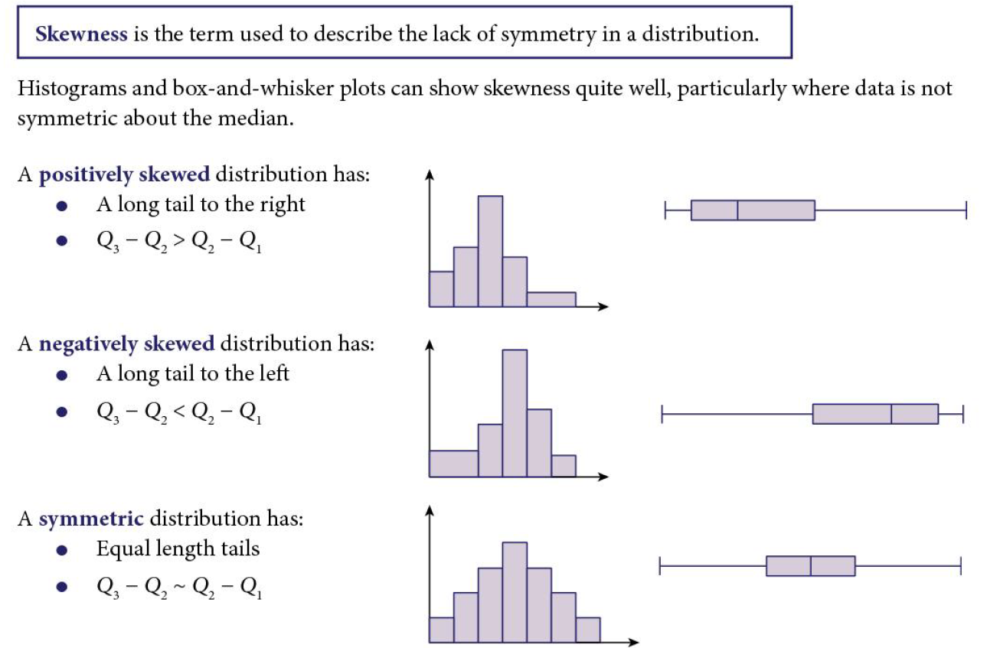

Source: Complete Probability & Statistics 1 for Cambridge International AS & A Level

In [7]:
# Centrality and dispersion deasures
# Mean, standard deviation & friends
print(f"Mean:                 {tips.tip.mean()}")
print(f"Standard deviation:   {tips.tip.std()}") # Pay attention: n-1 in the denominator
print(f"Variance:             {tips.tip.var()}") # Pay attention: n-1 in the denominator
print(f"Skewness:             {tips.tip.skew()}")
print(f"Kurtosis:             {tips.tip.kurtosis()}")

# Median & co
print(f"Minimum:              {tips.tip.min()}")
print(f"Median:               {tips.tip.median()}")
print(f"Maximum:              {tips.tip.max()}")
percentiles = [0.0, 0.25, 0.5, 0.75, 1.0]
print(f"Percentiles           {percentiles}\n{tips.tip.quantile(percentiles)}" )
print(f"Inter Quartile Range: {stats.iqr(tips.tip)}")
print(f"Range :               {tips.tip.max() - tips.tip.min()}")

Mean:                 2.99827868852459
Standard deviation:   1.3836381890011822
Variance:             1.914454638062471
Skewness:             1.4654510370979401
Kurtosis:             3.648375873352852
Minimum:              1.0
Median:               2.9
Maximum:              10.0
Percentiles           [0.0, 0.25, 0.5, 0.75, 1.0]
0.00     1.0000
0.25     2.0000
0.50     2.9000
0.75     3.5625
1.00    10.0000
Name: tip, dtype: float64
Inter Quartile Range: 1.5625
Range :               9.0


In [26]:
# Some descriptive measures
tips.tip.describe()

count    244.000000
mean       2.998279
std        1.383638
min        1.000000
25%        2.000000
50%        2.900000
75%        3.562500
max       10.000000
Name: tip, dtype: float64

## Formula for  Standard Deviation

Why do we use $n-1$ in the denominator of the formula for the standard deviation of a sample and not $n$? The former gives a better ("unbiased") estimate for what the standard deviation in the population will be, based on our sample. We can prove this mathematically, but that is beyond the scope of this course. We will, however, investigate it empirically.

We will first define the functions for variance of the population and of a sample:

In [4]:
# Variance of the population
def pop_var(x):
    n = len(x)
    mean = sum(x) / n
    return 1/n * sum((x - mean) ** 2)

# Standard deviation of the population
def pop_sd(x):
    return np.sqrt(pop_var(x))

# Variance of a sample
def sample_var(x):
    n = len(x)
    mean = sum(x) / n
    return 1/(n-1) * sum((x - mean) ** 2)

# Standard deviation of the sample
def sample_sd(x):
    return np.sqrt(sample_var(x))

# If we calculate the variance in both ways, we see a difference:
a = np.array([4, 8, 6, 5, 3, 2, 8, 9, 2, 5])

print(f"Population variance: {pop_var(a)}")
print(f"Sample variance:     {sample_var(a)}")
print()
print(f"Population standard deviation: {pop_sd(a)}")
print(f"Sample standard deviation:     {sample_sd(a)}")

Population variance: 5.760000000000001
Sample variance:     6.3999999999999995

Population standard deviation: 2.4000000000000004
Sample standard deviation:     2.5298221281347035


What is the best formula for the standard deviation of a sample? Let us assume that our population consists of all numbers from 0 to 100. We first calculate the mean and standard deviation of this population.

In [28]:
population = np.arange(0, 101)

population_mean = sum(population) / len(population)
print(f'Population mean: {population_mean}')

population_variance = pop_var(population)
print(f'Population variance: {population_variance}')

population_stdev = pop_sd(population)
print(f'Population standard deviation: {population_stdev}')

Population mean: 50.0
Population variance: 850.0
Population standard deviation: 29.154759474226502


Now for the actual experiment: we repeatedly take a random sample from this population and look at the result of both formulas for the variance. We will choose the formula that comes closest to the true variance of the population over a large number of iterations.

In [29]:
sample_size = 15            # the size of the sample
num_samples = 5000          # number of times we will take a sample

# We are going to calculate the average of the result with each formula.
# In order to do this, we keep track of the sum of these results and 
# divide afterwards by the number of samples
sum_pop = 0
sum_smp = 0

for _ in range(num_samples):
    sample = np.random.choice(population, size=sample_size)
    sum_pop = sum_pop + pop_sd(sample)
    sum_smp = sum_smp + sample_sd(sample)

print(f"Average result with formula population       : {sum_pop/num_samples}")
print(f"Average result with formula sample           : {sum_smp/num_samples}")
print(f"The true standard deviation of the population: {population_stdev}")

Average result with formula population       : 27.931656430239855
Average result with formula sample           : 28.912011176837773
The true standard deviation of the population: 29.154759474226502


We see that the formula with $n$ as denominator underestimates the true value of the standard deviation for the population. The formula with $n-1$ as denominator consistently gives a better estimate. Therefore, we will use this formula every time.

Note that we do not have to implement the formula for variance and standard deviation ourselves. Here we have done so to show how these formulas work. `numpy` already contains functions that do what we want:

In [5]:
a = np.array([1,2,3,4,5])

print(f"Population variance with numpy  : {np.var(a)}")
print(f"Population variance own function: {pop_var(a)}")  
print()
print(f"Sample variance with numpy  : {np.var(a, ddof=1)}")
print(f"Sample variance own function: {sample_var(a)}")  
print()
print(f"Standard deviation population: {np.std(a)}")
print(f"Standard deviation sample    : {np.std(a, ddof=1)}")

Population variance with numpy  : 2.0
Population variance own function: 2.0

Sample variance with numpy  : 2.5
Sample variance own function: 2.5

Standard deviation population: 1.4142135623730951
Standard deviation sample    : 1.5811388300841898


**Note:** `numpy` by default computes variance and standard deviations of the *population* (denominator *n*), while  `pandas` by default computes variance and standard deviation of the *sample* (denominator *n* - 1), as can be seen from the example below.

Make sure you always use the appropriate function or parameters!

In [13]:
print(f"Numpy  uses ddof=0 by default: {np.std(tips.tip)}")
print(f"Pandas uses ddof=1 by default: {tips.tip.std()}")
print(f"Numpy  with ddof=1:            {np.std(tips.tip, ddof=1)}")


Numpy  uses ddof=0 by default: 1.3807999538298954
Pandas uses ddof=1 by default: 1.3836381890011822
Numpy  with ddof=1:            1.3836381890011822


In [26]:
# Importing the necessary packages
import numpy as np                                  # "Scientific computing"
import scipy.stats as stats                         # Statistical tests

import pandas as pd                                 # Data Frame
from pandas.api.types import CategoricalDtype

import matplotlib.pyplot as plt                     # Basic visualisation
from statsmodels.graphics.mosaicplot import mosaic  # Mosaic diagram
import seaborn as sns                               # Advanced data visualisation

# Module 3.01. Probability


Informally, probabilities represent beliefs of how likely it is that a certain
event will happen when performing a certain experiment.  
In the frequentist view, **probability** represents the **relative frequency** of
the occurrence of the event at hand (when performing a large number
of independent experiments).

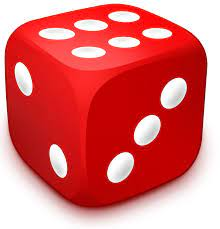

<u>Example</u>  
A fair six-sided die is thrown once.  
* What is the probability of getting a "1"?  
* What is the probability of throwing an even number?  
*What is the probability of getting a number in the set {1, 2, 3, 4, 5, 6}?

## Probability: Example

Two games of chance:
1. Bet on: at least one six when throwing a fair die 4 consecutive times.

    - You will win in the long run when playing this game.

2. Bet on: at least one “double six” when throwing two fair dice 24times.

    - You will lose in the long run when playing this game, even though in some sense the two bets seem equivalent. (Probability divided by six but number of throws multiplied by six.)

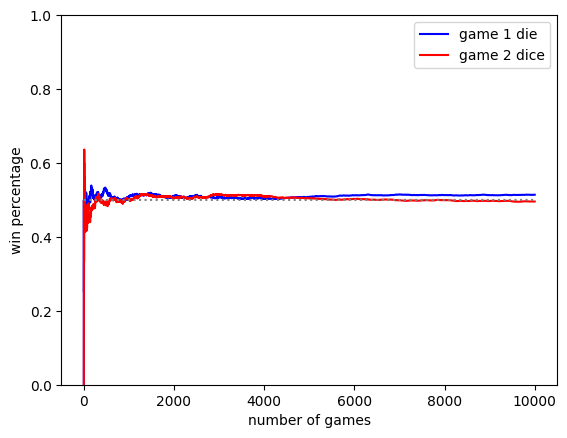

In [ ]:
import random

number_of_games = 10000

number_of_times_won = 0
l_game_1 = []
for index in range(1, number_of_games + 1):
  number_of_times_6 = 0
  for _ in range(4):
    number_of_times_6 += 1 if random.randint(1,6) == 6 else 0
  number_of_times_won += 1 if number_of_times_6 >= 1 else 0
  l_game_1.append(number_of_times_won / index)

number_of_times_won = 0
l_game_2 = []
for index in range(1, number_of_games + 1):
  number_of_times_double_6 = 0
  for _ in range(24):
    number_of_times_double_6 += 1 if (random.randint(1,6) == 6 and random.randint(1,6) == 6) else 0
  number_of_times_won += 1 if number_of_times_double_6 >= 1 else 0
  l_game_2.append(number_of_times_won / index)

data = {'number of games': range(1,number_of_games + 1), 'game 1 die': l_game_1, 'game 2 dice': l_game_2}

f, ax = plt.subplots(1, 1);

sns.lineplot(ax=ax, x='number of games', y='game 1 die', data=data, color = "blue", label="game 1 die");
sns.lineplot(ax=ax, x='number of games', y='game 2 dice', data=data, color = "red", label="game 2 dice");
sns.lineplot(ax=ax, x='number of games', y=0.5, data=data, color = "grey", linestyle='dotted');

plt.xlabel('number of games');
plt.ylabel('win percentage');
plt.ylim((0,1));
plt.legend()



## Two (or more) events

There are many contexts in which you are interested in the outcome of more than one thing at a time - that is, of a **compound event**. In simple cases it may be possible to make a list of all the possible outcomes. In order to make it easier to keep track, it is common to write the outcoumes as ordered pairs inside brackets, (), and to put the whole list inside curly brackets, {}. This list is called the **sample space** or **universe** of the experiment.

It helps to write a sample space list in a logical, methodical order.   
* For tossing a coin two times the sample space can be written as:  
{(H, H), (H, T), (T, H), (T, T)}  
* For tossing a coin three times the sample space can be written as:   
{(H, H, H), (H, T, H), (T, H, H), (T, T, H), (H, H, T), (H, T, T), (T, H, T), (T, T, T)}  

Within the sample space, the list for tossing a coin twice appears two times.  
This list of eight outcomes for tossing a coin three times can then form the basis of the sixteen outcomes for tossing a coin four times. This is created by putting an extra 'H' at the end and then an extra 'T' at the end. It can in turn be used for the list of tossing a coin five times, and so on.

<u>Example</u>  
What is the probability of at least one six when throwing a fair die 4 consecutive times.

*   What is the universe for the first game?  
𝛺 = {(1, 1, 1, 1), (1, 1, 1, 2), (1, 1, 1, 3), … , (6, 6, 6, 4), (6, 6, 6, 5), (6, 6, 6, 6)}
*   What set corresponds to the event "at least one 6"?  
𝐴 = {(6, 1, 1, 1), (6, 1, 1, 2), … , (5, 5, 5, 6), (6, 6, 1, 1), … (6, 6, 5, 5), (1, 6, 6, 1), … , (6, 6, 6, 6)}







## Axioms of Probability

1. Probabilities are non-negative: $𝑃(𝐴) ≥ 0$ for each $𝐴$.
2. The universe has probability 1: $𝑃(𝛺) = 1$.
3. When $𝐴$ and $𝐵$ are disjoint events (i.e. $𝐴 ∩ 𝐵 = ∅$) then it holds that  
$𝑃(𝐴 ∪ 𝐵) = 𝑃(𝐴) + 𝑃(𝐵)$.  
This is called the **sum rule**.

### Properties of Probabilities

From the three axioms of probability, we can derive all properties of probabilities. Some important ones are listed below:

1. Complement rule: for each $𝐴$ it holds that

    $𝑃(\overline{A}) = 1 − 𝑃(𝐴)$

    where $\overline{A}$ represents the event "A does not occur".

2. The impossible event has probability zero: $𝑃(∅) = 0$.

3. The general sum rule:

    $𝑃(𝐴 ∪ 𝐵) = 𝑃(𝐴) + 𝑃(𝐵) − 𝑃(𝐴 ∩ 𝐵)$

The general sum rule says that the probability of A or B can be found by adding the probabilities of A and B and then subtracting what has been double counted.  
You can check this works in simple examples like events based on throwing a die, but logic says it is always going to be true, even in situations where events are not equally likely or when you cannot list all possible outcomes.

### Example

If _A_ is the event a fair die shows a factor of 6 and _B_ is the event that the fair die shows a square number, then 1, 2, 3 and 6 satisfy _A_, while 1 and 4 satisfy _B_. _A_ and _B_ is satisfied by 1, and _A_ or _B_ is satisfied by 1, 2, 3, 4 and 6.

- 𝑃(𝐴 ∪ 𝐵) = $\cfrac{5}{6}$  
- 𝑃(𝐴) = $\cfrac{4}{6}$  
- 𝑃(B) = $\cfrac{2}{6}$  
- 𝑃(𝐴 ∩ 𝐵) = $\cfrac{1}{6}$  
- $\cfrac{5}{6} = \cfrac{4}{6} + \cfrac{2}{6} - \cfrac{1}{6}$

### Exercise

A coin is tampered with such that 𝑃(head) = 0.6. What is 𝑃(tail)?

In [5]:
print(f"P(tail) = 1 - P(head) =", 1 - 0.6)

P(tail) = 1 - P(head) = 0.4


### Exercise

From the 250 students enrolled in this course, 200 own a PlayStation game console, while 100 own a Nintendo Switch. There are 75
students who own both game consoles. What is the probability, when you pick a random student, that

* this student does not own a PlayStation 
* this student owns a PlayStation or a Nintendo Switch (or both)
* this student owns neither a PlayStation nor a Nintendo Switch.


In [9]:
print(f"1. ", 1 - 200/250)
print(f"2. ", 200/250 + 100/250 - 75/250)
print(f"3. ", 1 - (200/250 + 100/250 - 75/250))

1.  0.19999999999999996
2.  0.9000000000000001
3.  0.09999999999999987


## Independent Events

### Example

When events are independent it means that the occurrence of one event (or knowing that the event occurred) does not change the probability of the other event occurring. As an example: draw a card from a standard deck of cards and consider the following events:  

- 𝐴 = a ♣ was drawn

- 𝐵 = an ace was drawn  

When I tell you that 𝐵 occurred, this will not change your opinion about the probability of 𝐴 occurring, this will still be 13/52 = 1/4.

(Note: this also works the other way around!)

### Mathematically

Two events 𝐴 and 𝐵 are **independent** when

$$𝑃(𝐴 ∩ 𝐵) = 𝑃(𝐴)𝑃(𝐵)$$

## Dependent events

### Example

Consider the events from before where students own either a PlayStation, a Nintendo Switch or both. Let 𝐴 be the event that a student owns a PlayStation, while 𝐵 represents the fact that a student owns a Nintendo Switch. From the numbers above we see that

- $P(A) = \frac{200}{250} = 0.8$ and
- $P(B) = \frac{100}{250} = 0.4$

when we multiply these two probabilities we get

$$P(A)P(B) = 0.8 * 0.4 = 0.32$$

However, the probability that a student owns both a PlayStation and a Nintendo Switch, i.e. 𝐴 ∩ 𝐵 is given by

$$P(A \cap B) = \cfrac{75}{250} = 0.3 \neq 0.32$$

Hence, $P(A \cap B) \neq P(A)PB()$ and the two events are **dependent**.

In practical terms this means that e.g. knowing that a student owns a PlayStation gives you additional information about their ownership of a Nintendo Switch. Before you know that the student owns a PlayStation the probability that this student owns a Nintendo Switch is  

$$P(B) = \frac{100}{250} = 0.4$$

However, once you know that that the student owns a PlayStation you know that this students belongs to the group of 200 PlayStation owners, of which 75 also own a Nintendo Switch. With fancy notation we write this as

$$P(B|A) = \frac{75}{200} = 0.375$$

So the probability now is slightly lower.

On the other hand, when you know that a student owns a Nintendo Switch, what is the probability of this student owning a PlayStation?

$$P(A|B) = \frac{75}{100} = 0.75$$

### Exercise

The results of a survey of colours and types of cars are shown in the table.  

|       | Saloon | Hatchback |
|:------| :----: | :-------: |
|Silver |  65    |     59    |
|Black  |  27    |     22    |
|Other  |  16    |     19    |

One car is selected from the group at random. Find the probability that the selected car is

* a silver hatchback
* a hatchback
* a hatchback, given that it is silver

In [13]:
Silver = 65 + 59
Black = 27 + 22
Other = 16 + 19
Saloon = 65 + 27 + 16
Hatchback = 59 + 22 + 19
Total = Saloon + Hatchback
print(f"1. P(silver) * P(hatchback) = ", Silver/Total * Hatchback/Total, 59/208)
print(f"2. P(hatchback) = ", Hatchback/Total, 100/208)
print(f"3. P(hatchback|silver) = ", 59/Silver, 59/124)

1. P(silver) * P(hatchback) =  0.28661242603550297 0.28365384615384615
2. P(hatchback) =  0.4807692307692308 0.4807692307692308
3. P(hatchback|silver) =  0.47580645161290325 0.47580645161290325


### Exercise

A golfer enters two tournaments. He estimates the probability that he wins the first tournament is 0.6, that he wins the second tournament is 0.4 and that he wins both tournaments is 0.35.

* Find the probability that he does not win either tournament
* Show, by calculation, that winning the first tournament and winning the second tournament are not independent events.
* The tournaments are played in successive weeks. Explain why it would be surprising if these were independent events.

In [15]:
print(f"1. ", 1 - (0.6 + 0.4 - 0.35))
print(f"2. 0.35 !=", 0.6 * 0.4)


1.  0.35
2. 0.35 != 0.24


### Exercise

Of the students who took English in a certain school one year, 60% of them took History, 30% of them took Biology, and 10% took History and Biology. One of the students taking English is chosen at random.

* Find the probability that the student took neither History nor Biology
* Given that the student took exactly one of History and Biology, find the probability it was History

In [17]:
print(f"1. ", 1 - (0.6+0.3-0.1))
print(f"2. ", (0.6 - 0.1) / 0.7)

1.  0.20000000000000007
2.  0.7142857142857143


### Exercise

Data about age of males and females in a small rural area are shown in the table.  

|       | Under 35 | 35 and over |
|:------| :------: | :---------: |
|Male   |    345   |     380     |
|Female |    362   |     472     |

A person from this area is chosen at random. Let _M_ be the event that the person is male and let _Y_ be the event that the person is under 35.

* Find P(_M_)
* Find P(_M_ and _Y_)
* Are _M_ and _Y_ independent events? Justify your answer.
* Given that the person chosen is under 35, find the probability that the person is female.

In [26]:
Total = 345+380+362+472
print(f"P(M): ", (345+380) / Total, 725/1559)
print(f"P(M and Y): ", ((345+380) / Total) * ((345+362) / Total), "!=", 345/Total )
print(f"P(F|Y): ", 362/(345+362))

P(M):  0.4650416933932008 0.4650416933932008
P(M and Y):  0.21089446903719883 != 0.22129570237331622
P(F|Y):  0.512022630834512


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

## Discrete random variable

### Example

A player draws a card from a standard deck of cards. They get 1 € when drawing a jack, 2 € when drawing a queen and 3 € when drawing a king. In all other cases they receive nothing.

We can formalise this be defining a mapping $X$ from $\Omega$ to $\mathbb{R}$:

$
\begin{equation}
    X : \Omega \rightarrow \mathbb{R} : \omega \mapsto X(\omega) =
    \begin{cases}
        1 & \textsf{when drawing a jack}\\
        2 & \textsf{when drawing a queen}\\
        3 & \textsf{when drawing a king}\\
        0 & \textsf{in all other cases}\\
    \end{cases}
\end{equation}
$

We have done nothing else but associate a number with different events.

### Probability mass function

Using the rules of probability we can assign probabilities to the different numerical outcomes

$$
f_{X}(3) = P(X = 3) = P(king) = \frac{4}{52} = \frac{1}{13}\\
f_{X}(2) = P(X = 2) = P(queen) = \frac{4}{52} = \frac{1}{13}\\
f_{X}(1) = P(X = 1) = P(jack) = \frac{4}{52} = \frac{1}{13}\\
f_{X}(0) = P(X = 0) = P(any~other~card) = \frac{40}{52} = \frac{10}{13}\\
$$

Note:

* It holds that $f_{X}(0) + f_{X}(1) + f_{X}(2) + f_{X}(3) = 1$
* And also: $0 \leq f_{X}(x_{i}) \leq 1$

A random variable is a quantity that has its value determined by the outcome of a random event. Random variables can arise from **probability experiments**. For example, when you throw two dice, the sum of the scores _X_ is a random variable. Similarly, the product of the scores _Y_ and the larger of the scores _Z_ are also random variables.

Random variables can arise from real-life observation. For example the number of telephone calls _X_ arriving at a switchboard between 10 and 10.30 am.

When values of a variable have a probability attached, they form a **probability distribution**.

$X$ is a **discrete random variable** if $X$ takes values $x_1, x_2, x_2, \ldots$ and $P(X = x_i) = p_i$ where all $p_i \geq 0$ and $\sum p_i = 1$   

Note that this means $X$ can only take distinct values, all probabilities of $X$ must be non-negative and their sum is 1.

To make things more explicit we can put the probability distribution into a table:

x  | 0 | 1 | 2 | 3
---|---|---|---|---
$f_{x}(x)$ = P(X = x) | $\cfrac{10}{13}$ |  $\cfrac{1}{13}$ |  $\cfrac{1}{13}$ |  $\cfrac{1}{13}$


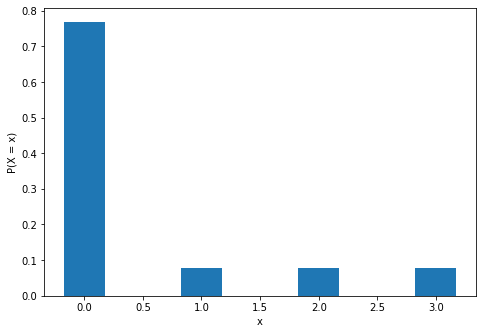

In [ ]:
x = np.arange(4)
y = [10/13, 1/13, 1/13, 1/13]
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(x, y, 0.35)
ax.set_xlabel('x')
ax.set_ylabel('P(X = x)')
plt.show()

### Exercise - probability distribution of rolling 1 die

What is the probability of each outcome when rolling a single die?

x  | 1 | 2 | 3 | 4 | 5 | 6
---|---|---|---|---|---|---
$f_{x}(x)$ = P(X = x) | $\cfrac{1}{6}$ |  $\cfrac{1}{6}$ |  $\cfrac{1}{6}$ |  $\cfrac{1}{6}$ | $\cfrac{1}{6}$ | $\cfrac{1}{6}$


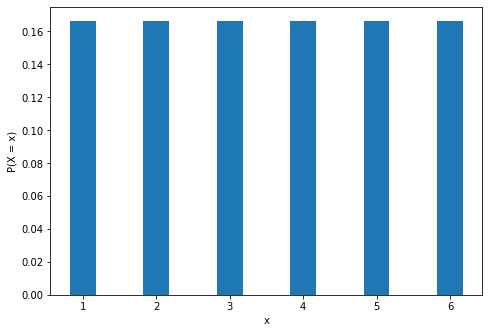

In [ ]:
x = np.arange(1, 7)
y = np.full(6, 1/6)
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(x, y, 0.35)
ax.set_xlabel('x')
ax.set_ylabel('P(X = x)')
plt.show()

### Exercise - probability distribution of rolling 2 dice

What is the probability of each outcome when rolling 2 dice?

| x  | 2  |  3 |  4 |  5 |  6 | 7  |  8 | 9  | 10  | 11  |  12 |
|---|---|---|---|---|---|---|---|---|---|---|---|
| $f_{x}(x)$ = P(X = x)  | $\cfrac{1}{36}$  |  $\cfrac{2}{36}$ | $\cfrac{3}{36}$  | $\cfrac{4}{36}$  |  $\cfrac{5}{36}$ | $\cfrac{6}{36}$  |  $\cfrac{5}{36}$ | $\cfrac{4}{36}$  | $\cfrac{3}{36}$  |  $\cfrac{2}{36}$ |  $\cfrac{1}{36}$ |


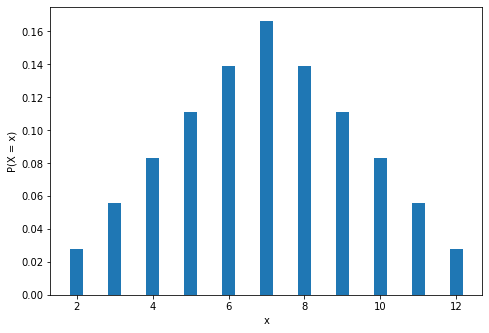

In [ ]:
x = np.arange(2, 13)
y = [1/36, 2/36, 3/36, 4/36, 5/36, 6/36, 5/36, 4/36, 3/36, 2/36, 1/36]
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(x, y, 0.35)
ax.set_xlabel('x')
ax.set_ylabel('P(X = x)')
plt.show()

### Exercise

Find which of the following are discrete random variables, giving a reason for any which are not.

1.

x  | 1 | 2 | 3 | 4 | 5
---|---|---|---|---|---
P(X = x) | $\cfrac{2}{10}$ |  $\cfrac{3}{10}$ |  $\cfrac{4}{10}$ |  $\cfrac{3}{10}$ |  $\cfrac{2}{10}$

2.

x  | -2 | -1 | 0 | 1 | 2
---|---|---|---|---|---
P(X = x) | $\cfrac{2}{10}$ |  $\cfrac{3}{10}$ |  $\cfrac{1}{10}$ |  $\cfrac{3}{10}$ |  $\cfrac{1}{10}$

3.

x  | 5 | 4 | 10 | 15 | 20
---|---|---|---|---|---
P(X = x) | $\cfrac{1}{2}$ |  $\cfrac{1}{4}$ |  $\cfrac{1}{8}$ |  $\cfrac{1}{16}$ |  $\cfrac{1}{16}$

4.

x  | 1 | 2 | 3 | 4 | 5
---|---|---|---|---|---
P(X = x) | $\cfrac{2}{10}$ |  $\cfrac{3}{10}$ |  $\cfrac{4}{10}$ |  $\cfrac{3}{10}$ |  $\cfrac{-2}{10}$



In [28]:
print("1. no: 1+2+3+4+5 != 1")
print("2. yes")
print("3. yes", 1/2 + 1/4 + 1/8 + 1/16 + 1/16)
print("4. een kans kan niet negatief zijn")

1. no: 1+2+3+4+5 != 1
2. yes
3. yes 1.0
4. een kans kan niet negatief zijn




### Exercise

A fair die is thrown. List the probability distribution for the following random variables:  

1. _X_ = score on the die  
2. _Y_ = 2 * score on the die  
3. _Z_ = square of the score on the die  
4. _W_ =
$
\begin{cases}
0 & \text{if the score on the die is a factor of 6}\\   
1 & \text{otherwise}\\    
\end{cases}
$

In [31]:
print(f"1. 1/6, 1/6, 1/6, 1/6, 1/6, 1/6")
print(f"2. 1/6, 1/6, 1/6, 1/6, 1/6, 1/6")
print(f"3. 1/6, 1/6, 1/6, 1/6, 1/6, 1/6")
print(f"4. 4/6, 2/6")

1. 1/6, 1/6, 1/6, 1/6, 1/6, 1/6
2. 1/6, 1/6, 1/6, 1/6, 1/6, 1/6
3. 1/6, 1/6, 1/6, 1/6, 1/6, 1/6
4. 4/6, 2/6


## Using the Probability Mass Function

Once you have a probability mass function, you can compute other probabilities. With the card game, what is the probability that you gain at most 2 EUR?

$P(X \leq 2) = P(X=0) + P(X=1) + P(X=2) = \frac{10}{13} + \frac{1}{13} + \frac{1}{13} = \frac{12}{13}$

We could also have used the complement rule in this case:

$P(X \leq 2) = 1 - P(X > 2) = 1 - P(X = 3) = 1 - \frac{1}{13} = \frac{12}{13}.$

### Exercise

When throwing two dice, what is the probability that the sum of the results is between 4 and 7, boundaries included?

$P(4 \leq X \leq 7) = P(X=4) + P(X=5) + P(X=6) +  P(X=7) = \frac{18}{36} = \frac{1}{2}$

We could also compute this using left-tail probabilities only:

$P(4 \leq X \leq 7) = P(X \leq 7) - P(X < 4) = P(X \leq 7) - P(X \leq 3) = \frac{21}{36} - \frac{3}{36} = \frac{1}{2}$





### Exercise
a)  

x  | 1 | 2 | 3 | 4 | 5
---|---|---|---|---|---
P(X = x) | $\cfrac{2}{10}$ |  $\cfrac{1}{10}$ |  $\cfrac{3}{10}$ |  $a$ |  $\cfrac{1}{10}$

i) Find $a$.  
ii) Find $P(X \geq 2)$


In [35]:
print(f"i. a =", 1 - 0.2-0.1-0.3-0.1)
print(f"ii. ", 1 - 2/10)

i. a = 0.30000000000000004
ii.  0.8



b)  

x  | -2 | -1 | 0 | 1
---|---|---|---|---
P(X = x) | $k$ |  $2k$ |  $2k$ |  $k$

i) Find $k$.  
ii) Find $P(X \leq 0)$


In [36]:
print(f"i. k = ", 1/6)
print(f"ii. ", 1 - 1/6)

i. k =  0.16666666666666666
ii.  0.8333333333333334



c)  

x  | 5 | 6 | 8 | 9 | 12
---|---|---|---|---|---
P(X = x) | $\cfrac{4}{10}$ |  $\cfrac{2}{10}$ |  $\cfrac{3}{10}$ |  $a$ |  $\cfrac{1}{10}$

i) Find $a$.  
ii) Find $P(X \geq 9)$


In [42]:
print(f"i. a = 0")
print(f"ii. ", 1/10)

i. a = 0
ii.  0.1


## Expectation of a discrete random variable

Consider the random variable associated with playing the card game with the following probability mass function

$
\begin{aligned}
  f_X(3) &=P(X=3) = \frac{1}{13},\quad & f_X(2) =P(X=2) = \frac{1}{13},\\
  f_X(1) &=P(X=1) = \frac{1}{13},\quad & f_X(0) =P(X=0) = \frac{10}{13}.
\end{aligned}
$

If somebody played this game  a very large number of times, what would their average earnings be?
I.e. what is the **expected value** of this random variable?

The **mean** or **expectation** of a discrete random variable is denoted by $\mu_X$ or $\text{E}(X)$ and is given by

$$\mu_X =\sum_{i} x_{i} P(X=x_{i})= \sum_{i} x_{i} f_X(x_{i})$$

Notes:

- The meaning of the formula is: we multiply each value by its probability and sum over all possible values of the random variable.
- there is a large similarity between this formula and the way you calculate the sample mean when a frequency table is given.
- we often write $\mu$ instead of $\mu_X$.

### Exercise

The expected value of the random variable associated with the card game is given by:

$
\begin{aligned}
\mu_X &=\sum_{i} x_{i} f_X(x_i) \\
      &= 0 \cdot f_X(0) + 1 \cdot f_X(1) + 2 \cdot f_X(2) + 3 \cdot f_X(3) \\
      &= 0 \cdot \frac{10}{13} + 1 \cdot \frac{1}{13} + 2 \cdot \frac{1}{13} + 3 \cdot \frac{1}{13} \\
      &=\frac{6}{13} \\
\end{aligned}
$

### Exercise

Members of a public library may borrow up to five books at any one time. The number of books borrowed by a member on each visit is a random variable, $X$, with the following probability distribution:

$X$  | 0 | 1 | 2 | 3 | 4 | 5
---|---|---|---|---|---|---
P(X = x) | $0.24$ |  $0.12$ |  $0.14$ |  $0.3$ |  $0.05$ |  $0.15$

Find the expected value of $X$.

In [43]:
print(f"X = ", 0*0.24 + 1*0.12 + 2*0.14 + 3*0.3 + 4*0.05 + 5*0.15)

X =  2.25


## Variance of a discrete random variable

The variance of a R.V. is a measure of dispersion that resembles the sample variance very closely.

The variance of a random variable is defined by:  

$
\begin{aligned}
\sigma_X^{2} &= \sum_{i} \left(x_{i}-\mu_X\right)^2 P(X = x_i)
             &= \sum_{i} \left(x_{i}-\mu_X\right)^2 f_X(x_{i}).
\end{aligned}
$

The **standard deviation** is the positive square root of the variance.

$$\sigma_X = \sqrt{\sigma^2_X}$$

### Variance: Intuition

- The random variable $X$ represents the number of received emails per day for a first office worker. This person receives either 48 or 52 emails per day, each with a 50 percent probability.
- The random variable $Y$ represents the number of received emails of a second office worker. This second person receives no emails at all with 50 percent probability and with 50 percent chance receives 100 emails.



### Exercise

1. $Y$ is the larger score showing when two dice are thrown.

    Calculate $E(Y)$.

2. $Y$ is the smaller score showing when two dice are thrown.  

    Calculate $E(Y)$ and $Var(Y)$.

3. A regulare customer in a shop observes that the number of customers, $X$, in a shop when she enters has the following probability distribution

    | No. of customers  | 0 | 1 | 2 | 3 | 4 |
    |---|---|---|---|---|---|
    |P(X = x) | $0.1$ |  $0.25$ |  $0.3$ |  $0.25$ |  $0.1$|

    - Find the mean and standard deviation of $X$.  

    The same customer also observes that the average waiting time, $Y$, before being served is as follows:

    | No. of customers  | 0 | 1 | 2 | 3 | 4 |
    |---|---|---|---|---|---|
    |Average wait (minutes) | $0$ |  $2$ |  $5$ |  $8$ |  $11$ |

    - Find the mean waiting time.  

In [14]:
print("1. ", 1*1/6 + 2*1/6 + 3*1/6 + 4*1/6 + 5*1/6 + 6*1/6)
print("2. ", ((1-3.5)**2 * 1/6) + ((2-3.5)**2 * 1/6) + ((3-3.5)**2 * 1/6) + ((4-3.5)**2 * 1/6) + ((5-3.5)**2 * 1/6) + ((6-3.5)**2 * 1/6))

1.  3.5
2.  2.916666666666667


In [17]:
print("3. ", 0*0.1 + 1*0.25 + 2*0.3 + 3*0.25 + 4*0.1)
std = (((0-2)**2) *0.1) + (((1-2)**2) *0.25) + (((2-2)**2) *0.3) + (((3-2)**2) *0.25) + (((4-2)**2) *0.1)
print(np.sqrt(std))
print(0.1*0 + 0.25*2 + 0.3*5 + 0.25*8 + 0.1*11)

3.  2.0
1.140175425099138
5.1


## Continuous Random Variable

A continuous random variable takes on an uncountably infinite number of possible values.

- In this case it doesn’t make a lot of sense to consider the probability that 𝑋 equals some number 𝑎 exactly, because this probability is always zero.
- What does make sense is to consider the probability that 𝑋 takes on a value in some interval [𝑎, 𝑏].
- This probability can be found be integrating (i.e. “summing up”) the probability density function of the random variable.

### Example

The times taken by competitors in the swiming section of a triathlon are shown in the following histograms, with smaller and smaller intervals:

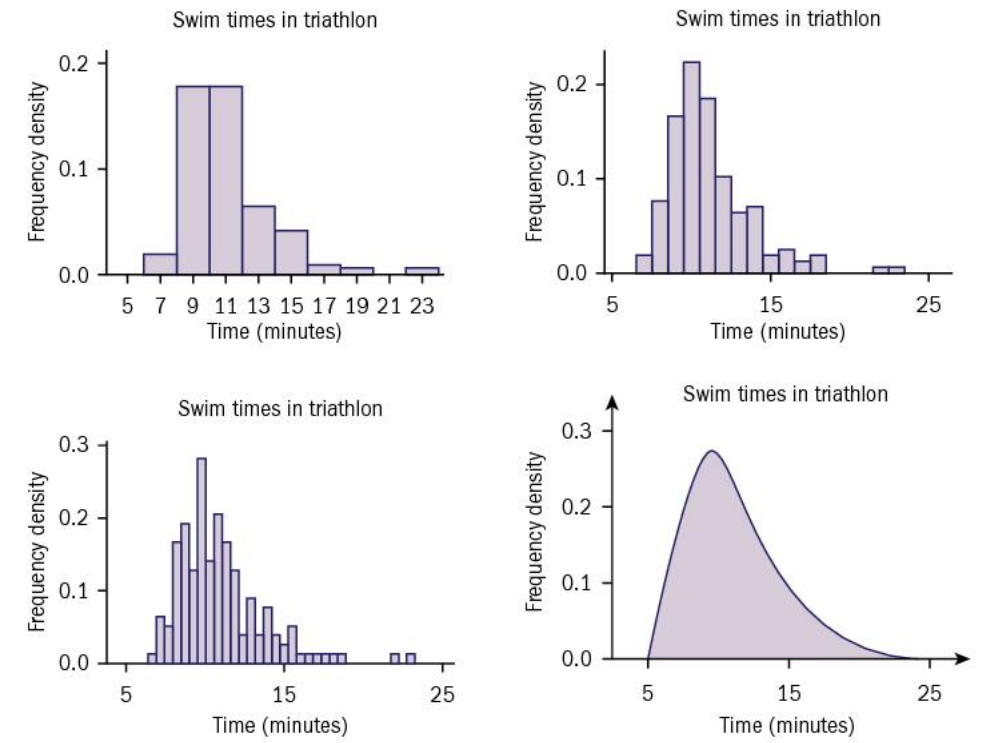

As the number of intervals increases (in the first three graphs), the data show jagged edges. This is a representation of a finite number of observations - and if another set of observations was made, you would expect to see something broadly similar but the detail is unlikely to be exactly the same. The fourth graph looks like a plausible description of the distribution of times for the swim section of the triathlon in that competition.

On a different day, if the weather is different, with different competitors, or on a different course the distribution might be different.

These histograms are drawn as **frequency density** diagrams, so the total area of all the bars is always 1. The limit of the cases where smaller and smaller intervals are taken, but the total area stays at 1, is what is meant by a **continuous random variable**. The probabilities are defined as the area under the curve between two values of $x$. Measurements of length, time, … are examples of continuous random variables.

- A continuous random variable takes on an uncountably infinite number of possible values.
- In this case it doesn’t make a lot of sense to consider the probability that 𝑋 equals some number 𝑎 exactly, because this probability is always zero.
- What does make sense is to consider the probability that 𝑋 takes on a value in some interval [𝑎, 𝑏].
- This probability can be found be integrating (i.e. “summing up”) the probability density function of the random variable.


## Expectation and Variance of a Continuous Random Variable

As there are formulas for expectation and variance for discrete random variables, there are also formulas for expectation and variance for continuous random variables.
The expectation is given by

$$\mu_X= \int_{-\infty}^{+\infty}x\, f_X(x)\,\mathrm{d}x,$$

while the variance $\sigma^2_X$ is given by

$$\sigma^{2}_X= \int_{-\infty}^{+\infty}\left(x-\mu_X\right)^2 f_X(x)\,\mathrm{d}x$$

These are essentially the same formulas as for discrete R.V.'s but with integrals instead of summations.  

[You are **not** expected to know how to calculate integrals!]

## Continuous probability distributions and the normal distribution

The **normal distribution** frequently occurs in the real world. For example, the heights, weights, of people often follow an approximate normal distribution.



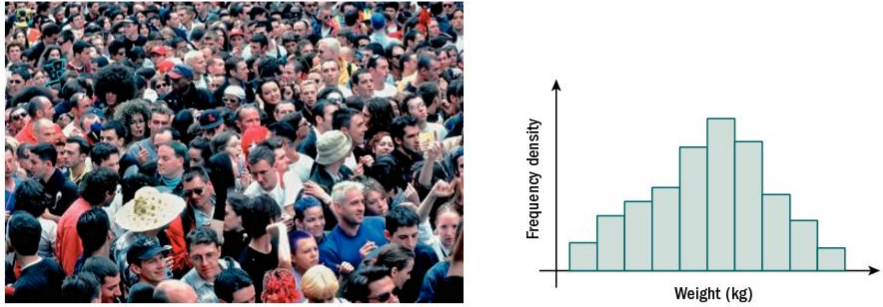

The dimensions of manifactured articles will often follow a normal distribution as well.

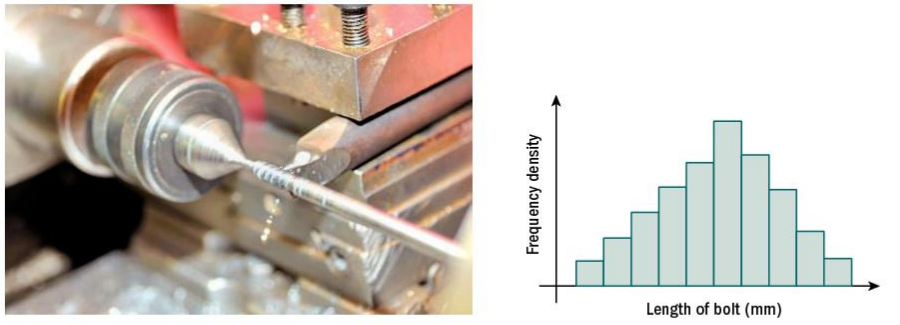

The normal distribution is a type of **continuous probability distribtuion**. This means that:
- It relates to a continous variable (height, weight, etc.).
- It describes the **probability** of this variable taking a particular range of values.

Generall the normal distribution looks like this:

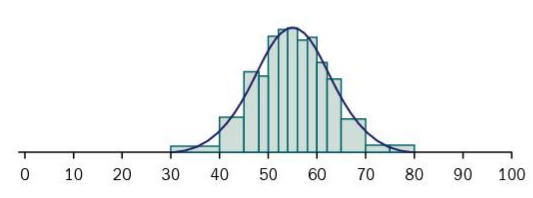


The idealised normal distribtuion has the following properties:

- It is symmetric.
- It is infinite in both directions.
- It has a single peak at the centre.
- It is continuous.
- 95% of values lie within approximately 2 **standard deviations** of the **mean**.
- 99% lie within approximately 3 standard deviations of the mean.

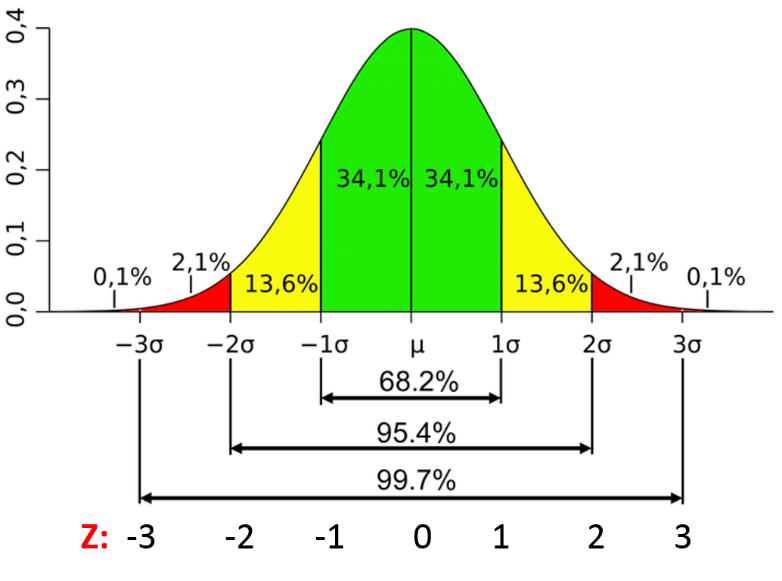


In practice, real-life variables usually do not match all these conditions perfectly and the situations will only approximate the normal distribution. For example, height and weight cannot take negative values, however a zero value may occur a long way out towards the tail of the distribution, as in the previous diagram, where the left hand end of the graph is already invisible at 20. If the value were not towards the tail, the the normal distribution would not be a reasonable approximation to use in that situation. 

### Standardised scores

The normal distribution allows us to make comparisons between individuals in a particular **normal population**. However, it becomes harder with different normal populations, for example we use different criteria to judge a 'tall man' than we use for a 'tall woman'.  

### Python functions

`import scipy.stats`

For a normal distribution with mean m and standard deviation s:

| Function                        | Purpose                         |
| :---                            | :---                            |
| `norm.pdf(x, loc=m, scale=s)`   | Probability density at $x$      |
| `norm.cdf(x, loc=m, scale=s)`   | Left-tail probability 𝑃(𝑋 < x)  |
| `norm.sf(x, loc=m, scale=s)`    | Right-tail probability 𝑃(𝑋 > x) |
| `norm.isf(1-p, loc=m, scale=s)` | p% of observations are expected to be lower than result    |

Since the normal distribution is continuous the probability of particular values is zero, so it does not make any difference whether the inequality is strict or not. 

### Example

In her exams, Alexandra scores 75 in History and 83 in Maths. For the year group as a whole, History has a mean score of 63 in the examination with a standard deviaion of 8, while Maths has a mean of 69 with a standard deviation of 15. Compare Alexandra's performance in these two subjects.

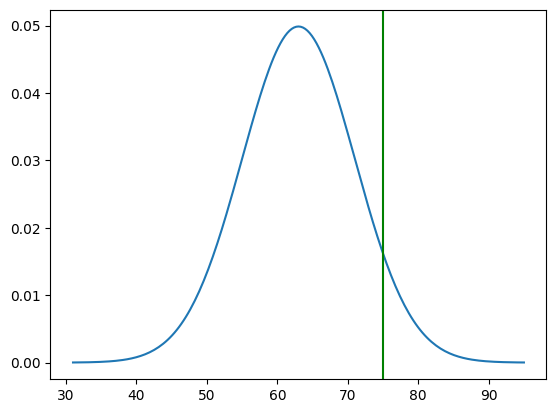

In [9]:
mu = 63    # Mean score History
sigma = 8  # Standard deviation History
x = np.linspace(mu - 4 * sigma, mu + 4 * sigma, num=201)
y = stats.norm.pdf(x, mu, sigma)
plt.plot(x, y)
plt.axvline(75, color="green"); # Show a green line for Alexandra's score for History

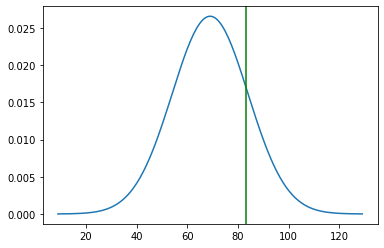

In [ ]:
mu = 69    # Mean score Maths
sigma = 15  # Standard deviation Maths
x = np.linspace(mu - 4 * sigma, mu + 4 * sigma, num=201)
y = stats.norm.pdf(x, mu, sigma)
plt.plot(x, y)
plt.axvline(83, color="green") # Show a green line for Alexandra's score for Maths

There is reason to say that Alexandra's performance is better in History than in Maths. The normal distribution is written As $X \sim Nor(\mu , \sigma)$.  
This means '$X$ is distributed as a normal random variable with mean $\mu$ and standard deviation $\sigma$'.  
Since all normal distribution are the same basic shape, we only need to have probabilities for one particular case to allow us to calculate probabilities for all cases.

## Normal distribution $Nor(\mu,\sigma)$

All normal distributions are essentially the same shape - they may have a different centre, or be more peaked, but they can all be standardised to the $Nor(0,1)$ distribution.

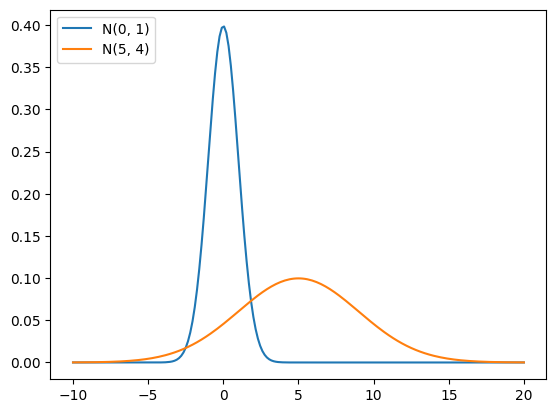

In [29]:
x = np.linspace(-10, 20, num=201)

plt.plot(x, stats.norm.pdf(x, 0, 1), label="N(0, 1)");  # Standard normal distribution
plt.plot(x, stats.norm.pdf(x, 5, 4), label="N(5, 4)");  # N(5, 4)
plt.legend(loc="upper left");

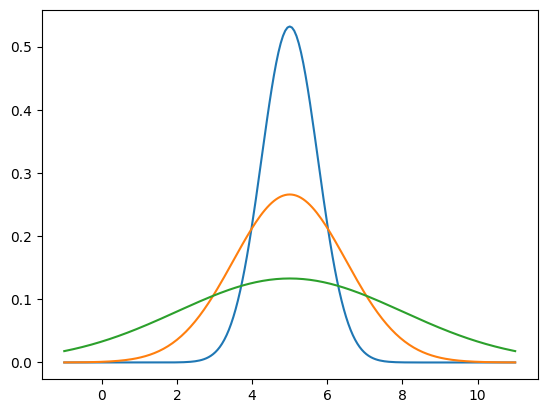

In [33]:
# Probability density of a normal distribution with different standard
# deviations
m = 5    # Mean
x = np.linspace(-1, 11, num=201)

plt.plot(x, stats.norm.pdf(x, loc=m, scale=.75));
plt.plot(x, stats.norm.pdf(x, loc=m, scale=1.5));
plt.plot(x, stats.norm.pdf(x, loc=m, scale=3));

The **standard normal distribution** has mean 0 and variance 1. The variabel $Z$ is often used for the standard normal distribution: $Z \sim N(0,1)$  

By converting values to the standard normal distribution, you can calculate probabilities for any normal distribution. I.e. one way to compare different normal populations is to standardise the scores - by looking at their distance from the mean, then dividing by the size of the standard deviation.


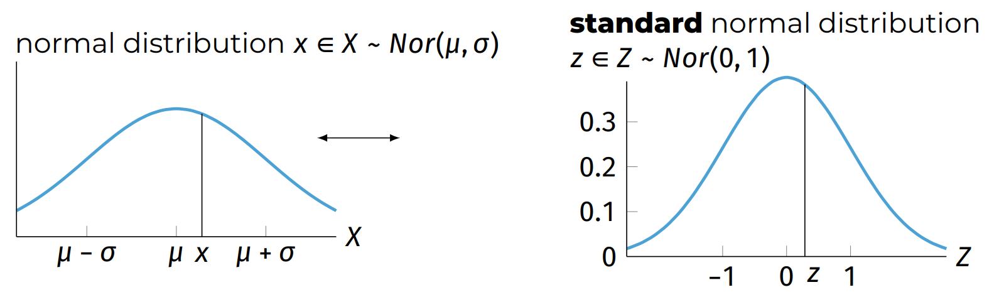

To find the **standardised score**, $z$, from a raw score, $x$, use the conversion $x = \mu + z . \sigma$  and $z = \frac{x - \mu}{\sigma}$ where $\mu$ is the mean and $\sigma$ is the standard deviation of the raw scores. The standardised score is often called the **$z$**-score.


Text(0.5, 1.0, 'Standard Normal Distribution')

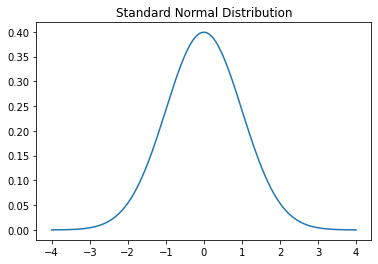

In [ ]:
mu = 0    # Mean
sigma = 1  # Standard deviation
x = np.linspace(mu - 4 * sigma, mu + 4 * sigma, num=201)
y = stats.norm.pdf(x, mu, sigma)
plt.plot(x, y)
plt.title("Standard Normal Distribution")

### Exercise

If $Z \sim Nor(0, 1)$ find

1. $P(Z < 1.62)$
2. $P(Z > 0.76)$
3. $P(Z < -1.32)$
4. $P(-1.2 < Z < 1.7)$

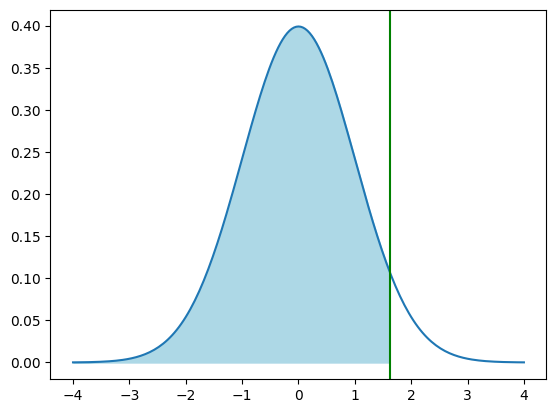

In [36]:
mu = 0    # Mean
sigma = 1  # Standard deviation
x = 1.62
dist_x = np.linspace(mu - 4 * sigma, mu + 4 * sigma, num=201)
dist_y = stats.norm.pdf(dist_x, mu, sigma)
plt.plot(dist_x, dist_y)
# Fill the area left of x
plt.fill_between(dist_x, 0, dist_y, where=dist_x <= x, color='lightblue')
plt.axvline(x, color="green")

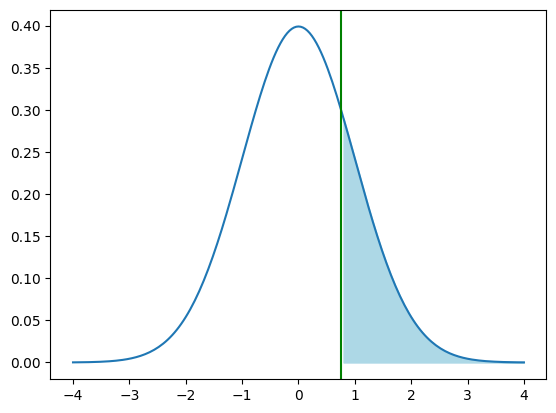

In [51]:
mu = 0    # Mean
sigma = 1  # Standard deviation
x = 0.76
dist_x = np.linspace(mu - 4 * sigma, mu + 4 * sigma, num=201)
dist_y = stats.norm.pdf(dist_x, mu, sigma)
plt.plot(dist_x, dist_y)
# Fill the area left of x
plt.fill_between(dist_x, 0, dist_y, where=dist_x >= x, color='lightblue')
plt.axvline(x, color="green")


In [50]:
print("1. P(Z < 1.62) ~= %.4f" % stats.norm.cdf(1.62, loc=0, scale=1))
print("2. P(Z > 0.76) ~= %.4f" % stats.norm.sf(0.76, loc=0, scale=1))
print("3. P(Z < -1.32) ~= %.4f" % stats.norm.cdf(-1.32, loc=0, scale=1))
deel = stats.norm.cdf(x=1.7, loc=0, scale=1) - stats.norm.cdf(x=-1.2, loc=0, scale=1)
print("4. P(-1.2 < Z < 1.7) ~=", deel)

1. P(Z < 1.62) ~= 0.9474
2. P(Z > 0.76) ~= 0.2236
3. P(Z < -1.32) ~= 0.0934
4. P(-1.2 < Z < 1.7) ~= 0.8403648670197488


### Exercise

The reaction speed 𝑥 of Superman (in ms) can be represented as $X \sim Nor(5, 1.5)$

1. What is the probability that Superman reacts in less than 4 ms?
2. What is the probability that he reacts in less than 7 ms?
3. What is the probability that he reacts in less than 3 ms?
4. What is the probability that he reacts between 2 en 6.5 ms?
5. What interval contains 80% of his reaction speed?

In [45]:
mu = 5
sigma = 1.5
print("1. What is the probability that Superman reacts in less than 4 ms?", stats.norm.cdf(4, loc=mu, scale=sigma))
print("2. What is the probability that he reacts in less than 7 ms?", stats.norm.cdf(7, loc=mu, scale=sigma))
print("3. What is the probability that he reacts in less than 3 ms?", stats.norm.cdf(3, loc=mu, scale=sigma))
print("4. What is the probability that he reacts between 2 en 6.5 ms?", stats.norm.cdf(6.5, loc=mu, scale=sigma) - stats.norm.cdf(2, loc=mu, scale=sigma))
print("5. What interval contains 80% of his reaction speed?", stats.norm.isf(0.2, loc=mu, scale=sigma))


1. What is the probability that Superman reacts in less than 4 ms? 0.2524925375469229
2. What is the probability that he reacts in less than 7 ms? 0.9087887802741321
3. What is the probability that he reacts in less than 3 ms? 0.09121121972586788
4. What is the probability that he reacts between 2 en 6.5 ms? 0.8185946141203637
5. What interval contains 80% of his reaction speed? 6.262431850359372


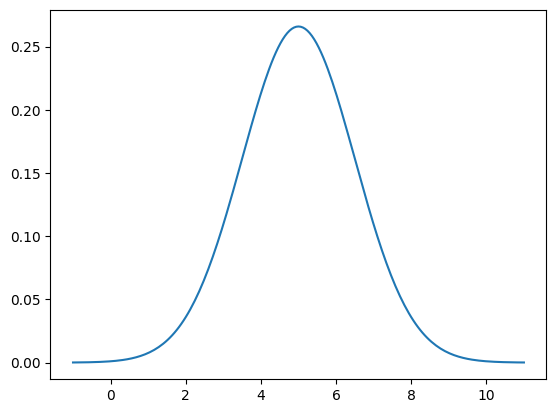

In [52]:
mu = 5    # Mean
sigma = 1.5  # Standard deviation
dist_x = np.linspace(mu - 4 * sigma, mu + 4 * sigma, num=201)
dist_y = stats.norm.pdf(dist_x, mu, sigma)
plt.plot(dist_x, dist_y)

### Exercise 

The lengths of steel girders produced in a factory are nomally distributed with a mean length of 12.5 m and a variance of 0.0004 m². Girders need to be between 12.47 and 12.53 metres to be used in construction.

1. Find the proportion of girders which cannot be used for construction. Girders are extremely expensive to produce, and the company is not happy with this level of wastage. A new machine is installed which reduces the variance of the production to 0.0002 m² while maintaining a normal distribution with the same mean as before.
2. Find the proportion of girders produced by the new machine which cannot be used for construction.

In [56]:
mu = 12.50
sigma = np.sqrt(0.0004)
sol1 = stats.norm.cdf(12.53, mu, sigma) - stats.norm.cdf(12.47, mu, sigma)
print("1.", 1 - sol1)
newsigma = np.sqrt(0.0002)
sol2 = stats.norm.cdf(12.53, mu, newsigma) - stats.norm.cdf(12.47, mu, newsigma)
print("2.", 1 - sol2)

1. 0.13361440253772439
2. 0.033894853524693014


### Exercise

In an examination the marks are normally distributed with mean 60.7 and a standard deviation of 12.3.

1. A candidate needs a mark of 40 to pass. Approximately what percentage of candidates fail?
2. The board awards distinctions to the best 10% of the candidates. What is the least mark a candidate will to get a distinction?

In [61]:
mu = 60.7
sigma = 12.3
sol1 = stats.norm.sf(40, mu, sigma)
print("1.", (1-sol1) * 100)
sol2 = stats.norm.isf(0.1, mu, sigma)
print("2.", sol2)

1. 4.619462854530065
2. 76.46308425619858


### Exercise

A machine pours melted chocolate into moulds. The standard deviation of the amount is pours is 0.7 grams, and the mean amount can be set on the machine.
The amount poured may be assumed to follow a normal distribution.  
The machine is to produce bars whose labels says 50g of chocolate.  
The company's lawyers want to have no more than 0.5% of bars containing less than the advertised weight.  
What should the mean be set at?

In [65]:
# We want P(X < 50) = 0.005, with sigma = 0.7
# Find the z-score for the lower 0.5% tail
z = stats.norm.ppf(0.005)
# Solve for mu: 50 = mu + z * sigma => mu = 50 - z * sigma
required_mu = 50 - z * sigma
print("The mean should be set at:", required_mu, z)

# x = mu + z*sigma
# mu = x - (z*sigma)
sigma = 0.7
mu = 50 - (0.005 * 0.7)
print(mu)

The mean should be set at: 51.80308051248423 -2.575829303548901
49.9965


### Histogram with theoretical probability density

The next example shows how to plot a histogram of normally distributed data, with the theoretical probability density function superimposed as a line graph.

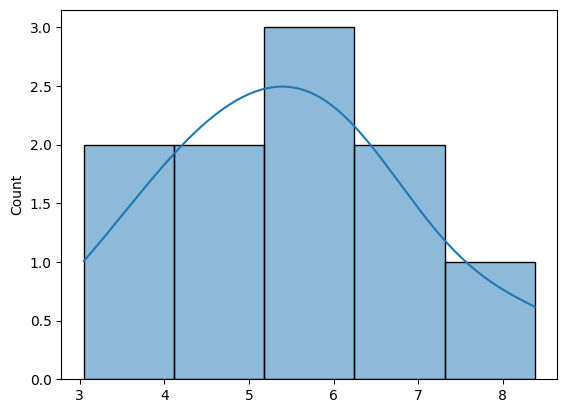

In [22]:
# Generate n random numbers, following a normal distribution
m = 5    # Mean
s = 1.5  # Standard deviation

# Increase the value for n and see how the histogram changes!
n = 10
observations = np.random.normal(loc=m, scale=s, size=n)

# Plot histogram, without probability density
obs_hist = sns.histplot(observations, kde=True)

If you plot a Gauss curve on the histogram above, you won't see much (try this for yourself!). After all, the scale on the y-axis for the Gauss curve is much smaller than that of the histogram (see the plot of a normal distribution above). The maximum value of a density function is always a number between 0 and 1 (since the area under the curve must be equal to 1), while a histogram counts how many times each observation occurs and consequently is usually larger than 1.

The solution is to draw a histogram showing *densities*. In this case, the *area* of a member is equal to the *relative* frequency of that class. (The *density* or *density* is the *relative* frequency divided by the *width* of the class.) The sum of all areas of all bars is one. This corresponds to the area under the Gauss curve which is also equal to one. The histogram and the Gauss curve can then use the same y-axis.

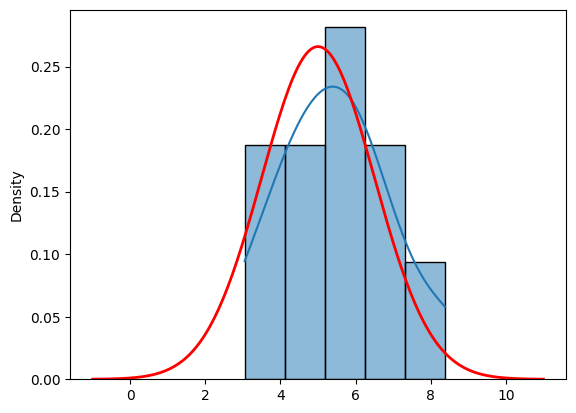

In [23]:
# histogram with observations
obs_hist = sns.histplot(observations, stat = "density", kde=True)

# X-axis values
dist_x = np.linspace(m - 4 * s, m + 4 * s, num=201)
# Probability density for the X-values
dist_y = stats.norm.pdf(dist_x, m, s)

# Plot the Gauss curve superimposed on the histogram
obs_hist.plot(dist_x, dist_y, 'red', lw=2)

## Exponential Distribution

Besides the Normal Distribution, there are other often used continuous distributions, e.g. the Exponentional Distribution. Values for an exponential random variable occur when there are fewer large values and more small values. For example, the amount of money customers spend in a trip to the supermarket follows an exponential distribution. There are more people who spend small amounts of money and fewer people who spend large amounts of money. 

Another example is the length, in minutes, of long distance business telephone calls or the amount of time (in minutes) a postal clerk spends with his or her customers. In the image below, the time is known to have an exponential distribution with an average amount of time equal to four minutes.

(0.0, 0.4)

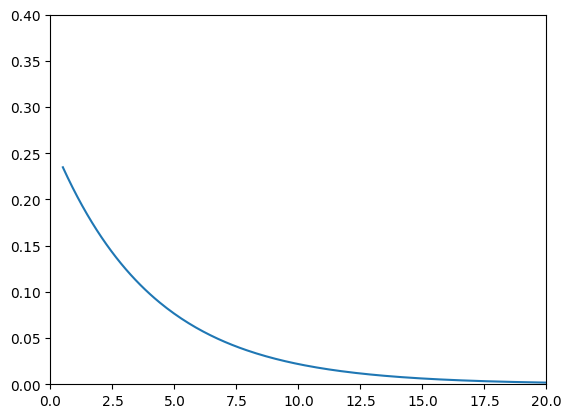

In [ ]:
f, ax = plt.subplots(1, 1)

dist_x = np.linspace(0.5, 20, num=201)
dist_y = stats.expon.pdf(dist_x, loc = 0.25, scale = 4)
plt.plot(dist_x, dist_y)

plt.xlim((0,20))
plt.ylim((0,0.4))

## Continuous Uniform Distribution

The continuous Uniform Distribution describes an experiment where there is an arbitrary outcome that lies between certain bounds. It is the simplest of all continuous probability distributions. The density function is constant where every value has an equal chance of occurring.

Imagine you live in a building that has an elevator that will take you to your floor. From experience, once you push the button to call the elevator, it takes between ten and twenty seconds to arrive at your floor. This means the elevator arrival time is uniformly distributed between 10 and 20 seconds once you hit the button

(0.0, 0.2)

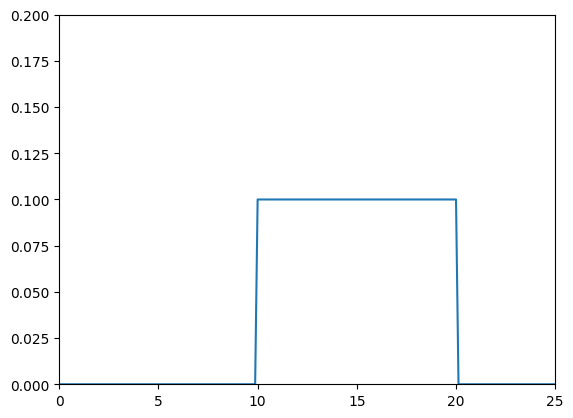

In [ ]:
f, ax = plt.subplots(1, 1)

dist_x = np.linspace(0, 25, num=201)
dist_y = stats.uniform.pdf(dist_x, loc=10, scale=10)
plt.plot(dist_x, dist_y)

plt.xlim((0,25))
plt.ylim((0,0.2))

The total area under the probability density function is
always equal to 1.  
So it holds that that $P(10 \leq  X  \leq 20) = 1$  

$P(13 < X < 18)$ = area under $f_X(x)$ between13 and 18 = $5$ x $0.1$ = $0.5$

Note:  
$P(13 < X < 18) = P(13 < X \leq 18) = P(13 \leq X < 18) = P(13 \leq X \leq 18)$


**Source**  
Complete Probability & Statistics 1 & 2 for Cambridge International AS & A Level

# Module 3.02 - Central Limit theorem and confidence intervals

In [2]:
# Importing the necessary packages
import numpy as np                                  # "Scientific computing"
import scipy.stats as stats                         # Statistical tests

import pandas as pd                                 # Data Frame
from pandas.api.types import CategoricalDtype

import matplotlib.pyplot as plt                     # Basic visualisation
from statsmodels.graphics.mosaicplot import mosaic  # Mosaic diagram
import seaborn as sns                               # Advanced data visualisation

## Central Limit Theorem (CLT)

If the size of the sample is sufficiently large, the probability distribution of the sample mean will approximate a normal distribution, regardless of the probability distribution of the underlying population.

In other words, consider a random sample of _n_ observations drawn from a population with expected value $\mu$ and standard deviation $\sigma$. If _n_ is sufficiently large, the probability distribution of the sample mean $\bar{x}$ will approximate a normal distribution with mean $\mu_{\bar{x}} = \mu$ and standard deviation $\sigma_{\bar{x}} = \frac{\sigma}{\sqrt{n}}$

The Central Limit Theorem says that the distribution of sample means become approximately normal as the sample size increases, no matter what the underlying population is, and at this level an arbitrary cutoff of n = 30 is applied as a standard rule of thumb as to what sample size is needed in order to use the CLT.

For any underlying population, increasing the sample size will make the sampling distribution of the mean look more like the normal. No matter how strange the underlying distribution is, by the time the sample size gets to 30 the distribution will be passably close to the normal distribution.

See the demo at <https://www.zoology.ubc.ca/~whitlock/Kingfisher/CLT.htm>

### Exercise

On a flight there are 43 bags checked in. Historical records show that on that route the mean weight of checked bags is 12.1kg with a standard deviation of 3.8kg.  
What is the probability that the mean contents of the checked bags on this flight will be under 11 kg? (You may treat the bags on this flight as though they are a random sample of bags checked in on that route.)  
Even though you know nothing about the distribution of the weights of bags themselves, the Central Limit Theorem allows you to solve this. (Answer: 0.0288)

0.02883448270747309


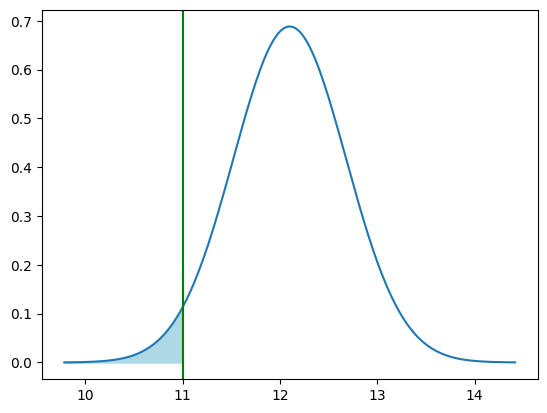

In [10]:
mu = 12.1
sigma = 3.8
n = 43
u = 11
se = sigma / np.sqrt(n)
kans = stats.norm.cdf(u, loc=mu, scale=se)
print(kans)

x = np.linspace(mu - 4 * se, mu + 4 * se, num=201)
y = stats.norm.pdf(x, loc=mu, scale=se)
plt.plot(x, y)
plt.axvline(u, color="green");
plt.fill_between(x, y, where=(x <= u), color="lightblue");

### Exercise

The times for a particular journey during rush hour in a large city have mean 23.3 minutes and standard deviation 8.9 minutes.  
Find the probability that the mean time taken for a random sample of 60 of the times for this journey is under 25 minutes. (Answer: 0.9305)

Answer: 0.9305


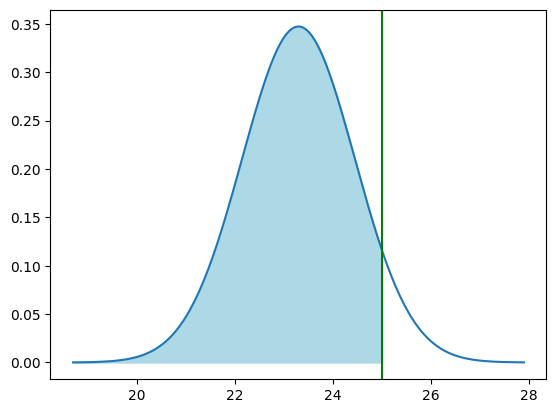

In [11]:
mu = 23.3
sigma = 8.9
n = 60
u = 25
se = sigma/np.sqrt(n)
kans = stats.norm.cdf(u, loc=mu, scale=se)
print("Answer: %.4f" %kans)

x = np.linspace(mu - 4 * se, mu + 4 * se, num=201)
y = stats.norm.pdf(x, loc=mu, scale=se)
plt.plot(x, y)
plt.axvline(u, color="green");
plt.fill_between(x, y, where=(x <= u), color="lightblue");

## Point estimate

A **Point Estimate** for a population parameter is a formula or equation that allows us to calculate a value to estimate that parameter.

Example: sample variance/standard deviation, sample mean.

A point estimate is a single numeric value, a 'best guess' of a population parameter, based on the data in a random sample.

## Confidence Interval

A **confidence interval** is an equation or formula that allows us to construct an interval that will contain the parameter to be estimated with a certain level of confidence.

A confidence interval is an interval around the point estimate, calculated from the sample data, that is very likely to contain the true value of the population parameter.

The typical form of a Confidence Interval is **Point Estimate ± Multiple × Standard Error**.

As will be explained in the following paragraphs, when estimating a population mean, the point estimate is the sample mean $\overline{x}$, the **standard error** is the standard deviation $\sigma$ divided by the square root of the sample size $n$ (i.e. the standard error is $\frac{\sigma}{\sqrt{n}}$), and the multiple is approximately equal to 2.

We can calculate the Confidence Interval for 

* a mean  
* a standard deviation  
* the difference between means  
* a total 
* ... 

In this course, only the confidence interval of the mean is discussed 



## Confidence Interval for the mean of a large sample from any distribution

Given a sample with mean $\bar{x}$.

We are looking for an interval [$\bar{x} - b$, $\bar{x} + b$] for which we can say with a level of confidence (1 - $\alpha$) of e.g. 95% that $\mu$ is inside this interval.

$P(\bar{x} - b < \mu < \bar{x} + b) = 1 - \alpha = 0.95$ 


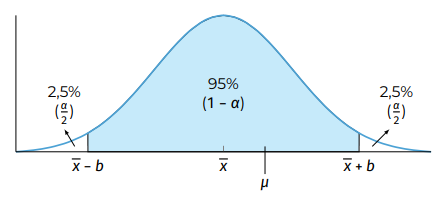

Because of the central limit theorem we know that $\bar{x} ∈ \bar{X} ∼ Nor(\mu, \frac{\sigma}{\sqrt{n}}) $  
And because of the symmetry we can say:  
$P(\bar{x} - b < \mu < \bar{x} + b) = P(\mu - b < \bar{x} < \mu + b)$ 

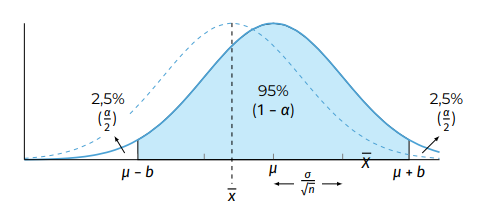

We now calculate the _z_-score for $\bar{x}: z = \frac{\bar{x} - \mu}{\frac{\sigma}{\sqrt{n}}}$  
We lookup (or calculate) the value $z_{\frac{\alpha}{2}}$ for which:  
$P(-z_{\frac{\alpha}{2}} < z < z_{\frac{\alpha}{2}}) = 1 - \alpha = 0.95$  
$P(z < z_{\frac{\alpha}{2}}) = 1 - \frac{\alpha}{2} = 0.975$  
$z_{\frac{\alpha}{2}}$ = stats.norm.isf(1 - 0.975, 0, 1) $≃ 1.96$  


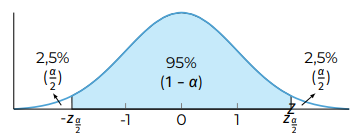





The result is:

$P(-1.96 < \frac{\bar{x} - \mu}{\frac{\sigma}{\sqrt{n}}} < 1.96) = 0.95$  
$P(\mu - 1.96 \frac{\sigma}{\sqrt{n}} < \bar{x} < \mu + 1.96 \frac{\sigma}{\sqrt{n}}) = 0.95$  
Because of symmetry we can swap $\mu$ and $\bar{x}$:  

$P(\bar{x} - 1.96 \frac{\sigma}{\sqrt{n}} < \mu < \bar{x} + 1.96 \frac{\sigma}{\sqrt{n}}) = 0.95$  
Now we can say with 95% confidence that: 
$ \mu ∈ [\bar{x} - 1.96 \frac{\sigma}{\sqrt{n}}, \bar{x} + 1.96 \frac{\sigma}{\sqrt{n}} ]$  
In practice we will use $s_{sample}$ as a point estimate for $\sigma_{population}$

To determine a confidence interval, we proceed as follows:

1. We take the sample mean as an initial estimate and choose a confidence level, eg  1−α=0.95  (or 95%).
2. We then find the  z  score between which 95% of all values lie with a standard normal distribution.
3. We use this to determine the values to the left and right of the sample mean between which we expect 95% of the values to fall for the probability distribution that we get from the central limit theorem.

### Example

A random sample of 45 cans of mixed beans gave a sample mean of 324.6 grams and we know from historical data that the standard deviation of the population is 2.5. Calculate a 95% confidence interval for the population mean weight.

In [14]:
import math
# Step 1.
m = 324.6      # Sample mean
s = 2.5      # Population standard deviation
n = 45      # Sample size
alpha = .05  # 1 - alpha is the confidence level

# Step 2.
z = stats.norm.isf(alpha/2)
print("z-score: %.5f" % z)

# Step 3.
lo = m - z * s / np.sqrt(n)
hi = m + z * s / np.sqrt(n)
print("Confidence interval: [%.4f, %.4f]" % (lo, hi))

z-score: 1.95996
Confidence interval: [323.8696, 325.3304]


In [15]:
# Or, with the interval() function:
stats.norm.interval(1-alpha, loc=m, scale=s/np.sqrt(n))

(np.float64(323.86956454951957), np.float64(325.3304354504805))

### True meaning of 95% Confidence Interval

Given the data in a particular sample, a 95% confidence interval for the mean will either include the (unknown) population mean or it won't. The true meaning of a 95% confidence interval is that if the same procedure is used on many different random samples, about 95% of the resulting confidence intervals will include the population mean, and only about 5% won't. Therefore, you can be 95% confident that any particular confidence interval is a "good" one.

The diagram below tries to illuminate this visually:

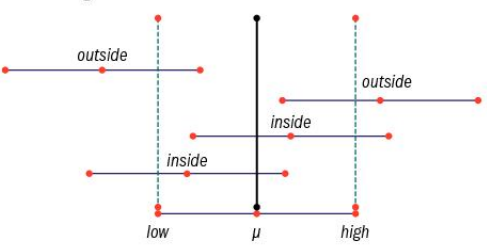

The bottom of the diagram shows $\mu - 1.96 \frac{\sigma}{\sqrt{n}}$, $\mu$, and $\mu + 1.96 \frac{\sigma}{\sqrt{n}}$ as the interval centered on the true population mean $\mu$. There are then four intervals shown, of the same width, centered on four possible observed values of $\bar{x}$. For the bottom two, the value of $\bar{x}$ lies inside the interval centered on $\mu$ but for the top two the value of $\bar{x}$ lies outside. The bold black line shows where the value of $\mu$ is - and it cuts the two bottom intervals but not the top two intervals.  
So 95% of the time the true population mean will be captured by a confidence interval constructed in this way. You should talk about the true population mean lying in the confidence interval on 95% of occasions a confidence interval is constructed rather than talking about a probability.  

One thing to note is taht in a lot of production processes the variability of the output is quite stable - it is a function of the quality of the process. 
The mean can usually be altered by a settin on the machinery and can often move while the process is underway. 
So, where you usually need to calculate the standard deviation (or variance) in data, in a production process you will often know the standard deviation and can use this in constructin an interval estimate for the mean.  

The usual size of confidence interval is 95%, but it is not the only possible one.  

Technically, you can construct any size of confidence interval you choose to for a conintuous distribution but in practical terms there are three others which are the most common alternatives: 90%, 98% and 99%.  

### Exercise

1. Give the 90% confidence interval (Answer: [323.9870,325.2130])
2. Give the 98% confidence interval (Answer: [323.7330,325.4670])
3. Give the 99% confidence interval (Answer: [323.6400,325.5600])

In [16]:
m = 324.6
s = 2.5
n = 45
alpha = 0.01
se = s/np.sqrt(n)

z = stats.norm.isf(alpha/2)
print("z: %.2f" %z)

low = mu - z * se
high = mu + z * se

print("Confidence interval: [%.4f, %.4f]" % (low, high))

print(stats.norm.interval(0.9, loc=m, scale=s/np.sqrt(n)))
print(stats.norm.interval(0.98, loc=m, scale=s/np.sqrt(n)))
print(stats.norm.interval(0.99, loc=m, scale=s/np.sqrt(n)))

z: 2.58
Confidence interval: [323.6400, 325.5600]
(np.float64(323.98699924618325), np.float64(325.2130007538168))
(np.float64(323.7330213357221), np.float64(325.4669786642779))
(np.float64(323.64004509647145), np.float64(325.5599549035286))


## Confidence Interval for the mean of a small sample

### Confidence Interval for the mean of a small sample from a normal distribution

The above formulas are retained if the sample comes from a normal distribution.

### Confidence Interval for the mean of a small sample from any other distribution

When we have a **small sample** ($n < 30$), the assumption we made in the central limit theorem no longer holds. In that case we cannot use the normal distribution.

However, there is still a way to construct a confidence interval via the so-called Student-$t$ distribution. This distribution resembles the normal distribution in that the probability density function looks like a Gauss curve. However, the Student-$t$ distribution also takes the sample size $n$ into account, so you must specify it. The density function gets an extra parameter called the number of *degrees of freedom* (abbreviated `df` of `dof`) and is equal to $n - 1$.

So we can say:  
If a population $X$ has a normal distribution $(X \sim Nor(\mu, \sigma))$ and you take a
_small_ sample with mean $\bar{x}$ and standard deviation $s$, then  
$t = \frac{\bar{x} - \mu}{\frac{s}{\sqrt{n}}}$ 
will behave as a $t$-distribution with $n - 1$ degrees of freedom.

### Student- t  distribution

The smaller the degrees of freedom, the "flatter" the curve and the wider the confidence intervals obtained will be. This represents the greater uncertainty we get because of the small sample size. The larger sample size $n$ is, the closer the curve will approach that of the normal distribution.

In the graph below you will find the density function for the Student-$t$ distribution for different degrees of freedom:

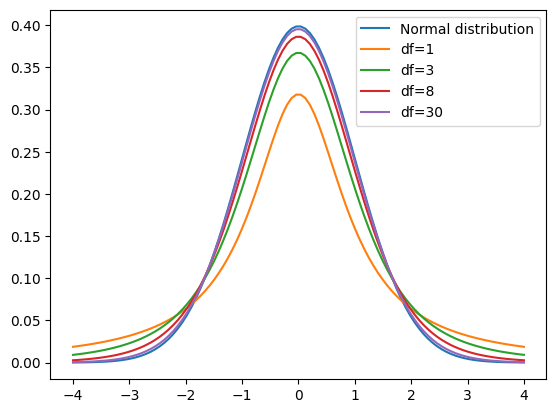

In [6]:
x = np.linspace(-4, +4, num=100)
fig, tplot = plt.subplots(1, 1)
tplot.plot(x, stats.norm.pdf(x, 0, 1), label="Normal distribution")
tplot.plot(x, stats.t.pdf(x, 1), label="df=1") 
tplot.plot(x, stats.t.pdf(x, 3), label="df=3")
tplot.plot(x, stats.t.pdf(x, 8), label="df=8")
tplot.plot(x, stats.t.pdf(x, 30), label="df=30")
tplot.legend(loc='best');

### Student $t$-distribution in Python

`import scipy.stats`

For a $t$-distribution with df degrees of freedom: (df = degrees of freedom)  

| **Function**    | **Purpose** |
| :---                     | :--- |
| `stats.t.pdf(x, df=d)`   | Probability density for $x$    |
| `stats.t.cdf(x, df=d)`   | Left-tail probability 𝑃(𝑋 < x) |
| `stats.t.sf(x, df=d)`    | Right-tail probability 𝑃(𝑋 > x)    |
| `stats.t.isf(1-p, df=d)` | p% of observations are expected to be lower than this value    | 


### Calculation of a confidence Interval for a small sample

To determine the confidence interval for the mean $\mu$ of a population, based on a small sample, we first calculate $t_{\frac{\alpha}{2},{df}}$.  

With a confidence level of 95% we have $\frac{\alpha}{2} = 0.025$

Assume for example $n = 5$ (so df=4), then we have  

$t_{\frac{\alpha}{2},{df}} $ = stats.t.isf(1-0.975, df=4) = 2.776  

We can say with a confidence of 95% that:  

$$\mu ∈ [\bar{x} - t_{\frac{\alpha}{2},{df}} . \frac{s}{\sqrt{n}}, \bar{x} + t_{\frac{\alpha}{2},{df}} . \frac{s}{\sqrt{n}} ]$$

### Example

A random sample of 15 cans of mixed beans gave a sample mean of 324.6 grams and we know from historical data that the standard deviation of the population is 2.5. Calculate a 95% confidence interval for the population mean weight.

In [ ]:
import math

# Step 1.
m = 324.6      # Sample mean
s = 2.5      # Population standard deviation
n = 15      # Sample size
alpha = .05  # 1 - alpha is the confidence level

# Step 2.
t = stats.t.isf(alpha/2, df = n - 1)
print("t-score: %.5f" % t)

# Step 3.
lo = m - t * s / np.sqrt(n)
hi = m + t * s / np.sqrt(n)
print("Confidence interval: [%.4f, %.4f]" % (lo, hi))


t-score: 2.14479
Confidence interval: [323.2155, 325.9845]


In [ ]:
# Or, with the interval() function:
stats.t.interval(1-alpha, df = n - 1, loc=m, scale=s/np.sqrt(n))

(323.2155461460884, 325.98445385391165)

This interval is wider than what we obtained with a larger sample. So we are less certain of the position of the population mean.

### Exercise

The weights, in grams, of bags of cocoa beans are known to have a standard deviation of 6 grams. A random sample of bags is weighed with the following results:  [758, 748, 749, 752, 757, 760, 751, 745, 759, 761]  

Calculate a 95% confidence interval for the mean weight of a bag of cocoa beans (Answer: [749.9393, 758.0607]).

In [13]:
#beans = np.array([758, 748, 749, 752, 757, 760, 751, 745, 759, 761])
beans = pd.Series([758, 748, 749, 752, 757, 760, 751, 745, 759, 761]) #->beter om dit te gebruiken
#s = 6, hier wordt er gebruikt gemaakt van de standaard afwijking van de array van 10, niet van alles
s = beans.std()#(ddof=1) # ddof=1 moet erbij als je np.array gebruikt
m = beans.mean()
n = beans.size
alpha = 0.05

t = stats.t.isf(alpha/2, df = n-1)

lo = m - t * s / np.sqrt(n)
hi = m + t * s / np.sqrt(n)
print("Confidence interval: [%.4f, %.4f]" % (lo, hi))
stats.t.interval(1-alpha, df = n - 1, loc=m, scale=s/np.sqrt(n))

Confidence interval: [749.9393, 758.0607]


(np.float64(749.9393036194637), np.float64(758.0606963805363))

**Source**  
Complete Probability & Statistics 1 & 2 for Cambridge International AS & A Level

# Module 3.03 - Statistical Hypothesis testing

In [2]:
# Importing the necessary packages
import numpy as np                                  # "Scientific computing"
import scipy.stats as stats                         # Statistical tests

import random
import math

import pandas as pd                                 # Data Frame
from pandas.api.types import CategoricalDtype

import matplotlib.pyplot as plt                     # Basic visualisation
from statsmodels.graphics.mosaicplot import mosaic  # Mosaic diagram
import seaborn as sns                               # Advanced data visualisation

## Statistical Hypothesis Testing

### Definitions

- **Hypothesis** = Idea that has yet to be proven: statement regarding the numeric value of a population parameter  
- **Hypothesis Test** = verification of a statement about the values of one or multiple population parameters
- **Null Hypothesis $H_0$** Base hypothesis, we start with assuming it is true.
- **Alternative Hypothesis ($H_1$, $H_a$)** Conclusion if the null hypothesis is unlikely to be true; what you would turn to if you felt there was convincing evidence that $H_0$ was not true.  
- **Critical region** or **rejection region** = The region of values rejecting the null hypothesis. It is is the collection of all values of the test statistic for which we can reject the null hypothesis.
- **Acceptance region** = The region of values supporting the null hypothesis.  
- **Critical value g** = Boundary of the critical region  
- **Significance Level** = The probability of rejecting a true null hypothesis $H_0$.

The principle of **hypothesis testing** is to calculate how likely it is to observe the **test statistic** (the statistic calculated from the observations) if you assume that the null hypothesis $H_0$ is true. If the probability of observing the test statistic is very low, i.e. if the test statistic lies in the most extreme part of the probability distribution (called the **critical region**) you conclude that the null hypothesis is unlikely to be true and you reject it in favour of the alternative hypothesis $H_1$.

All other values lie in the **acceptance region** of the test. The probability of this happening when $H_0$ is actually true is called the size of the test. 5% is often used as the common default size.

Take care in the language that you use!

- If you accept $H_0$, never say that this is because the evidence supports it. You can only conclude there is not significant evidence against $H_0$.
- If you reject $H_0$, say that there is evidence that the Null Hypothesis is not true.

All statistical hypothesis tests follow the same testing procedure:

1. Formulate both hypotheses ($H_0$ and $𝐻_1$)
2. Determine the significance level ($\alpha$)
3. Calculate the test statistic form the smaple
4. Determine the critical region or the probability value
5. Draw conclusions

## The z-test

The $z$-test is used to confirm or refute an assumption about the (unknown) *population mean*, based on a sufficiently large sample.

### The right-tailed $z$-test

Jars of jam are filled by a machine. It has been found that the quantity of jam in a jar is normally distributed and has mean 351.2g, with standard deviation 4.1g. It is believed that the settings of the mean amount on the machine might have been altered accidentally. Assume that the standard deviation has not been altered.

To test this a random sample of 40 jars is taken and the mean quantity per jar is calculated. The mean quantity per jar is found to be 352.8g.

Let's first plot the situation:

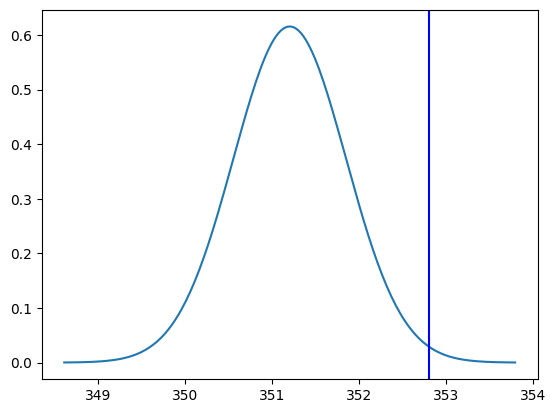

In [ ]:
# Properties of the sample:
n = 40              # Sample size
mu = 351.2          # (Hypothetical) population mean
sigma = 4.1         # Population standard deviation (assumed to be known)
m_sample = 352.8    # Sample mean
s_sample = sigma / math.sqrt(n)

# X-values
dist_x = np.linspace(mu - 4 * s_sample, mu + 4 * s_sample, num=201)
# Y-values for drawing the Gauss curve
dist_y = stats.norm.pdf(dist_x, mu, s_sample)
# Plot the Gauss-curve
plt.plot(dist_x, dist_y)

# Fill the area left of x
# plt.fill_between(dist_x, 0, dist_y, where=(dist_x <= x), color='lightblue')
# Show the mean with an orange line
plt.axvline(m_sample, color="blue");

The testing procedure then runs as follows:

**Step 1.** Formulate the hypotheses:

- $H_0: \mu = 351.2$ (the machine is working correctly)
- $H_1: \mu > 351.2$ (the machine is not working correctly)

**Step 2.** Choose a significance level, e.g. $\alpha = 0.05$

**Step 3.** Determine the value of the test statistic, in this case $\overline{x} = 352.8$

**Step 4.** Determine the $p$-value and reject $H_0$ if $p < \alpha$.


In [ ]:
alpha = 0.05 # Significance level chosen by the researcher
p = stats.norm.sf(m_sample, loc=mu, scale=sigma/np.sqrt(n))

print("p-value: %.5f" % p)
if(p < alpha):
    print("p < alpha: reject H0")
else:
    print("p > alpha: do not reject H0")

p-value: 0.00679
p < alpha: reject H0


An alternative method is to determine the critical region, i.e. the set of all values for the sample mean where $H_0$ may be rejected. The boundary of that area is called the critical value $g$. To the left of it you can't reject $H_0$ (acceptance region), to the right you can (critical region). The area of the acceptance region is $1 - \alpha$, the area of the critical region is $\alpha$.

In [ ]:
# Critical value according to the formula:
#    g = mu + stats.norm.isf(alpha) * sigma / np.sqrt(n)
# Making use of the loc/scale parameters of isf:
g = stats.norm.isf(alpha, loc=mu, scale=sigma / np.sqrt(n))
print("Critical value g ≃ %.3f" % g)
if (m_sample < g):
    print("sample mean = %.3f < g = %.3f: do not reject H0" % (m_sample, g))
else:
    print("sample mean = %.3f > g = %.3f: reject H0" % (m_sample, g))

Critical value g ≃ 352.266
sample mean = 352.800 > g = 352.266: reject H0


A plot of this case:

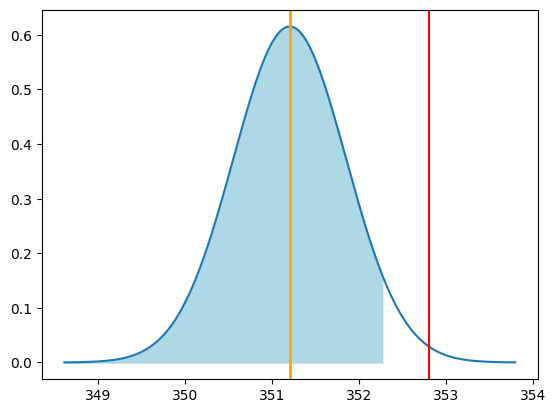

In [ ]:
# Gauss-curve plot:
# X-values
dist_x = np.linspace(mu - 4 * sigma/np.sqrt(n), mu + 4 * sigma/np.sqrt(n), num=201)
# Y-values for the Gauss curve
dist_y = stats.norm.pdf(dist_x, mu, sigma/np.sqrt(n))
fig, dplot = plt.subplots(1, 1)
# Plot the Gauss-curve
dplot.plot(dist_x, dist_y)
# Show the hypothetical population mean with an orange line
dplot.axvline(mu, color="orange", lw=2)
# Show the sample mean with a red line
dplot.axvline(m_sample, color="red")
# Fill the acceptance area in light blue
dplot.fill_between(dist_x, 0, dist_y, where=dist_x <= g, color='lightblue');

## The left-tailed $z$-test

Let's assume the mean quantity per jar is found to be 350.4g. In this case we have reasons to assume that the population mean is *lower* than the value we are testing against ($\mu$ = 351.2g). We can verify this with a *left-tailed* $z$-test.

**Step 1.** Formulate the hypotheses:

- $H_0: \mu = 351.2$ (the machine is working correctly)
- $H_1: \mu < 351.2$ (the machine is not working correctly)

**Step 2.** Choose significance level, e.g. $\alpha = 0.05$

**Step 3.** Calculate the test statistic: $\overline{x} = 350.4$

**Step 4.** Determine the $p$-value and reject $H_0$ if $p < \alpha$.

In [12]:
# Properties of the sample:
n = 40              # Sample size
mu = 351.2          # (Hypothetical) population mean
sigma = 4.1         # Population standard deviation (assumed to be known)
m_sample = 350.4    # Sample mean
alpha = 0.05        # Significance level (chosen by the researcher)

In [15]:
# Pay attention! Use cdf() instead of sf()! Why?
p = stats.norm.cdf(m_sample, loc=mu, scale=sigma/np.sqrt(n))

print("p-value: %.5f" % p)
if(p < alpha):
    print("p < a, reject H0")
else:
    print("p > a, do not reject H0")

p-value: 0.10859
p > a, do not reject H0


In this case, the critical value $g$ is left of the mean. On the right of $g$, you may not reject $H_0$ (acceptance region), on the left, you can (critical region).

In [ ]:
# Critical value according to the formula in the lecture slides
# g = m0 - stats.norm.isf(a) * s / np.sqrt(n)
# Making use of the loc/scale parameters of isf:
g = stats.norm.isf(1-alpha, loc=mu, scale=(sigma / np.sqrt(n)))
print("Critical value g ≃ %.3f" % g)
if (m_sample > g):
    print("sample mean = %.3f > g = %.3f: do not reject H0" % (m_sample, g))
else:
    print("sample mean = %.3f < g = %.3f: reject H0" % (m_sample, g))

Critical value g ≃ 352.266
sample mean = 350.400 < g = 352.266: reject H0


A plot of this case:

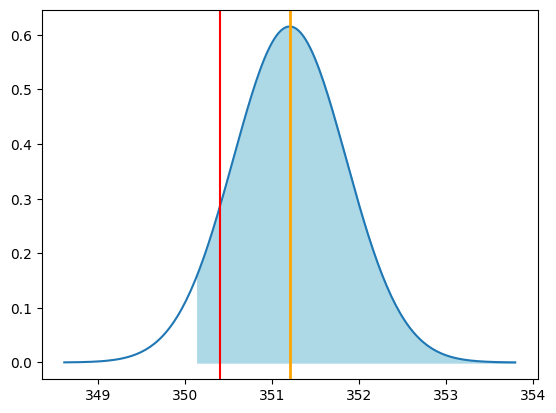

In [ ]:
# Gauss-curve:
# X-values
dist_x = np.linspace(mu - 4 * sigma/np.sqrt(n), mu + 4 * sigma/np.sqrt(n), num=201)
# Y-values
dist_y = stats.norm.pdf(dist_x, mu, sigma/np.sqrt(n))
fig, dplot = plt.subplots(1, 1)
# Plot
dplot.plot(dist_x, dist_y)
# Hypothetical population mean in orange
dplot.axvline(mu, color="orange", lw=2)
# Sample mean in red
dplot.axvline(m_sample, color="red")
# Fill the acceptance region in light blue
dplot.fill_between(dist_x, 0, dist_y, where=dist_x >= g, color='lightblue');

In this case, we see that the sample mean (in red) still falls within the acceptance region, so we cannot reject the null hypothesis. This is also confirmed by the $p$-value, which is greater than $\alpha$. With this result, there is no reason to assume the machine is not working correctly.

## The two-tailed $z$-test

When we don't want to test whether the population mean is either greater or lower than a hypothetical value, but only want to know if the sample mean is "close enough", we can use a two-tailed $z$-test.

**Step 1.** Formulate the hypotheses:

- $H_0: \mu  =  351.2$
- $H_1: \mu \ne 351.2$

**Step 2.** Choose significance level, e.g. $\alpha = 0.05$

**Step 3.** Determine the test statistic. Assume the mean quantity per jar is found to be 351.4g.

$$\overline{x} = 351.4$$

**Step 4.** Calculate the $p$-value and reject $H_0$ if $p < \alpha/2$ (why do we divide by 2?).

In [ ]:
# Properties of the sample:
n = 40              # Sample size
mu = 351.2          # (Hypothetical) population mean
sigma = 4.1         # Population standard deviation (assumed to be known)
m_sample = 351.4    # Sample mean
alpha = 0.05        # Significance level (chosen by the researcher)

In [ ]:
p = stats.norm.sf(m_sample, loc=mu, scale=sigma/np.sqrt(n))
print("p-waarde: %.5f" % p)
if(p < alpha/2):
    print("p < alpha/2, reject H0")
else:
    print("p > alpha/2, do not reject H0")

p-waarde: 0.37885
p > alpha/2, do not reject H0


In this case, we have two critical values: $g_1$ on the left of the mean and $g_2$ on the right. The acceptance region still has area $1-\alpha$ and the critical region has area $\alpha$.

In [ ]:
g1 = mu - stats.norm.isf(alpha/2) * sigma / np.sqrt(n)
g2 = mu + stats.norm.isf(alpha/2) * sigma / np.sqrt(n)

print("Acceptance region [g1, g2] ≃ [%.3f, %.3f]" % (g1,g2))
if (g1 < m_sample and m_sample < g2):
    print("Sample mean = %.3f is inside acceptance region: do not reject H0" % m_sample)
else:
    print("Sample mean = %.3f is outside acceptance region: reject H0" % m_sample)

Acceptance region [g1, g2] ≃ [349.929, 352.471]
Sample mean = 351.400 is inside acceptance region: do not reject H0


A plot of this case:

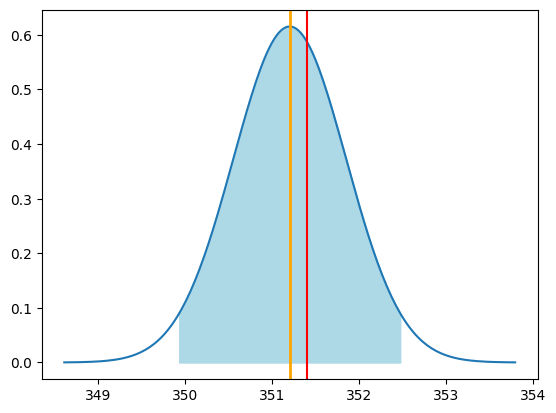

In [ ]:
# Gauss-curve
# X-values
dist_x = np.linspace(mu - 4 * sigma/np.sqrt(n), mu + 4 * sigma/np.sqrt(n), num=201)
# Y-values
dist_y = stats.norm.pdf(dist_x, loc=mu, scale=sigma/np.sqrt(n))
fig, dplot = plt.subplots(1, 1)
# Plot
dplot.plot(dist_x, dist_y)
# Hypothetical population mean in orange
dplot.axvline(mu, color="orange", lw=2)
# Sample mean in red
dplot.axvline(m_sample, color="red")
acc_x = np.linspace(g1, g2, num=101)
acc_y = stats.norm.pdf(acc_x, loc=mu, scale=sigma/np.sqrt(n))
# Fill the acceptance region in light blue
dplot.fill_between(acc_x, 0, acc_y, color='lightblue');

**Step 5** Draw conclusions

The obtained sample mean turns out to be sufficiently probable. We cannot rule out a random sampling error. Or, in other words, we *cannot* reject the null hypothesis here. From the sample, we cannot conclude that the machine is not working correctly.

## Student's $t$-test

The $z$-test can only be used under specific conditions:

- The sample needs to be random  
- The sample size needs to be sufficiently large ($n \geq 30$)
- The test statistic needs to have a normal distribution  
- The standard deviation of the population, $\sigma$, is known

Sometimes these assumptions will not hold and in this case we can not use the $z$-test! If the variable is normally distributed, you can use Student's $t$-test.

The test was named after [William Sealy Gosset](https://en.wikipedia.org/wiki/William_Sealy_Gosset), who published results of his research under the pseudonym "Student". Gosset worked for the Guinness Brewery in Dublin, Ireland, and was interested in the problems of small samples - for example, the chemical properties of barley. He developed the $t$-test to work with small samples. Guinness did not want to reveal its trade secrets, so Gosset had to publish his work under a pseudonym.

### Example

In one course, a new textbook was used this school year. The old textbook received an average score of 5.2 out of 10. To know if the new textbook is more appreciated than the old one, the opinion of the 41 students who are redoing the course this school year is asked. Below are the scores of these 41 students:

```python
scores = [6, 3, 6, 7, 6, 10, 6, 8, 7, 9, 3, 6, 4, 6, 8, 9, 5, 4, 6, 4, 6, 8, 10, 5, 4, 6, 4, 6, 6, 4, 5, 7, 8, 7, 5, 4, 8, 4, 5, 10, 7]
```

Can we say that the score of the new textbook is significantly higher?

This is a *right-tailed* test, because we are testing whether the score of the new textbook is higher than the score of the old textbook. The testing procedure then runs as follows:

**Step 1.** Formulate the hypotheses:

- $H_0: \mu = 5.2$ (the score isn't higher)
- $H_1: \mu > 5.2$ (the score is higher)

**Step 2.** Choose significance level, e.g. $\alpha = 0.05$

**Step 3.** Calculate the test statistic $\overline{x}$

In [3]:
scores = [6, 3, 6, 7, 6, 10, 6, 8, 7, 9, 3, 6, 4, 6, 8, 9, 5, 4, 6, 4, 6, 8, 10, 5, 4, 6, 4, 6, 6, 4, 5, 7, 8, 7, 5, 4, 8, 4, 5, 10, 7]
n = len(scores)
mu = 5.2
s = np.std(scores, ddof = 1)  # the standard deviation of the population is unknown
m_sample = np.mean(scores)
alpha = 0.05

print(f"Sample mean: {m_sample}")

Sample mean: 6.146341463414634


**Step 4.** Determine the $p$-value and do not reject $H_0$ if $p > \alpha$.

In [4]:
p = stats.t.sf(m_sample, loc = mu, scale = s / math.sqrt(n), df = n - 1)
print(f"p-value: {p}")
if(p < alpha):
    print("p < alpha: reject H0")
else:
    print("p > alpha: do not reject H0")

p-value: 0.001416386450584406
p < alpha: reject H0


Or calculate the critical value $g$ and do not reject $H_0$ if $\overline{x} > g$.

In [5]:
g = stats.t.isf(alpha, loc = mu, scale = s / math.sqrt(n), df = n - 1)
print("Critical value g ≃ %.3f" % g)
if (m_sample < g):
    print("sample mean = %.3f < g = %.3f: do not reject H0" % (m_sample, g))
else:
    print("sample mean = %.3f > g = %.3f: reject H0" % (m_sample, g))


Critical value g ≃ 5.701
sample mean = 6.146 > g = 5.701: reject H0


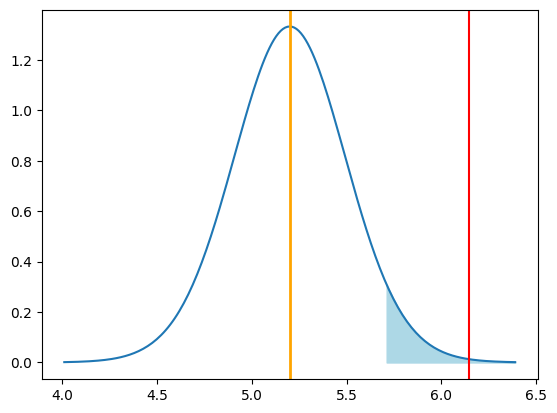

In [6]:
# Gauss-curve
# X-values
dist_x = np.linspace(mu - 4 * s/np.sqrt(n), mu + 4 * s/np.sqrt(n), num=201)
# Y-values
dist_y = stats.t.pdf(dist_x, loc=mu, scale=s/np.sqrt(n), df=n-1)
fig, dplot = plt.subplots(1, 1)
# Plot
dplot.plot(dist_x, dist_y)
# Hypothetical population mean in orange
dplot.axvline(mu, color="orange", lw=2)
# Sample mean in red
dplot.axvline(m_sample, color="red")
# Fill the acceptance region in light blue
dplot.fill_between(dist_x, 0, dist_y, where=dist_x >= g, color='lightblue');

**Step 5** Draw conclusions.

There is sufficient evidence to reject $H_0$. Thus, there is sufficient evidence to conclude that the new textbook is more appreciated by the students.

### Use of the function `ttest_1samp`


SciPy provides a function `ttest_1samp()` that allows you to perform a *two-tailed* t-test on a collection of observations. It is used to compare the mean of a single sample to a known population mean. It helps determine whether the sample mean is significantly different from the population mean.

When to use ttest_1samp?
- You have one sample of data.
- You want to test if its mean significantly differs from a known or hypothesized population mean.
- The data is assumed to be normally distributed (or approximately normal for large samples).
- The standard deviation of the population is not known

**Example**

A university claims that students spend an average of 20 hours per week studying. A researcher collects data from 15 students to test whether their average study time is different from 20 hours.

**Step 1.** Formulate the hypotheses:

- $H_0: \mu = 20$ (The average study time is 20 hours.)
- $H_1: \mu \ne 20$ (The average study time is not 20 hours.)

**Step 2.** Choose significance level, e.g. $\alpha = 0.05$

**Step 3.** Calculate the test statistic $\overline{x} = 19.93 $

**Step 4.** Determine the $p$-value and do not reject $H_0$ if $p > \alpha$.

In [9]:
study_times = [18,22,19,21,23,20,17,22,19,18,21,20,16,24,19]
alpha = 0.05
mu = 20

t_stat, p_val = stats.ttest_1samp(a=study_times, popmean=mu, alternative='two-sided')
print("Sample mean        : %.3f" % np.mean(study_times))
print("t-score            : %.3f" % t_stat)
print(f"p-value           : {p_val}")

Sample mean        : 19.933
t-score            : -0.115
p-value           : 0.9103055898392006


**Step 5** Draw conclusions.

There is insufficient evidence to reject $H_0$. Thus, there is to reason to believe that the average study time is significantly different from 20.

**Remarks**

There is no similar function as `ttest_1samp()` for the $z$-test. In practice, the $z$-test is rarely used because the conditions for its use are rarely met. In particular, the assumption that the population variance is known is not realistic. The $t$-test is more versatile and can be used in a wider range of situations.

As a conclusion:

**When to use the $z$-test?**
- in case of a large sample (no matter which distribution) or a small sample if the underlying distribution is the normal distribution

ánd

- if the variance or standarddeviation of the population is known


**When to use the $t$-test?**
- if the underlying distribution is the normal distribution

ánd

- if the variance or standarddeviation of the population is unknown

## Errors in Hypothesis Tests

**Type I error** (false positive)  
The null hypothesis is actually true and you reject it.  
Example: A COVID test wrongly indicates a person is infected when they are actually healthy.

**Type II error** (false negative)    
You accept the null hypothesis and it was not true.  
Example: A COVID test wrongly indicates a person is healthy when they are actually infected.


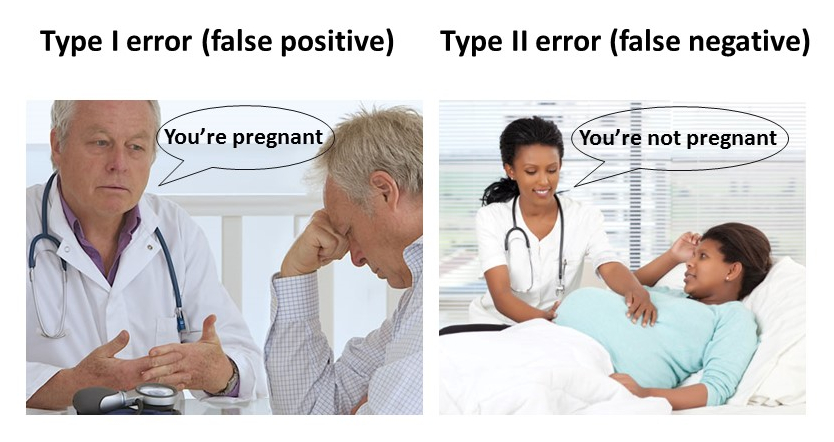


P(type I error) = 𝛼 (= significance level)  
P(type II error) = 𝛽  
Calculating 𝛽 is not trivial, but if 𝛼 ↘ then 𝛽 ↗

# Module 4: Bivariate analysis - 2 qualitative variables

To demonstrate the concepts in this module, we import dataset `rlanders.csv`. It contains synthetic data that was generated randomly (see [the description](../data/rlanders.md)).

In [1]:
# Importing the necessary packages
import numpy as np                                  # "Scientific computing"
import scipy.stats as stats                         # Statistical tests

import pandas as pd                                 # Data Frame
from pandas.api.types import CategoricalDtype

import matplotlib.pyplot as plt                     # Basic visualisation
from statsmodels.graphics.mosaicplot import mosaic  # Mosaic diagram
import seaborn as sns                               # Advanced data visualisation

In [3]:
# Read dataset + data preparation
rlanders = pd.read_csv('https://raw.githubusercontent.com/HoGentTIN/dsai-en-labs/main/data/rlanders.csv').set_index(['ID'])
rlanders.Gender = rlanders.Gender.astype('category')
likert_scale = CategoricalDtype(categories=[1,2,3,4,5], ordered=True)
rlanders.Survey = rlanders.Survey.astype(likert_scale)
rlanders.info()
rlanders.Survey.dtype

<class 'pandas.core.frame.DataFrame'>
Index: 250 entries, 1 to 250
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   Gender  250 non-null    category
 1   Money   250 non-null    int64   
 2   Days    250 non-null    int64   
 3   Months  250 non-null    int64   
 4   Count   250 non-null    int64   
 5   Survey  250 non-null    category
dtypes: category(2), int64(4)
memory usage: 10.6 KB


CategoricalDtype(categories=[1, 2, 3, 4, 5], ordered=True, categories_dtype=int64)

## Contingency tables and visualisation techniques

Let's say we want to know whether women and men (variable `Gender`) within the sample have responded differently on a survey question with a Likert scale (variable `Survey`). 

If the proportions of the answers (1 to 5) for women and men are about the same, we say that there is no association between the two variables. If there is a significant difference, then there is an association. Now, of course, the question is when is the difference large enough to be considered *significant*...

A first step is to calculate a contingency table. We immediately add the marginal totals:

In [7]:
pd.crosstab(rlanders.Survey, rlanders.Gender, margins=True)

Gender,Female,Male,All
Survey,,,
1,0,4,4
2,17,45,62
3,23,91,114
4,12,53,65
5,0,5,5
All,52,198,250


### Clustered bar chart

Of course, such a table does not say much. Perhaps we should visualise the data.

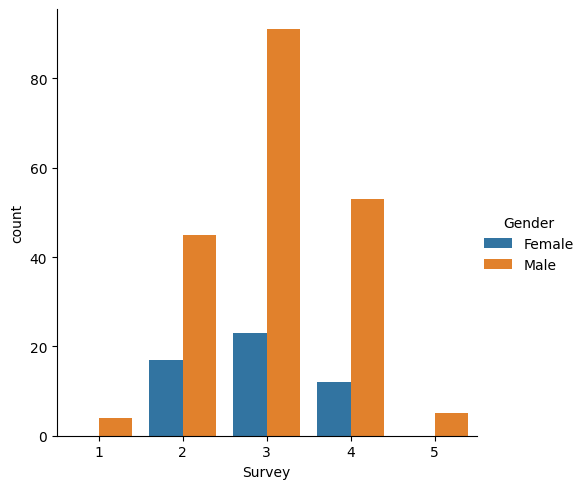

In [8]:
sns.catplot(data=rlanders, x='Survey', hue='Gender', kind='count');

If the "shape" of the bars for both categories is similar, we can conclude that both categories have a similar distribution, or that there is no association between the two variables. If the shape were different (e.g. highest peak for men at 2 and for women at 4), that would indicate that there actually is an association, or that men and women give significantly different answers to the survey question.

In this case, what is striking is that the women did not give the extreme answers (1 or 5). However, there are considerably fewer women in the sample, so that may be just a coincidence, not necessarily a significant pattern.

### Stacked bar chart

Another way to visualize the data is by stacking the bars instead of clustering them. Unfortunately, Seaborn doesn't provide us with a convenient method to do so. However, a crosstab object (actually a Pandas DataFrame) has a plot method that we can use. Remark that we swapped the variables when calling the crosstab function.

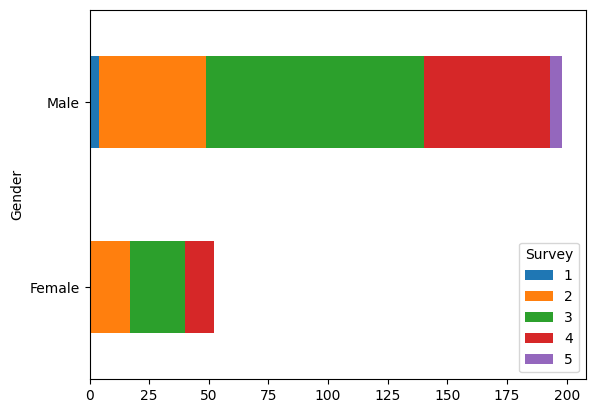

In [9]:
# Contingency table without the margins
observed = pd.crosstab(rlanders.Gender, rlanders.Survey)

# Horizontally oriented stacked bar chart
observed.plot(kind='barh', stacked=True);

We want to compare the proportions within each category (Male, Female) that replied to the survey question. In data sets with large differences in the number of observations for each category, this representation is still difficult to interpret. By looking at the *relative* frequencies (i.e. percentages), we may get a better result:

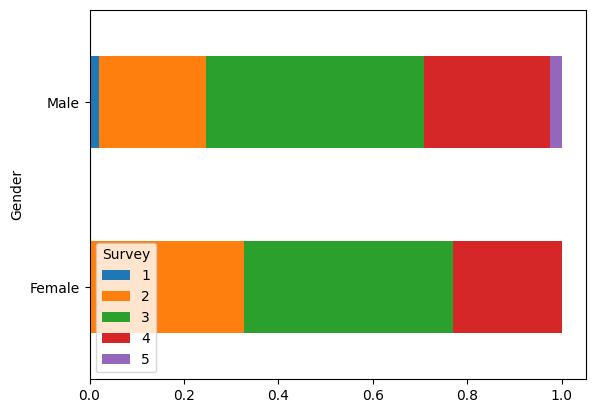

In [10]:
# Contingency table without the margins
observed_p = pd.crosstab(rlanders.Gender, rlanders.Survey, normalize='index')

# Horizontally oriented stacked bar chart
observed_p.plot(kind='barh', stacked=True);

We can see that there are some differences between the proportions, e.g. the percentage of women answering "2" (orange) seems larger than the men. Whether this is a significant difference remains to be seen (see below for further analysis of this case).

In this representation we lose the information about the number of men and women in the sample. Specifically, we don't see that there are much less women. A mosaic diagram solves this problem.

### Mosaic diagram
A mosaic diagram is a graphical representation of the crosstab where each cell is represented by a tile whose area is proportional to the frequency of that cell with respect to the total number of observations.

You can compare this a bit with how [WinDirStat](https://windirstat.net/) visualises the size of files on your hard disk.

For this case:

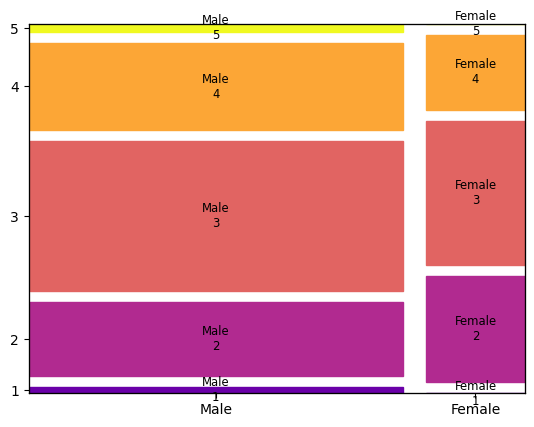

In [4]:
import matplotlib as mpl

# By default, mosaic() will color all columns the same. Here,
# we're going to give a separate color to each response (1-5).
# The response is kept in the label of each cell, a tuple of
# the two values that are represented in that cell (e.g. 
# ('Female', '2')). We will be using the "plasma" color map
# in this example.
plasma_colors = mpl.colormaps['plasma']
# Create a function that maps the cell key to the color we
# want to give it. We use the colormap function created above
# and give it a number between 0 and 1. We convert the second
# part of the key (values '1' to '5') to a number and divide
# by 5.
props = lambda key: {'color': plasma_colors(int(key[1])/5)}

mos_gender_survey = mosaic(
       data=rlanders.sort_values(by=['Survey']),
       index=['Gender', 'Survey'],
       gap=0.05, properties=props);

We can clearly see here that there are more men in the sample (wider tiles).

You can also compare the distributions of the answers given to the survey question. Except for the fact that the women did not give extreme answers (1 and 5), at first sight, the distributions still seem to match quite well.

## Chi-squared and Cramér's V

Chi-squared ($\chi^2$) and Cramér's V are statistics that can help us to determine whether there is an association between two qualitative (categorical) variables.

The reasoning goes as follows: if there is no association between `Gender` and `Survey`, then we expect the proportions of the values of `Survey` to be the same for all values of `Gender`. In other words, for both women and men, the same percentage of respondents will give the same answer to the question.

In [7]:
observed = pd.crosstab(rlanders.Survey, rlanders.Gender)
row_sums = observed.sum(axis=1)
col_sums = observed.sum()
n = row_sums.sum()

print(f"row:", row_sums)
print(f"col:", col_sums)
print(f'Number of observations: {n}')

row: Survey
1      4
2     62
3    114
4     65
5      5
dtype: int64
col: Gender
Female     52
Male      198
dtype: int64
Number of observations: 250


Now we can calculate how often we can expect each combination of `Gender` and `Survey` to occur in the sample. For example, 114 out of 250 respondents answered "3", i.e. 114/250 = 0.456 (or 46.6%). Then we know that both 46.6% of the women and 46.6% of the men must have answered "3". Since there were 52 female respondents, we expect that 52 x 0.456 = 23.712 have answered "3". In reality, there were 23. For the men, we expect 198 x 0.456 = 90.288 (compared to 91 in reality).

We can generalise this principle to any cell in the table: $\frac{row total \times column total}{n}$ (with $n$ the total number of observations).

The expected values can be calculated using the `outer()` function:

In [12]:
expected = np.outer(row_sums, col_sums) / n
expected

array([[ 0.832,  3.168],
       [12.896, 49.104],
       [23.712, 90.288],
       [13.52 , 51.48 ],
       [ 1.04 ,  3.96 ]])

Let's check if the marginal totals are still correct:

In [28]:
exp_row_sums = np.sum(expected, axis=1)
exp_col_sums = np.sum(expected, axis=0)

print(f'Row totals   : {exp_row_sums}')
print(f'Column totals: {exp_col_sums}')
print(f'Observations : {exp_col_sums.sum()}')

Row totals   : [  4.  62. 114.  65.   5.]
Column totals: [ 52. 198.]
Observations : 250.0


Indeed, they do. Now, what's the difference between the expected and observed values?

In [13]:
expected - observed

Gender,Female,Male
Survey,,
1,0.832,-0.832
2,-4.104,4.104
3,0.712,-0.712
4,1.520,-1.520
5,1.040,-1.040


Some observed values seem to be close to the expected ones (e.g. for "3"), others are further away (e.g. "2"). However, we must also see the differences in proportion.

A measure for determining the total deviation in a frequency table is to square the differences between expected and observed values (just as one does with variance/standard deviation) and divide by the expected value:

In [14]:
diffs = (expected - observed)**2 / expected
print(diffs)

Gender    Female      Male
Survey                    
1       0.832000  0.218505
2       1.306050  0.343003
3       0.021379  0.005615
4       0.170888  0.044880
5       1.040000  0.273131


The sum of all these values is called $\chi^2$ ("chi-squared"):

$\chi^2 = \sum_i \frac{(o_i - e_i)^2}{e_i}$

with $o_i$ the number of observations in the $i$'th cell of the contingencytable and $e_i$ the expected frequency. Compare the formula with the code above to find similarities!

In [15]:
chi_squared = diffs.values.sum()
print('χ² ≈ %.3f' %chi_squared)

χ² ≈ 4.255


Now, this value in itself still does not say very much. Under what conditions do we say that there is or isn't an association between the two variables? That will also depend on the size of the table and the total number of observations. In a contingency table with more rows/columns, you will need a larger $\chi^2$ before you can conclude that there is an association.

[Cramér's V](https://en.wikipedia.org/wiki/Cram%C3%A9r%27s_V) is a formula that normalises $\chi^2$ to a value between 0 and 1 that is independent of the table size.

$V = \sqrt{\frac{\chi^2}{n(k-1)}}$

In [16]:
dof = min(observed.shape) - 1
cramers_v = np.sqrt(chi_squared / (dof * n))
print(cramers_v)

0.13046762087242633


The value of Cramér's $V$ can also be calculated with the following Python function (from the `scipy.stats` module):

In [17]:
stats.contingency.association(observed, method='cramer')

0.13046762087242636

To draw a conclusion from this figure, compare it with the values in the table below:

| Cramér's V | Interpretation          |
| :---:      | :---                    |
| 0          | No association          |
| 0.1        | Weak association        |
| 0.25       | Moderate association    |
| 0.50       | Strong association      |
| 0.75       | Very strong association |
| 1          | Complete association    |

So our result for Cramér's V indicates a fairly weak association. Note that Cramér's V is known to be too optimistic about the association between two variables in certain cases. There is a modified formula for eliminating this bias, but it is beyond the scope of this course.

There is, however, another way to determine whether the chi-square is large enough to conclude that there is a relationship, namely by means of a statistical test.

## The chi-squared test for independence

To answer the question of when the value of chi-square is sufficient to assume an association between two variables, we can use the *chi-square independence test*.

### The chi-squared distribution

The value of $\chi^2$ follows a specific stochastic distribution that is called the $\chi^2$-distribution. Just like with the Student-t distribution, the shape of the probability density function depends on the degrees of freedom, which in this context is $df = (r-1)\times(k-1)$ (with $r$ the number of rows in the contingency table and $k$ the number of columns).

The code below plots the probability density function of the $\chi^2$-distribution for a number of degrees of freedom:

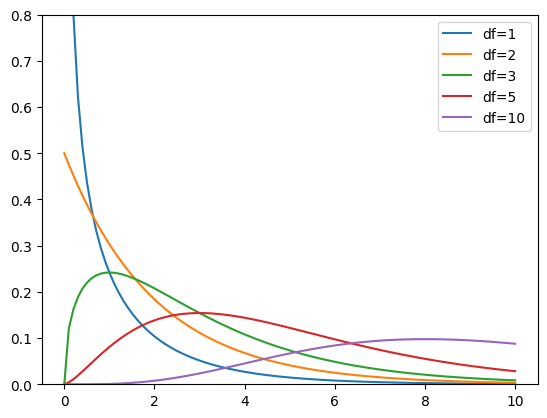

In [18]:
# Plot of the chi-squared distribution for different degrees of freedom
x = np.linspace(0, 10, num=100)
fig, tplot = plt.subplots(1, 1);
tplot.set_ylim([0, 0.8]);
tplot.plot(x, stats.chi2.pdf(x, 1), label="df=1");
tplot.plot(x, stats.chi2.pdf(x, 2), label="df=2");
tplot.plot(x, stats.chi2.pdf(x, 3), label="df=3");
tplot.plot(x, stats.chi2.pdf(x, 5), label="df=5");
tplot.plot(x, stats.chi2.pdf(x, 10), label="df=10");
tplot.legend(loc='best');

Using this figure, you can follow a reasoning similar to a right-sided z-test. You can calculate a critical value $g$ for which the area under the curve to the right of $g$ is equal to our chosen significance level $\alpha$. If the test statistic $\chi^2$ is greater than $g$, we say that the deviations from the expected values in the contingency table are too large to be coincidental and that we have reason to believe that there is an association between the two variables.

You can also calculate the excess probability $p$, i.e. the probability that the deviations you see in the sample could be due to random sampling errors. To do this, you calculate the area under the density curve to the right of $p$. If this area is smaller than $\alpha$, we also say that the deviations are too large to be caused by random sampling errors and that there is therefore an association between the variables.

In Python, we use the following Scipy functions for this purpose:

- `stats.chi2.sf(x)` - the right tail probability of `x` (or survival function)
- `stats.chi2.isf(q)` - the inverse function of `sf(x)`, i.e. calculate a number `x` for which the right tail probability is exactly `q`.

A plot for the case where $\alpha = 0.05$ (an often chosen value for the significance level) and 4 degrees of freedom:

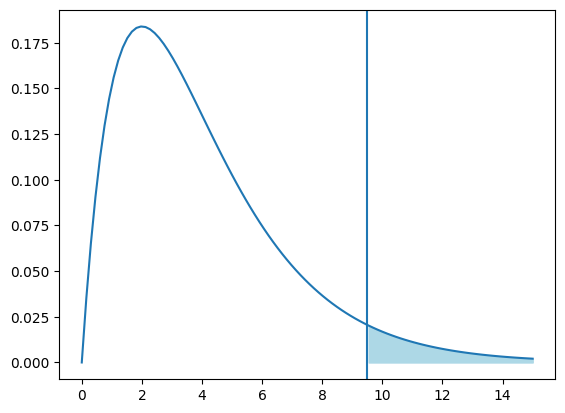

In [19]:
# Right tail probability in the chi-squared distribution

# x-values:
x = np.linspace(0, 15, num=100)
# probability density of the chi-squared distribution with 4 degrees of freedom
y = stats.chi2.pdf(x, df=4)
# the number q for which the right tail probability is exactly 5%:
q = stats.chi2.isf(.05, df=4)

fig, tplot = plt.subplots(1, 1)
tplot.plot(x, y)                      # probability density
tplot.fill_between(x, y, where=x>=q,  # critical area
    color='lightblue')
tplot.axvline(q);                     # critical value

### Test procedure

Formally, the procedure of the $\chi^2$ test for independence runs as follows:

1. Formulate the hypotheses:
   - $H_0$: There is no association between the variables (the differences between observed and expected values are small)
   - $H_1$: There is an association between the variables (the differences are large)
2. Choose significance level $\alpha$
3. Calculate the value of the test statistic in the sample (here: $\chi^2$).
4. Use one of the following methods (based on the degrees of freedom $df = (r-1) \times (k-1)$):
   1. Determine critical value $g$ so $P(\chi^2 > g) = \alpha$
   2. Calculate the $p$-value
5. Draw a conclusion based on the outcome:
   1. $\chi^2 < g$: do not reject $H_0$; $\chi^2 > g$: reject $H_0$
   2. $p > \alpha$: do not reject $H_0$; $p < \alpha$: reject $H_0$

In Python, we can calculate this as follows:

In [20]:
alpha = .05
dimensions = observed.shape
dof = (dimensions[0]-1) * (dimensions[1]-1)

print("Chi-squared        : %.4f" % chi_squared)
print("Degrees of freedom : %d" % dof)

# Calculate critical value
g = stats.chi2.isf(alpha, df = dof)
print("Critical value     : %.4f" % g)

# Calculate p-value
p = stats.chi2.sf(chi_squared, df=dof)
print("p-value            : %.4f" % p)

Chi-squared        : 4.2555
Degrees of freedom : 4
Critical value     : 9.4877
p-value            : 0.3725


Actually, we do not need to memorise these formulas to determine chi-square, the critical value and the p-value. SciPy already has a function that allows us to calculate the chi-square and p-value directly from a contingency table:

In [21]:
# Chi-squared test for independence based on a contingency table
observed = pd.crosstab(rlanders.Survey, rlanders.Gender)
chi2, p, df, expected = stats.chi2_contingency(observed)

print("Chi-squared       : %.4f" % chi2)
print("Degrees of freedom: %d" % df)
print("P-value           : %.4f" % p)

Chi-squared       : 4.2555
Degrees of freedom: 4
P-value           : 0.3725


As you can see, the outcome for the $p$-value is the same as in our worked out calculations!

A graphical representation of our case:

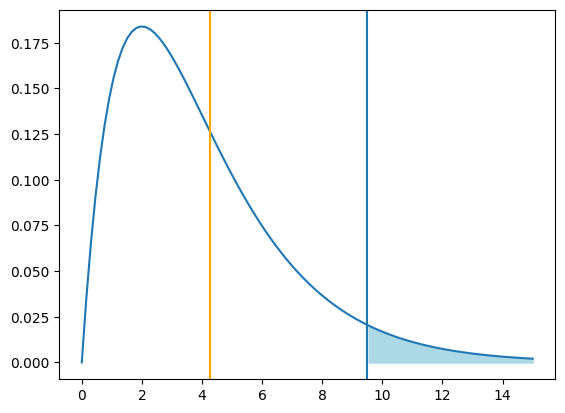

In [22]:
# Is there an association between Gender and Survey?

# x-values:
x = np.linspace(0, 15, num=100)
# probability density of the chi-squared distribution with 4 degrees of freedom
y = stats.chi2.pdf(x, df=dof)
# the number q for which the right tail probability is exactly 5%:
q = stats.chi2.isf(alpha, df=4)  # TODO: CHECK this!

fig, tplot = plt.subplots(1, 1)
tplot.plot(x, y)                     # probability density
tplot.fill_between(x, y, where=x>=q, # critical area
    color='lightblue')
tplot.axvline(q)                     # critical value
tplot.axvline(chi2, color='orange')  # chi-squared

We see that $\chi^2$ is well within the region of acceptance. The $p$-value is also greater than $\alpha$. Consequently, we cannot reject the null hypothesis and conclude that, based on this sample, there is no reason to believe that there is a significant difference between women's and men's answers to the survey question.

## Goodness-of-fit test

Suppose that in a sample of superheroes we keep track of what type they are and that we also know how often each type occurs in the entire population (as a percentage). Given below are the absolute frequencies in the sample $o_i$ and the expected relative frequencies $\pi_i$ in the population:

In [23]:
types =               ['mutant', 'human', 'alien', 'god', 'demon']
observed =   np.array([   127,      75,      98,     27,     73])
expected_p = np.array([   .35,     .17,     .23,    .08,    .17])

The question now is: is this sample representative of the population? Does each type occur in the sample in proportion to the expected percentage in the population as a whole?

### Test procedure

To answer these kinds of questions, a goodness-of-fit test is suitable. The procedure is as follows:

1. Formulate the hypotheses:
   - $H_0$: The sample is representative of the population, i.e. the frequency of each class within the sample corresponds well to that in the population.
   - $H_1$: The sample is *not* representative of the population, i.e. the differences with the expected frequencies are too large.
2. Choose significance level $\alpha$
3. Calculate the value of the test statistic in the sample (here: $\chi^2$).
4. Use one of the following methods (based on the degrees of freedom $df = (k-1)$ with $k$ the number of categories in the sample):
   1. Determine critical value $g$ so $P(\chi^2 > g) = \alpha$
   2. Calculate the $p$-value
5. Draw a conclusion based on the outcome:
   1. $\chi^2 < g$: do not reject $H_0$; $\chi^2 > g$: reject $H_0$
   2. $p > \alpha$: do not reject $H_0$; $p < \alpha$: reject $H_0$

A plot of this case, including the calculation of $p$ and $g$:

In [24]:
alpha = 0.05               # Significance level
n = sum(observed)          # Sample size
k = len(observed)          # Number of categories
dof = k - 1                # Degrees of freedom
expected = expected_p * n  # Expected absolute frequencies in the sample
g = stats.chi2.isf(alpha, df=dof)  # Critical value

# Goodness-of-fit-test in Python:
chi2, p = stats.chisquare(f_obs=observed, f_exp=expected)

print("Significance level  ⍺ = %.2f" % alpha)
print("Sample size         n = %d" % n)
print("k = %d; df = %d" % (k, dof))
print("Chi-squared        χ² = %.4f" % chi2)
print("Critical value      g = %.4f" % g)
print("p-value             p = %.4f" % p)

Significance level  ⍺ = 0.05
Sample size         n = 400
k = 5; df = 4
Chi-squared        χ² = 3.4679
Critical value      g = 9.4877
p-value             p = 0.4828


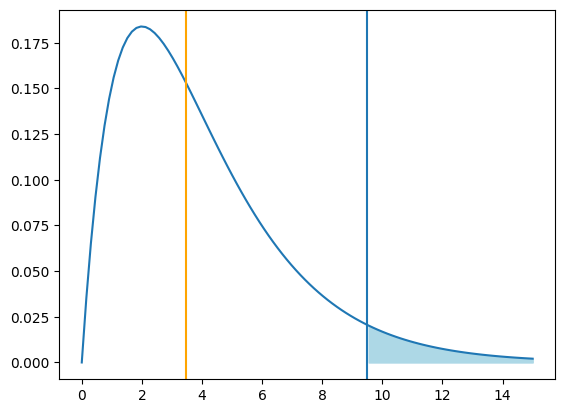

In [41]:
# Plot of the case:
# x-values:
x = np.linspace(0, 15, num=100)
# probability density of the chi-squared distribution with 4 degrees of freedom
y = stats.chi2.pdf(x, df=dof)
# the number q for which the right tail probability is exactly 5%:
q = stats.chi2.isf(alpha, df=dof)

fig, tplot = plt.subplots(1, 1)
tplot.plot(x, y)                     # probability density
tplot.fill_between(x, y, where=x>=q, # critical area
    color='lightblue')
tplot.axvline(q)                     # critical value
tplot.axvline(chi2, color='orange'); # chi-squared

We can see that $\chi^2$ in the sample is left of the critical value, so within the area of acceptance. Therefore, we cannot reject the null hypothesis and conclude that the sample is representative for the population, at least w.r.t. the types of superheroes.

## Standardised residuals

After performing a chi-squared test, it is often also interesting to know in which categories the largest deviations occur. You could look at the value $\frac{(o-e)^2}{e}$ for each cell in the contingency table (or vector), which is used in the calculation of $\chi^2$. However, from this you cannot tell to what extent the deviations can really be considered "extreme". For this we use so-called *standardised residuals*.

We introduce this concept by means of an example:

Suppose that a certain study looks at families with 5 children. A sample of 1022 families is taken, and they are divided into categories according to the number of boys in the family. The frequencies are given below in a Pandas DataFrame that we will create manually and systematically extend.

In [25]:
# Data frame with 2 columns:
#  - number of boys in the family (index)
#  - number of families in the sample with that number of boys
families = pd.DataFrame(
    np.array(
        [[0,  58],
         [1, 149],
         [2, 305],
         [3, 303],
         [4, 162],
         [5,  45]]),
    columns=['num_boys', "observed"])
families.set_index(['num_boys'])
n = families.observed.sum() # sample size

Now what is the expected number of families with the given number of boys? Let's assume that the probability of conceiving boys or girls is equally large, i.e. 0.5. In that case, we can calculate the expected relative frequencies with this formula:

$\pi_i = (0.5)^i (1-0.5)^{5-i} \binom{5}{i}$

Why that is the case is not relevant for the subject at hand and is beyond the scope of this course.

The expected absolute frequencies in the sample can then be calculated as $e_i = n \pi_i$.

We apply this to our case:

In [43]:
from scipy.special import binom # binomial-function

# probability for a boy
prob_boy = .5
# Add new colum to the data frame for the expected percentages
families['expected_p'] = binom(5, families.num_boys) * prob_boy**families.num_boys * prob_boy**(5-families.num_boys)
# Expected absolute frequencies in the sample:
families['expected'] = families['expected_p'] * n
families

,num_boys,observed,expected_p,expected
0,0,58,0.03125,31.9375
1,1,149,0.15625,159.6875
2,2,305,0.31250,319.3750
3,3,303,0.31250,319.3750
4,4,162,0.15625,159.6875
5,5,45,0.03125,31.9375


We perform the chi-squared goodness-of-fit test with significance level $\alpha = 0.01$.

In [44]:
alpha=0.01                         # significance level
dof=len(families)-1                # degrees of freedom
g = stats.chi2.isf(alpha, df=dof)  # Critical value
# Perform Chi-squared test, calculate χ² and p
chi2, p = stats.chisquare(f_obs=families.observed, f_exp=families.expected)

print("Chi-squared   χ² = %.4f" % chi2)
print("Critical value g = %.4f" % g)
print("p-value        p = %f"   % p)

Chi-squared   χ² = 28.8462
Critical value g = 15.0863
p-value        p = 0.000025


This is a very small p-value. The chi-squared is also to the right of the critical value. This means that we can reject the null hypothesis. A plot:

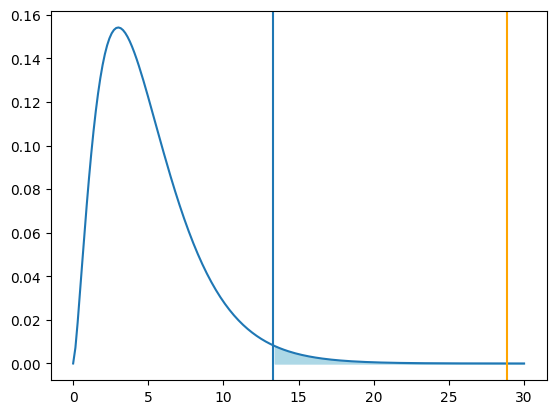

In [46]:
# x-values:
x = np.linspace(0, 30, num=200)
# probability density of the chi-squared distribution
y = stats.chi2.pdf(x, df=dof)
# the number q for which the right tail probability is exactly 1%:
q = stats.chi2.isf(alpha, df=4)  # TODO: CHECK this!

fig, tplot = plt.subplots(1, 1)
tplot.plot(x, y)                     # probability density
tplot.fill_between(x, y, where=x>=q, # critical area
    color='lightblue')
tplot.axvline(q)                     # critical value
tplot.axvline(chi2, color='orange'); # chi-squared

We conclude that this sample is NOT representative for the population!

The formula for calculating standardised residuals is:

$r_i = \frac{o_i-e_i}{\sqrt{e_i (1-\pi_i)}}$

We will add these to our data frame in a new column:

In [47]:
families['stdres'] = (families.observed - families.expected) / np.sqrt(families.expected * (1 - families.expected_p))
families

,num_boys,observed,expected_p,expected,stdres
0,0,58,0.03125,31.9375,4.685541
1,1,149,0.15625,159.6875,-0.920733
2,2,305,0.31250,319.3750,-0.970110
3,3,303,0.31250,319.3750,-1.105082
4,4,162,0.15625,159.6875,0.199223
5,5,45,0.03125,31.9375,2.348389


Standardised residuals are a measure of the extent to which a certain category is over- or under-represented in the sample. A value of 0 is given when the observed frequency is equal to the expected frequency. A negative value is given when there are fewer observations than expected and a positive value when there are more. As long as $r_i \in [-2, 2]$, we consider the differences to be random sampling errors. A value $r_i < -2$ indicates underrepresentation of this category, $r_i > 2$ indicates overrepresentation.

Thus, families with only girls and only boys are over-represented in the sample. In practice, researchers could choose to randomly remove a number of observations in these categories from the study, so that the sample becomes representative of the population.

Remark that there is a way to calculate standardized residuals using [`statsmodels.stats.contingency_tables.Table`](https://www.statsmodels.org/stable/generated/statsmodels.stats.contingency_tables.Table.html#statsmodels.stats.contingency_tables.Table). However, that only works with [contingency tables for two variables](https://www.statsmodels.org/stable/contingency_tables.html?highlight=residuals), not for this case with one variable.

## Cochran's rule

A chi-squared test can only give good results if you have enough observations in each category. The statistician Cochran (1954) formulated a rule of thumb to determine what exactly *enough* is on contingency tables larger than 2x2:

- All expected values must be at least 1
- At most 20% of the expected values may be smaller than 5

# Module 5 - Bivariate analysis: qualitative vs quantitative

In this module, we discuss the case where the independent variable is qualitative and the dependent is quantitative. Some typical examples of research question in this case:

- Within a certain species of animals, are male individuals significantly larger than females?
- Does a new vaccine protect against the disease like it's supposed to?
- Does a certain study method like "retrieval practice" actually improve learning outcomes (i.e. student's grades)?

In this course, we only treat the case where we compare two groups. There are methods to compare more than two groups (e.g. the ANOVA test), but those are beyond the scope of this course.

In [1]:
# Package imports
import numpy as np                                  # "Scientific computing"
import scipy.stats as stats                         # Statistical tests

import pandas as pd                                 # Dataframe
import matplotlib.pyplot as plt                     # Basic visualisation
from statsmodels.graphics.mosaicplot import mosaic  # Mosaic plot
import seaborn as sns                               # Advanced dataviz

## Data visualisation

The following chart types may be appropriate for this type of data:

- grouped boxplot or violin plot
- grouped density (kde-)plot
- bar chart with error bars (e.g. standard deviation, only for data that is normally distributed)

We'll use the dataset `tips`, included in the Seaborn package to illustrate these.

### Boxplot or violin plot

For a horizontal boxplot, map the independent (qualitative) variable on the Y-axis and the dependent (quantitative) variable on the X-axis. Swap for a vertical plot.

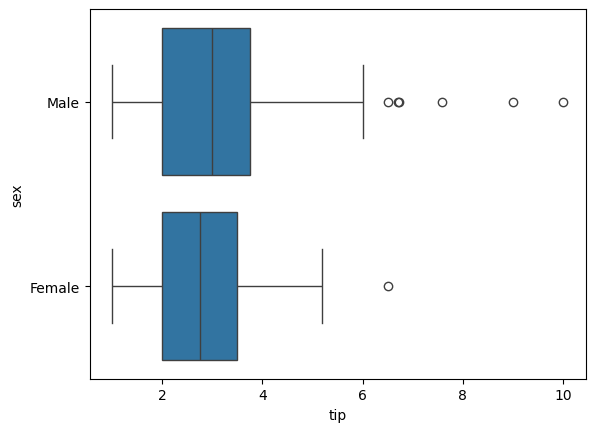

In [4]:
tips = sns.load_dataset("tips")
sns.boxplot(data=tips, x='tip', y='sex');

If there's a lot of overlap between the different groups, this indicates that there is no relation between both variables.

The violin plot works similarly:

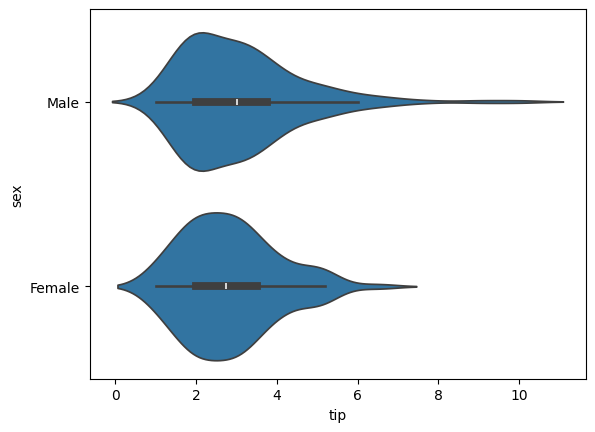

In [5]:
sns.violinplot(data=tips, x='tip', y='sex');

### Density plot

For a density (kernel density estimate) plot, map the independent (qualitative) variable on the `hue` attribute and the dependent variable on the X-axis.

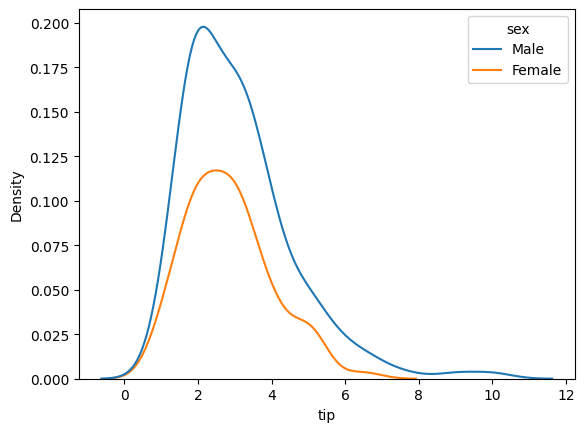

In [6]:
sns.kdeplot(data=tips, hue='sex', x='tip');

### Bar chart with error bars

Another chart type that is often used for this type of data is a bar plot of the sample mean of each group. However, watch out with this. Only showing the sample mean in a chart is insufficient to determine whether any difference between groups is significant. A chart should also show the dispersion in the data set. This can be visualized using error bars.

In the example below, the parameter `errorbar='sd'` (in older versions of Seaborn: `ci='sd'`) will show the standard deviation:

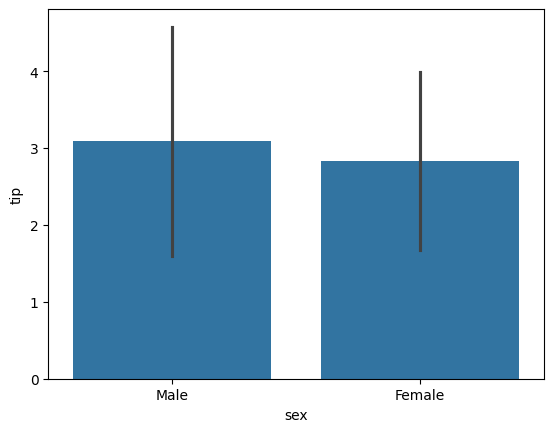

In [9]:
sns.barplot(data=tips, x='sex', y='tip', errorbar='sd');

Again, if there's a lot of overlap between the error bars, this indicates that there is no (or only a small) association between the variables.

Remark that this type of chart is only useful if the variable is normally distributed. In this dataset with a lot of outliers (see the boxplot from earlier), the symmetrical error bars do not correctly represent how the data is distributed. Usually a boxplot or density plot is more appropriate.

## The t-test for two independent samples

Earlier, we saw how to apply the $t$-test to verify a statement about the sample mean of a small sample. The $t$-test can also be used to compare two samples. First, we will look at the case of independent samples that were taken separately.

**Example:** In a clinical trial, researchers want to determine whether some new drug has a reduced reaction speed, i.e. a higher reaction time,  as a side effect. Six participants received the drug (treatment group), while six others received a placebo (control group). Their response time to a stimulus was then measured (in ms). We want to investigate whether there are significant differences between the treatment and control groups.

The response time measurements are given below:

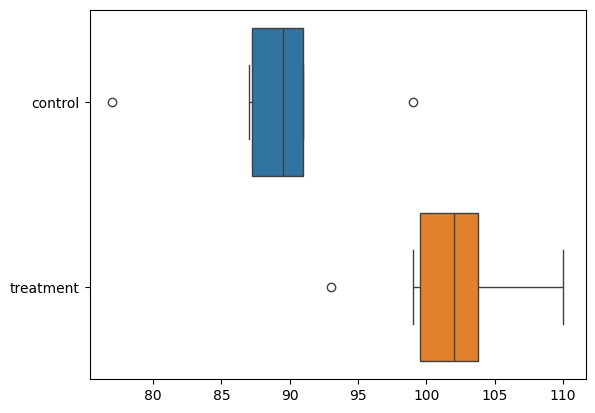

In [13]:
# Sample:
control = np.array([91, 87, 99, 77, 88, 91])
treatment = np.array([101, 110, 103, 93, 99, 104])
# Visualization:
sns.boxplot(
    data=pd.DataFrame({'control': control, 'treatment': treatment}),
    orient='h');

The population mean for patients in the control group is notated $\mu_1$, for those in the treatment group $\mu_2$.

The hypotheses are:

- $H_0$: $\mu_1 - \mu_2 = 0$ (reaction time is the same in both groups)
- $H_1$: $\mu_1 - \mu_2 < 0$ (reaction time is significantly higher in the treatment group compared to the control group)

In Python, we can use the `ttest_ind()` function from `scipy.stats`. Parameters `a` and `b` are the two groups to be compared. `alternative='less'` indicates that we want to test for the alternative hypothesis that the mean of the control group is less than the mean of the treatment group. Finally, by setting `equal_var=False`, it is *not* assumed that both groups have the same standard deviation.

In [14]:
stats.ttest_ind(a=control, b=treatment,
    alternative='less', equal_var=False)

TtestResult(statistic=np.float64(-3.445612673536487), pvalue=np.float64(0.003391230079206901), df=np.float64(9.479682492670932))

The $p$-value is very small, which means that, if the null hypothesis would be correct, it is highly unlikely to observe the differences between the two groups. Consequently, we reject the null hypothesis. Based on the sample, there is reason to conclude that the drug does indeed have a significant impact on reaction speed.

**Example:** In the `tips` dataset, do male and female staff get the same tips or is there a difference? Take a look at the plot above to make a guess first.

In [16]:
stats.ttest_ind(alternative='two-sided',
    a=tips.tip[tips.sex == 'Male'],
    b=tips.tip[tips.sex == 'Female'])

TtestResult(statistic=np.float64(1.387859705421269), pvalue=np.float64(0.16645623503456755), df=np.float64(242.0))

The $p$ value of 0.166 is quite large, so we do not reject the null hypothesis. On a significance level of e.g. 0.05, the data set does not contain evidence that male and female serving staff receive different tips.


## The t-test for paired samples

In this variant of the $t$-test, a measurement is taken on each element of the sample, one time before and one time after an intervention. The aim is to determine whether the intervention had a significant effect on the measurement.

**Case:** A study examined whether cars that run on petrol with additives also have a lower consumption. Ten cars were first filled with either regular gasoline or gasoline with additives (determined by tossing a coin), after which consumption was measured (expressed in miles per gallon). The cars were then refueled with the other type of petrol and consumption was measured again.

We use a paired $t$ test to determine whether cars are significantly more economical on gasoline with additives.

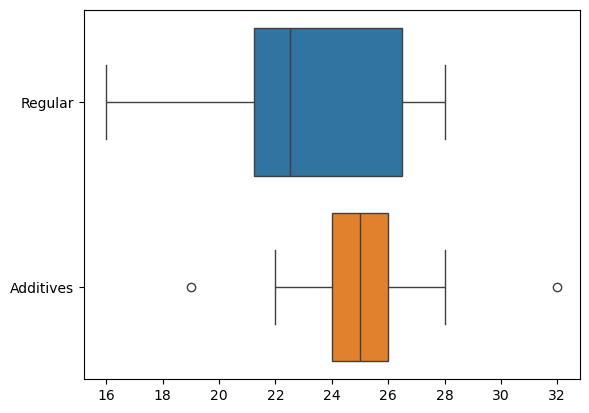

In [ ]:
# Measurements
regular =   np.array([16, 20, 21, 22, 23, 22, 27, 25, 27, 28])
additives = np.array([19, 22, 24, 24, 25, 25, 26, 26, 28, 32])
# Visualization
sns.boxplot(
    data={'Regular': regular, 'Additives': additives}, 
    orient='h');

In [ ]:
# Paired t-test with ttest_rel()
stats.ttest_rel(regular, additives, alternative='less')

TtestResult(statistic=-4.47213595499958, pvalue=0.00077494295585091, df=9)

We use `alternative='less'` because we want to check whether the mileage per gallon on regular fuel is smaller than on fuel with additives.

The $p$-value, 0.0007749, is very small. Even with an $\alpha = 0.01$, we can reject the null hypothesis. According to this sample, we have reasons to assume that the fuel with additives indeed leads to significantly lower fuel consumption.



## Effect size


If we want to know whether two groups are significantly different, we can use a statistical test like the two sample $t$-test. The result of a statistical test is generally either "true" or "false", depending on the $p$-value and the chosen significance level.

*Effect size* is another metric to express the magnitude of the difference between two groups. Several definitions of effect size exist, but one of the most commonly used is *Cohen's $d$*.

*Cohen's $d$* is in particular used in research in education to evaluate what factors influence learning outcomes for students. Factors include learning and teaching strategies, use of technology, classroom management, student and teacher attributes, etc.


$$d = \frac{\overline{x}_1 - \overline{x}_2}{s}$$

$$s = \sqrt{\frac{(n_1-1)s_1^2 + (n_2-1)s_2^2}{n_1+n_2-2}}$$

With: $\overline{x}_1$ and $\overline{x}_2$ the mean of each group, $n_1$ and $n_2$ the respective sample sizes and $s_1$ and $s_2$ the respective sample standard deviations.

Research papers in this domain always report Cohen's $d$, which allows us to compare the results of different studies. For example, Hattie (2012) performed a massive meta-analysis that synthesises findings from 80,000 studies into what works best in education. As a rule of thumb, an influence with $d$ of at least 0.4 is considered to potentially accelerate student achievement. A value for $d$ of 1 means that students can acquire competencies in about half the time they normally would.

### Cohen's $d$

Cohen's $d$ is defined as the difference between the means of both groups, divided by a pooled standard deviation. There's no Python function for calculating Cohen's $d$ readily available, so we define it here, according to the formula:


In [ ]:
def cohen_d(a, b):
    na = len(a)
    nb = len(b)
    pooled_sd = np.sqrt( ((na-1) * np.var(a, ddof=1) +
                          (nb-1) * np.var(b, ddof=1)) / (na + nb - 2) )
    return (np.mean(b) - np.mean(a)) / pooled_sd

In [ ]:
# Effect size of additives in gasoline:
cohen_d(regular, additives)

0.5573262931770191

# Module 6. Bivariate analysis of 2 quantitative variables

In this module, we discuss the case where both variables are quantitative. Specifically, we'll explore the concept of *linear regression*. Other analysis methods do exist, but those are beyond the scope of this course.

Regression analysis is an extremely flexible tool that can aid decision
making in many areas. [Kimes and Fitzsimmons (1990)](https://ecommons.cornell.edu/handle/1813/72194) describe how
it has been used by La Quinta Motor Inns, a moderately priced hotel
chain oriented toward serving the business traveler, to help make site
location decisions. 

There are two potential objectives of regression analysis. The first objective is to understand how the world operates, for example, one might try to discover whether there is any
gender discrimination in salaries, taking into account differences in work experience and
education level.  
The second objective is to make predictions. A good example of this is
when the variable in question is company sales, and variables such as advertising and past
sales levels are used as explanatory variables.

In [4]:
# Package imports
import numpy as np;                                  # "Scientific computing"
import scipy.stats as stats;                         # Statistical tests

import pandas as pd;                                 # Dataframe
import matplotlib.pyplot as plt;                     # Basic visualisation
from statsmodels.graphics.mosaicplot import mosaic;  # Mosaic plot
import seaborn as sns;                               # Advanced dataviz

## Visualization

A good way to begin any regression analysis is to draw one or more scatterplots. If there
is any relationship between the two variables, it is usually apparent from the scatterplot.  
To visualize quantitative data, we can use Seaborn's `relplot()` function. The independent variable should be mapped to the X-axis, the dependent variable to the Y-axis.  
In the example below we will use the Penguins dataset.

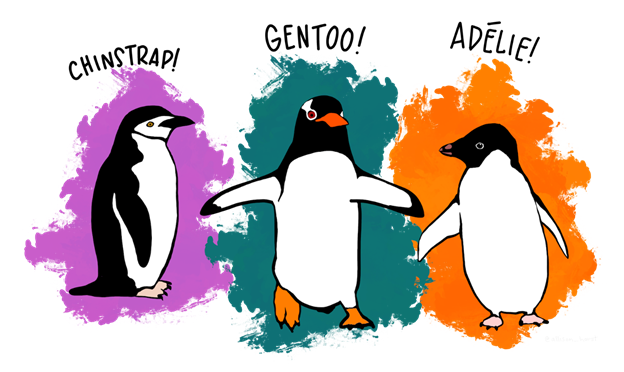

In [5]:
penguins = sns.load_dataset('penguins') # Load the Palmer Penguins demo dataset
penguins.head()

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female


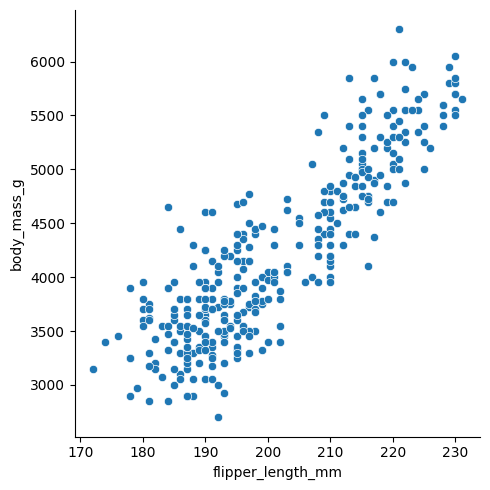

In [7]:
sns.relplot(data=penguins,  x='flipper_length_mm', y='body_mass_g');

Using other chart attributes like hue, style, etc. you can also visualize categorical variables in the data set, e.g.:

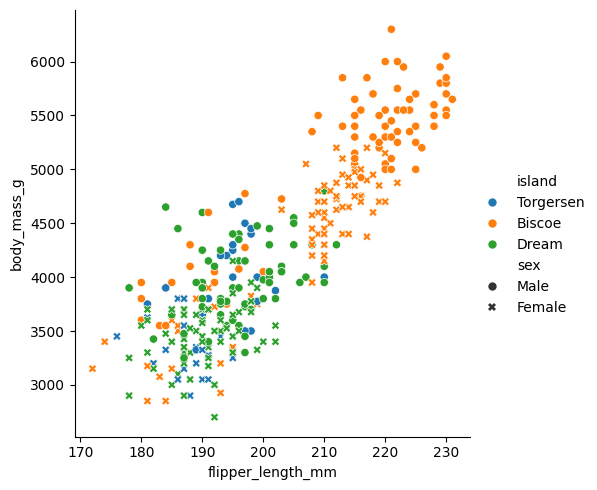

In [9]:
sns.relplot(data=penguins,
            x='flipper_length_mm', y='body_mass_g', 
            hue='island', style='sex');

Another example:

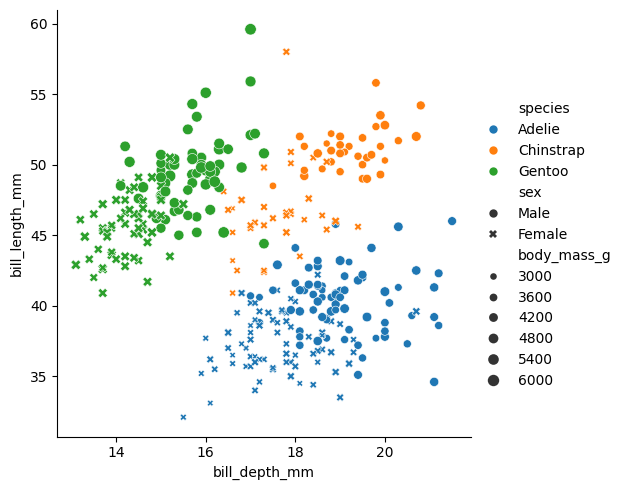

In [10]:
sns.relplot(data=penguins,
            x='bill_depth_mm', y='bill_length_mm',
            size='body_mass_g', 
            hue='species', style='sex');

## Method of Least Squares: Introduction

Scatterplots are very useful for indicating linear relationships and the
strengths of these relationships. But they do not actually quantify the relationships. For
example, it is clear from the scatterplot that `body_mass_g` is related
to `flipper_length_mm`, but the scatterplot does not specify exactly what this relationship 
is. If the `flipper_length_mm` is 190, what would you predict `body_mass_g` to be?  
To
answer these questions, the relationship between the dependent variable `body_mass_g` and the
explanatory variable `flipper_length_mm` must be quantified.  
To reduce the number of points in the scatterplot and make the plots as clear as possible, we are going to take only the male, Chinstrap penguins into account.

In [13]:
male_chinstrap = penguins[(penguins['species'] == 'Chinstrap') & (penguins['sex'] == 'Male')]
male_chinstrap.head()

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
153,Chinstrap,Dream,50.0,19.5,196.0,3900.0,Male
154,Chinstrap,Dream,51.3,19.2,193.0,3650.0,Male
156,Chinstrap,Dream,52.7,19.8,197.0,3725.0,Male
159,Chinstrap,Dream,51.3,18.2,197.0,3750.0,Male
161,Chinstrap,Dream,51.3,19.9,198.0,3700.0,Male


Some male, Chinstrap penguins have the same `flipper_length_mm`, but a different `body_mass_g`. To simplify things, we calculate the average value for `body_mass_g` per `flipper_length_mm`.

In [16]:
male_chinstrap = male_chinstrap.groupby('flipper_length_mm')['body_mass_g'].mean().reset_index()
male_chinstrap.head(10)

,flipper_length_mm,body_mass_g
0,187.0,3250.000000
1,191.0,3400.000000
2,193.0,3741.666667
3,194.0,3775.000000
4,195.0,4000.000000
5,196.0,3725.000000
6,197.0,3675.000000
7,198.0,3700.000000
8,200.0,3800.000000
9,201.0,4160.000000


The data is plotted on an XY graph. 

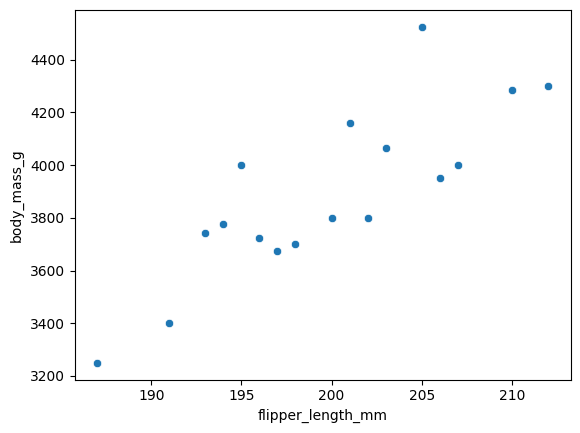

In [19]:
sns.scatterplot(data=male_chinstrap, x='flipper_length_mm', y='body_mass_g');

The scatterplot above hints at a linear
relationship between these two variables. It would not be diffcult to draw a straight
line through these points to produce a reasonably good fit. But which is the best line to use?
A line can be defined by $$y = ax + b$$ in which $a$ is the slope of the line and $b$ is the intercept of the line (that's the location on the Y axis that the line crosses when X equals 0).
We will use the following values for $a$ and $b$:  
`a = 37 and b = -3385`  
`a = 23 and b = -820`  
`a = 23 and b = -715`  
`a = 20.5 and b = -92`  
`a = 29 and b = -1635`  
We need a way to 'calculate' if one line is a better fit than another line.  
For that we will use the sum of squared residuals.

**What is a residual?**  
Consider the following image. Three points in the scatterplot are shown, along with a straight line. The vertical distance from the horizontal axis to any point, can be decomposed into two parts: the vertical distance from the horizontal axis to the line, and the vertical distance from the line to the point. The first of these is called the fitted value,
and the second is called the residual. So a fitted value is the predicted value of the dependent variable. The corresponding residual is the difference between the actual and fitted values of the dependent variable.


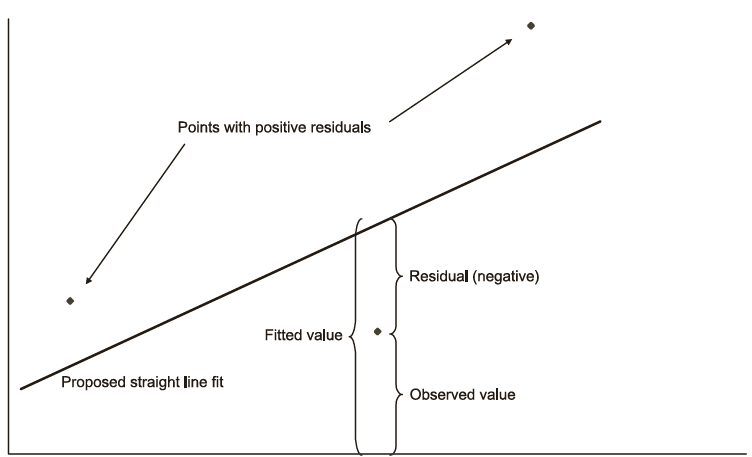


In the following code blocks, a small animation is created to try to find the straight line that fits the points the best.  
The dotted green lines are the residuals.

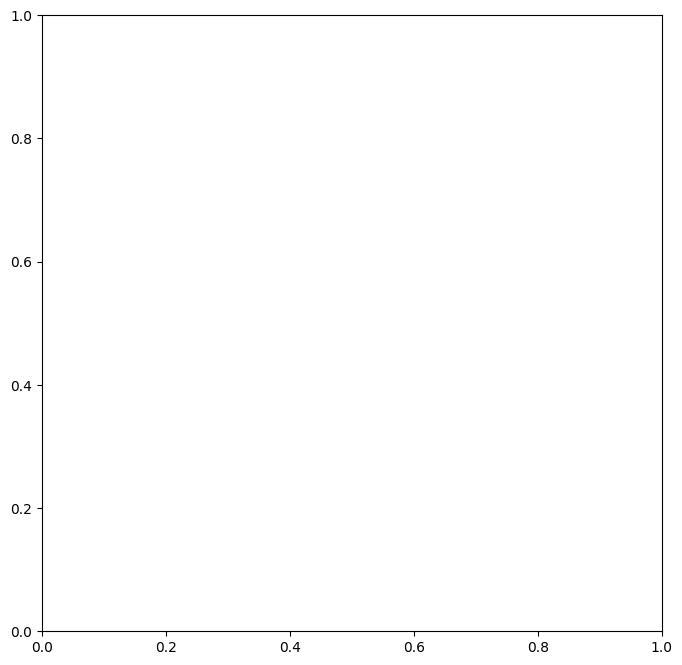

In [20]:
import math
import time

from matplotlib import rc
from matplotlib.animation import FuncAnimation
from matplotlib.collections import LineCollection

# set the minimum and maximum value of the x- and y-axis
xmin = math.floor(male_chinstrap['flipper_length_mm'].min() / 10) * 10
xmax = math.ceil(male_chinstrap['flipper_length_mm'].max() / 10) * 10

ymin = math.floor(male_chinstrap['body_mass_g'].min() / 10) * 10
ymax = math.ceil(male_chinstrap['body_mass_g'].max() / 10) * 10

a_values = [37, 23, 23, 20.5, 29]
b_values = [-3385, -820, -715, -92, -1635]


def animate(i):
  len_male_chinstrap_plus_2 = len(male_chinstrap) + 2

  j = i // len_male_chinstrap_plus_2
  k = i % len_male_chinstrap_plus_2

  # alles leegmaken
  axs.clear()

  # axs instellen
  axs.set_xlim([xmin, xmax])
  axs.set_ylim([ymin, ymax])

  # punten tekenen
  for l in range(len(male_chinstrap)): 
    axs.plot(male_chinstrap.iloc[l, 0], male_chinstrap.iloc[l, 1], marker="o", markersize=10, markeredgecolor="red", markerfacecolor="green")
    

  if (k == 0):  
    # these are matplotlib.patch.Patch properties
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axs.text(0.05, 0.95, f'Attempt n° {j + 1}', transform=axs.transAxes, fontsize=14, verticalalignment='top', bbox=props)
    print()

  if k > 0:
    # rechte tekenen
    x_values = [xmin + 2, xmax - 2]
    y_values = [a_values[j] * x_values[0] +  b_values[j], a_values[j] * x_values[1] + b_values[j]]
    axs.plot(x_values, y_values, lw = 3)

  if k > 1:   
    # lijn segmenten toevoegen
    segs = []
    sum_squared_residuals = 0
    for q in range(k - 1):
      sum_squared_residuals +=  ((a_values[j] * male_chinstrap.iloc[q, 0] +  b_values[j]) - male_chinstrap.iloc[q, 1]) ** 2 
      segs.append([(male_chinstrap.iloc[q, 0], a_values[j]  * male_chinstrap.iloc[q, 0] +  b_values[j]),(male_chinstrap.iloc[q, 0], male_chinstrap.iloc[q, 1])])
    lc = LineCollection(segs, linewidths=1, colors='g', linestyle='dashed')
    axs.add_collection(lc)
    
    # these are matplotlib.patch.Patch properties
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    # place a text box in upper left in axes coords
    axs.text(0.05, 0.95, f'Sum Squared Residuals = {sum_squared_residuals:5.2e}', transform=axs.transAxes, fontsize=14, verticalalignment='top', bbox=props)

# calculating the frames needed
len_male_chinstrap_plus_2 = len(male_chinstrap) + 2

frames = []
for i in range(len(a_values)):
  frames.append(i * len_male_chinstrap_plus_2)
  frames.append(i * len_male_chinstrap_plus_2)
  frames.append(i * len_male_chinstrap_plus_2 + 1)
  frames.append(i * len_male_chinstrap_plus_2 + 1)
  for j in range(len(male_chinstrap)):
    frames.append(i * len_male_chinstrap_plus_2 + 2 + j)
  frames.append(i * len_male_chinstrap_plus_2 + 2 + j)
  frames.append(i * len_male_chinstrap_plus_2 + 2 + j)

fig, axs = plt.subplots(figsize=(8, 8));


In [21]:
rc('animation', html='jshtml');
anim = FuncAnimation(fig, animate, frames=frames, interval=1000, repeat=False);
anim

We can measure how well a line fits the data by seeing how close it is to the data points. We'll start with the point in the lower left-hand corner of the graph. We can draw a dashed line from this point up to the gray line. The **residual** is the difference beteen the actual and fitted values of the dependent variable. The term is squared to ensure that each term is positive. 
Finally we take the sum of all the squared residuals between the line and the data points. This is called the **sum of squared residuals**.  
Note: If we would simply use the sum of the residuals, the positive residuals would cancel the negative residuals. We could also minimize the sum of the _absolute values_ of the residuals and this would be a perfectly reasonable procedure. However, for technical and historical reasons,
it is not the procedure usually chosen.

### Method of least squares

The **least squares line** is the line that minimizes the sum of the squared residuals.

The minimization problem itself is a calculus problem, but in essence we want to approximate a collection of points $(x_i, y_i)$ (with $i: 1, \ldots, n$) as closely as possible with a line $$\hat{y} = \beta_0 + \beta_1 x.$$ The notation $\hat{y}$ stands for "an estimation for $y$". Parameters $\beta_0$ (intercept with the Y axis) and $\beta_1$ (slope) are calculated as follows:


$\beta_1 = \displaystyle \frac{\sum_{i=1}^{n}(x_i - \overline{x})(y_i - \overline{y})}{\sum_{i=1}^{n}(x_i - \overline{x})^2}$

$\beta_0 = \overline{y} - \beta_1 \overline{x}$

These values for $\beta_0$ and $\beta_1$ will minimize the sum of the squared residuals between the observed and the fitted values (hence the name of the "method of least squares"). The proof to obtain these values is beyond the scope of this course.

In the code block below, we calculate the components of the formula for $\beta_1$

In [37]:
least_squares = pd.DataFrame({
        'x': male_chinstrap.flipper_length_mm,
        'y': male_chinstrap.body_mass_g
    })
mx = least_squares.x.mean()
my = least_squares.y.mean()

least_squares['(x-x̄)'] = least_squares['x'] - mx
least_squares['(y-ȳ)'] = least_squares['y'] - my

least_squares['(x-x̄)(y-ȳ)'] = least_squares['(x-x̄)'] * least_squares['(y-ȳ)']
least_squares['(x-x̄)²'] = least_squares['(x-x̄)'] ** 2
least_squares

,x,y,(x-x̄),(y-ȳ),(x-x̄)(y-ȳ),(x-x̄)²
0,187.0,3250.000000,-12.823529,-641.274510,8223.402537,164.442907
1,191.0,3400.000000,-8.823529,-491.274510,4334.775087,77.854671
2,193.0,3741.666667,-6.823529,-149.607843,1020.853518,46.560554
3,194.0,3775.000000,-5.823529,-116.274510,677.128028,33.913495
4,195.0,4000.000000,-4.823529,108.725490,-524.440600,23.266436
5,196.0,3725.000000,-3.823529,-166.274510,635.755479,14.619377
6,197.0,3675.000000,-2.823529,-216.274510,610.657439,7.972318
7,198.0,3700.000000,-1.823529,-191.274510,348.794694,3.325260
8,200.0,3800.000000,0.176471,-91.274510,-16.107266,0.031142
9,201.0,4160.000000,1.176471,268.725490,316.147636,1.384083


In [38]:
# Numerator and denomitator of the formula for b_0:
num = sum(least_squares['(x-x̄)(y-ȳ)'])
denom = sum(least_squares['(x-x̄)²'])
beta1 = num/denom
beta0 = my - beta1 * mx

print(f"beta_1 = {num:.4f} / {denom:.4f} = {beta1:.4f}")
print(f"beta_0 = {my:.4f} - {beta1:.4f} * {mx:.4f} = {beta0:.4f}")
print(f"ŷ = {beta0:.4f} + {beta1:.4f} x")

beta_1 = 29375.4902 / 756.4706 = 38.8323
beta_0 = 3891.2745 - 38.8323 * 199.8235 = -3868.3320
ŷ = -3868.3320 + 38.8323 x


Let's check if the values for $\beta_0$ and $\beta_1$ provide a good approximation of the observed data:

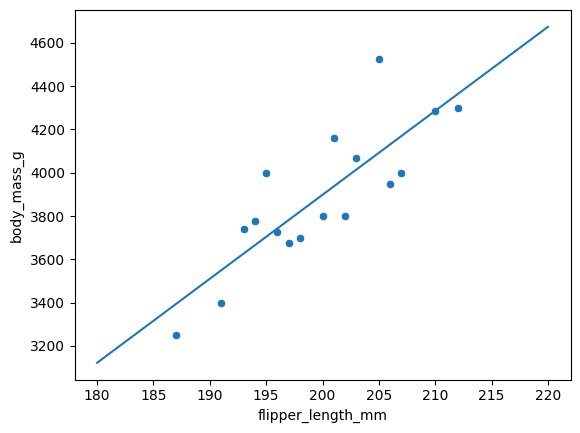

In [39]:
x_values = [xmin, xmax]
y_values = [beta1 * x_values[0] + beta0, beta1 * x_values[1] + beta0]

sns.lineplot(x=x_values, y=y_values);
sns.scatterplot(x=male_chinstrap.flipper_length_mm, y=male_chinstrap.body_mass_g);

You can plot a data set **with its regression line** using the functions `regplot` or `lmplot`:

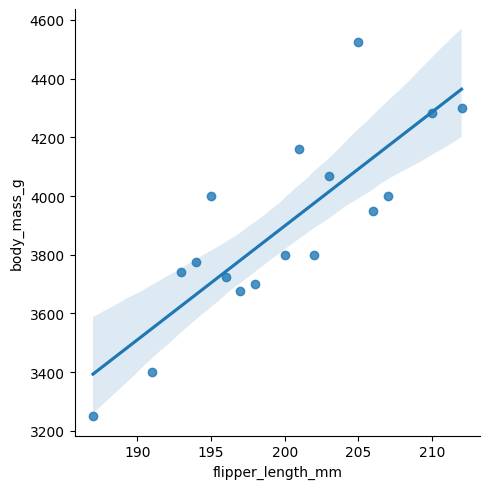

In [22]:
sns.lmplot(data=male_chinstrap, x='flipper_length_mm', y='body_mass_g');

The regression line corresponds with the one we drew using the calculated parameters!  

The formulas for the slope and intercept in simple linear regression, are rather for conceptual purposes. Virtually all statistical software packages perform this minimization automatically.

E.g. the Python library **scikit-learn** has code to calculate a linear regression model from a set of observations.

We can then create an instance of the class `LinearRegression` and pass the X- and Y-values to be fitted. The array with X-values must be first converted in a 2D array.

In [41]:
from sklearn.linear_model import LinearRegression

male_chinstrap_x = male_chinstrap.flipper_length_mm.values.reshape(-1,1)
male_chinstrap_y = male_chinstrap.body_mass_g

weight_model = LinearRegression().fit(male_chinstrap_x, male_chinstrap_y)

print(f"Regression line: ŷ = {weight_model.intercept_:.4f} + {weight_model.coef_[0]:.4f} x")

Regression line: ŷ = -3868.3320 + 38.8323 x


## Covariance

**Covariance** is a measure that indicates whether a (linear) relationship
between two variables is increasing or decreasing.

Covariance is defined as: $$\mathrm{Cov}(X,Y) = \frac{1}{n-1}\sum_{i=1}^n(x_i - \overline{x})(y_i - \overline{y})$$

Note: Covariance of population (denominator 𝑛) vs. sample (denominator 𝑛 − 1)

Covariance is essentially an average of products of deviations from means. If _X_ and _Y_ vary in the same direction, then when _X_ is above its mean, _Y_ will tend to be above its mean, and when _X_ is below its mean,
_Y_ will tend to be below its mean. In either case, the product of deviations will be positive—
a positive times a positive or a negative times a negative—so the covariance will be positive.
The opposite is true when _X_ and _Y_ vary in opposite directions. Then the covariance
will be negative.

Covariance measures the direction of a linear relationship between two
numerical variables. If this straight line rises from left to right, the relationship
is positive and the covariance will be a positive number. If it falls from left to right,
the relationship is negative and the covariance will be a negative number.

Cov > 0: increasing  
Cov ≈ 0: no relationship  
Cov < 0: decreasing 

To understad why this is the case, take a look at the plot of the chinstrap flipper length vs body mass. The dotted green lines are the means of each variable.

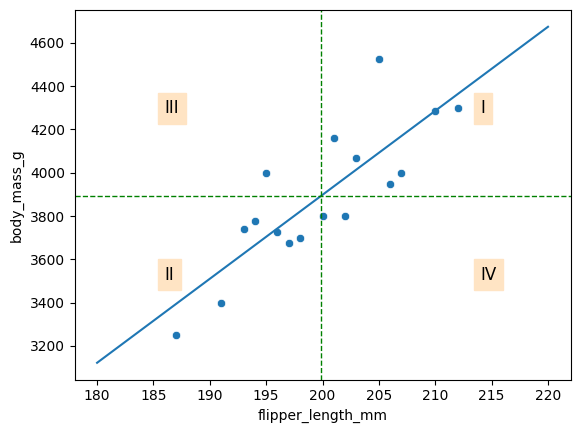

In [42]:
# Plot the observations
sns.scatterplot(x=male_chinstrap.flipper_length_mm, y=male_chinstrap.body_mass_g);
# Draw the regression line through two points
sns.lineplot(x=[xmin, xmax], y=[beta1 * x_values[0] + beta0, beta1 * x_values[1] + beta0]);

# Plot the means of x and y
plt.axvline(male_chinstrap.flipper_length_mm.mean(), lw=1, color='g', linestyle='dashed')
plt.axhline(male_chinstrap.body_mass_g.mean(), lw=1, color='g', linestyle='dashed')

# Add quadrant labels
plt.text(xmin + (xmax-xmin)*.85, ymin + (ymax-ymin)*.8, "I",   backgroundcolor="bisque", fontsize="large");
plt.text(xmin + (xmax-xmin)*.15, ymin + (ymax-ymin)*.2, "II",  backgroundcolor="bisque", fontsize="large");
plt.text(xmin + (xmax-xmin)*.15, ymin + (ymax-ymin)*.8, "III", backgroundcolor="bisque", fontsize="large");
plt.text(xmin + (xmax-xmin)*.85, ymin + (ymax-ymin)*.2, "IV",  backgroundcolor="bisque", fontsize="large");

Each observation will contribute to the sum that results in the value of the covariance:

- In quadrant I, both x and y are *larger* than their respective means, so $(x - \overline{x})$ and $(y - \overline{y})$ are both *positive*, resulting in a **positive** term
- In quadrant II, both x and y are *smaller* than their respective means, so $(x - \overline{x})$ and $(y - \overline{y})$ are both *negative*, resulting in a **positive** term
- In quadrant III, however, $(x - \overline{x})$ is *negative* while $(y - \overline{y})$ is *positive*, resulting in a **negative** term
- In quadrant IV,  $(x - \overline{x})$ is *positive* while $(y - \overline{y})$ is *negative*, also resulting in a **negative** term

So, all observations in quadrants I and II will make the covariance larger, and observations in quadrants III and IV will make it smaller. If there are a lot of observations in I and II, and fewer in III and IV (which is the case in datasets with an increasing relation), the overall result will be a positive covariance. A lot of observations in III and IV and fewer in I and II (i.e. a decreasing relation) will result in a negative covariance.

If we calculate the covariance for this dataset, we expect a positive result:

In [43]:
# Calculate covar using the formula
covar = sum((male_chinstrap.flipper_length_mm - male_chinstrap.flipper_length_mm.mean()) * 
            (male_chinstrap.body_mass_g - male_chinstrap.body_mass_g.mean())) / (len(male_chinstrap) - 1)
        
print(f"Cov(x,y) = {covar}")

Cov(x,y) = 1835.9681372549019


To calculate covariance, you can use the Numpy function `cov`. It's a bit complicated to use, because it returns not a single value, but a covariance matrix:

```
[[cov(a,a), cov(a,b)],
 [cov(b,a)  cov(b,b)]]
```

Remark that the definition of `cov(a,a)` reduces to the variance of `a`! Can you explain why?

We can extract the value we need with:

In [46]:
np.cov(
    male_chinstrap.flipper_length_mm,
    male_chinstrap.body_mass_g,
    ddof=1)[0][1]

1835.9681372549019

Remark that we use the parameter `ddof=1` for an unbiased estimate from the sample!

Covariance has a serious limitation as a descriptive measure because it is very sensitive to the units in which X and Y are measured. For example, if we had expressed the body mass of the chinstrap penuins in kg instead of g, the covariance would be $\approx$ 1.836 instead of $\approx$ 1836. This limits the usefulness of covariance as a descriptive measure

### Pearson's product-moment correlation coefficient

Correlation (or, specifically, Pearson's product-moment correlation coefficient) is defined as:

$$R = \frac{\mathrm{Cov}(X,Y)}{\sigma_x \sigma_y} = \frac{\sum(x_i - \overline{x})(y_i - \overline{y})}{\sqrt{\sum{(x_i-\overline{x})^2}} \sqrt{\sum{(y_i - \overline{y})^2}}}$$

𝑅 is a measure for
the strength of a linear correlation between 𝑥 and 𝑦.

Correlation is a _unitless_ quantity that is unaffected by the measurement scale. For example, the correlation
is the same regardless of whether the variable _X_ (e.g. height of a person) is measured in millimeters, centimeters, decimeters or meters.

The correlation is not only unaffected by the units of measurement of the two variables, but it is always between −1 and +1. The closer it is to either of these two extremes, the closer the points in a scatterplot are to a straight line, either in the negative or positive direction.  
On the other hand, if the correlation is close to 0, the scatterplot is typically a 'cloud' of points with no apparent relationship. However, although it is not common, it is also _possible_ that the points are close to a curve and have a correlation close to 0. This is because correlation is relevant only for measuring **linear** relationships.

In [48]:
# Correlation calculated from covariance
stdx = male_chinstrap.flipper_length_mm.std()
stdy = male_chinstrap.body_mass_g.std()

R1 = covar / (stdx * stdy)
print(f"R ≈ {covar:.4f} / ( {stdx:.4f} * {stdy:.4f} ) ≈ {R1:.4f}")

R ≈ 1835.9681 / ( 6.8760 * 322.9355 ) ≈ 0.8268


In [51]:
# Correlation from elaborated formula
xx = male_chinstrap.flipper_length_mm - male_chinstrap.flipper_length_mm.mean()
yy = male_chinstrap.body_mass_g - male_chinstrap.body_mass_g.mean()
R2 = sum(xx * yy) / (np.sqrt(sum(xx ** 2) * sum(yy ** 2)))
print(f"R ≈ {R2:.4f}")

R ≈ 0.8268


In [52]:
# Python function numpy.corrcoef() - returns a matrix, like numpy.cov()
cor = np.corrcoef(
    male_chinstrap.flipper_length_mm,
    male_chinstrap.body_mass_g)[0][1]
print(f"R ≈ {cor:.4f}")

R ≈ 0.8268


R indicates an increasing and strond linear relation between flipper_length and body_mass.

### Coefficient of determination

The coefficient of determination $R^2$ gives the percentage of the variance of the observed values relative to the regression line, i.e. the interpretation of $R^2$ is 'the fraction of variation of the dependent variable explained by the regression line'. The closer to 1, the more the variance is explained by the regression line, and the stronger the linear relation between the variables: when the residuals are small, $R^2$ will be close to 1, but when they are large, $R^2$ will be close to 0. Graphically, the higher the coefficient of determination, the closer the observations are located near the regression line.

The determination coefficient can be calculated as the square of Pearson's correlation coefficient:

In [22]:
cor ** 2

0.6836386990302872

So for this case, about 68% of the variance in the observations is explained by the regression line, which indicates a strong linear relation (see below).

The `LinearModel` class also has a method to calculate the coefficient of determination. We first need to call the `fit()` method and then we can use the method `score()` that returns $R^2$

In [53]:
chinstrap_x = male_chinstrap.flipper_length_mm.values.reshape(-1,1)
chinstrap_y = male_chinstrap.body_mass_g

families_model = LinearRegression().fit(chinstrap_x, chinstrap_y)
families_model.score(chinstrap_x, chinstrap_y)

0.6836386990302872

### Interpretation of R and R²

Depending on the value of $|R|$ (or $R^2$), you can draw a conclusion about the strength of the linear relation between the two variables:

| $abs(R)$  |  $R^2$   | Explained variance |   Linear relation    |
| :-------: | :------: | :----------------: | :------------------: |
|   < .3    |   < .1   |       < 10%        |      very weak       |
|  .3 - .5  | .1 - .25 |     10% - 25%      |         weak         |
|  .5 - .7  | .25 - .5 |     25% - 50%      |       moderate       |
| .7 - .85  | .5 - .75 |     50% - 75%      |        strong        |
| .85 - .95 | .75 - .9 |     75% - 90%      |     very strong      |
|   > .95   |   > .9   |       > 90%        | exceptionally strong |

**Remark** that the value of $R$ doesn't say anything about the steepness of the regression line! It only indicates how close the observations are to the regression line. Therefore, it is **wrong** to say that a value of e.g. $R = 0.8$ indicates a strongly increasing linear relation! Instead, you should say it indicates an _increasing and strong linear relation_.

The image below with the correlation coefficient for several data sets illustrates this.


<img src="https://upload.wikimedia.org/wikipedia/commons/d/d4/Correlation_examples2.svg" width="800"/>

### In general

- $R^2$ is easier to interpret than $R$.
- The interpretation of $R^2$ as the square of a correlation helps to clarify the issue of when a correlation is "large".  
    - For example: how much better is R = 0.8 than R = 0.7 or R = 0.9? 
    - If the correlation between two variables Y and X is ±0.8, the regression of Y on X will have an $R^2$ of 0.64; that is, the regression with X as the
only explanatory variable will explain 64% of the variation in Y.
    - If the correlation drops to ±0.7, this percentage drops to 49%; 
    - If the correlation increases to ±0.9, the percentage increases to 81%. 
- The point is that before a single variable X can explain a large percentage of the variation in some other variable Y, the two variables must be highly correlated, in
either a positive or negative direction.

Another example: How much better is R = 0.7 than R = 0.5?  

- R² = 0.7 * 0.7 ~ 0.5 => 50% of the original variation in explained  
- R² = 0.5 * 0.5 = 0.25 => 25% of the original variation in explained  

With R², it is easy to see that the first correlation is twice as good as the second.

In [56]:
# If you're using Google Colab, you can run this cell to upgrade the required dependencies
#!pip install matplotlib==3.4.3
#!pip install --upgrade statsmodels

# Module 7. Time series analysis

## Introduction

Many decision-making applications depend on a forecast of some quantity.  
Unfortunately, forecasting is a very difficult task, both in the short and in the long run. Forecasts are usually based on historical data. Analysts look for patterns or relationships in the historical data and then make forecasts. There are two problems with this approach.  
The first is that it is not always easy to detect historical patterns or relationships. In particular, it is often difficult to separate the noise, or random behaviour, from the underlying patterns. Some forecasts may even exaggerate it, assigning importance to patterns that are in fact random variations and unlikely to recur.  
The second problem is that there are no guarantees that patterns from the past will continue in the future. A new war may break out somewhere in the world, the bottom may fall out of the stock market, ...


**Extrapolation Models**  
Extrapolation models are quantitative models that use historical data of a time series variable to predict future values of the variable. The idea is that historical movements of a variable, such as company sales or Belgian exports to Germany, can be used to predict future values of the variable.  
Many extrapolation models are available, including moving averages and exponential smoothing. These extrapolation models look for patterns in the historical series and then
extrapolate these patterns into the future. Some try to track upwards or downwards long-term
trends and then project them. Some try to follow seasonal patterns (such as an increase in sales in November and December, a decrease in other months) and then project them.


**Components of Time Series Data**  
There are four important
components of a time series. These components are called the trend component, the seasonal
component, the cyclic component, and the random (or noise) component.

If the observations increase or decrease regularly through time, we say that the time series has a **trend**.

Many time series have a **seasonal component**. For example, a company that sells swimming pool equipment sales increase each spring and then remain
relatively high in the summer, and then fall until next spring, after which the
annual pattern repeats itself. An important aspect of the seasonal component is that it tends to
be predictable from one year to the next. The same seasonal pattern tends to repeat itself every year.


A **cyclic pattern** exists when data exhibit rises and falls that are not of fixed period. For example, during a recession housing sales generally go down, unemployment goes up, stock prices go down, and so on. But when the recession is over, all of these variables tend to move in the opposite direction.
If the fluctuations are not of fixed period then they are cyclic; if the period is unchanging and associated with some aspect of the calendar, then the pattern is seasonal.

The **random component (or noise)** is the unpredictable component that gives most time series graphs their irregular, zigzag appearance.
Usually, a time series can be determined only to a certain extent by its trend, seasonal, and cyclic components. Then other factors determine the rest. These other factors can be inherent randomness, unpredictable "shocks" to the system, the unpredictable behavior of human beings who interact with the system, and possibly others.

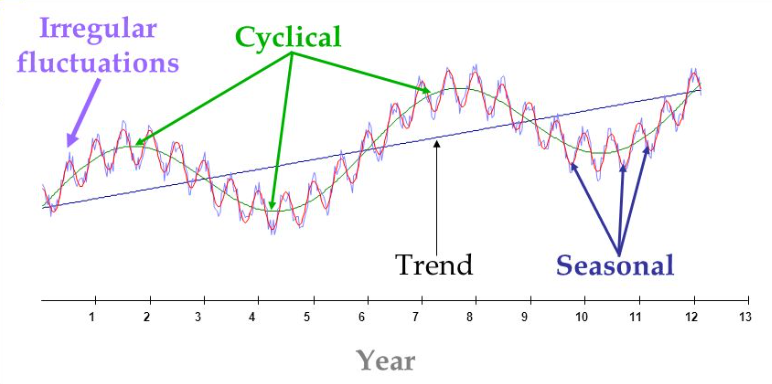

  The figure below shows the decomposition of the pregnancy number time series (top panel) into thee components: trend, seasonality, and residuals. [Published in Annual review of public health 2006
On time series analysis of public health and biomedical data.
S. Zeger, R. Irizarry, R. Peng]


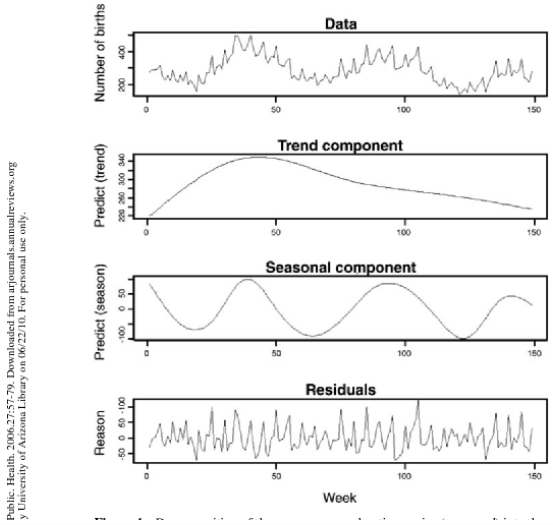

In [2]:
# Package imports
import numpy as np                                  # "Scientific computing"
import pandas as pd                                 # Dataframe

import scipy.stats as stats                         # Statistical tests
from sklearn.linear_model import LinearRegression   # Linear regression model

import matplotlib.pyplot as plt                     # Basic visualisation
from statsmodels.graphics.mosaicplot import mosaic  # Mosaic plot
import seaborn as sns                               # Advanced dataviz

In [18]:
# Read the data from CSV, parse dates and set the index
wounded_data = pd.read_csv(
    'https://raw.githubusercontent.com/HoGentTIN/dsai-en-labs/main/data/number_of_heavily_wounded_car_accidents_VL.txt',
    delimiter = "\t",
    parse_dates=['date']).set_index(['date'])

# Add frequency info to the index
wounded_data.index = pd.DatetimeIndex(wounded_data.index, freq='MS')

wounded_data.head()

,number_of_heavily_wounded
date,
2013-01-01,285
2013-02-01,276
2013-03-01,332
2013-04-01,381
2013-05-01,393


Remark that when creating the index for the data frame, we set the frequency to `MS`, i.e. Month Start, since each observation is taken at the first day of the month. A list of valid frequencies ([offset aliases](https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#offset-aliases)) can be found [in the Pandas documentation](https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#offset-aliases).

In Python, a time series can also be represented by an instance of the Pandas [`Series`](https://pandas.pydata.org/docs/reference/api/pandas.Series.html) class with an index of type DatetimeIndex.

As always, a graph of the time series is a good place to start analyzing the data. It indicates whether a linear trend is likely to provide a good fit. Generally, the graph should rise or fall at approximately a constant rate through time, without too much random (unpredictable) variation.

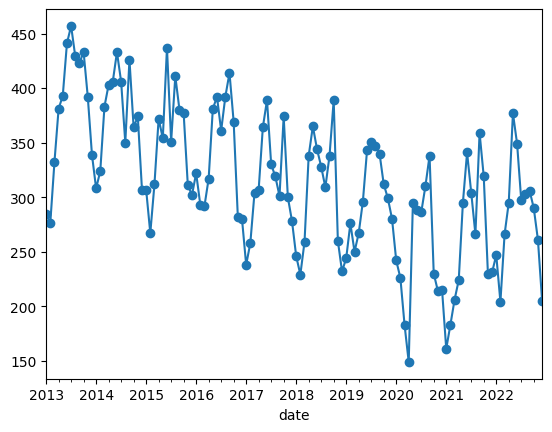

In [4]:
wounded_ts = pd.Series(
    data=np.array(wounded_data['number_of_heavily_wounded']),
    index=wounded_data.index
)
wounded_ts.plot(marker='o');

Columns in a `DataFrame` can also be processed as time series with the time/date as index.

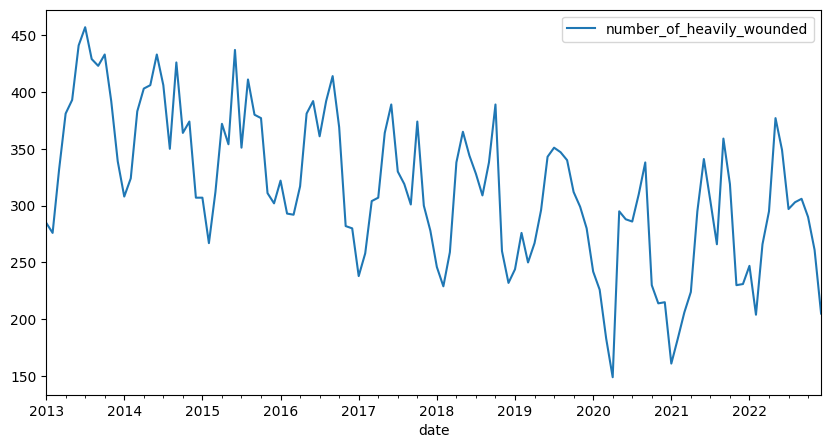

In [5]:
wounded_data.plot( y='number_of_heavily_wounded', figsize=[10,5]);

## Interludium

- What is the trend?
- What would you do to 'calculate' the exact trend?
- What is the seasonal component?
- Try to predict the number of heavily wounded for january 2023, based on the number of december 2022.
- Try to predict the number of heavily wounded for february 2023, based on the number of december 2022.
- Try to predict the number of heavily wounded for march 2023, based on the number of december 2022.


## Time series models

In the chart below, we attempt to model observed values with a constant function $X_t = b + \varepsilon_t$ (with $\varepsilon_t$ some random noise with constant variance). As an estimate for $b$, we take the average of the first observations. We can basically use our own judgement to choose how many.

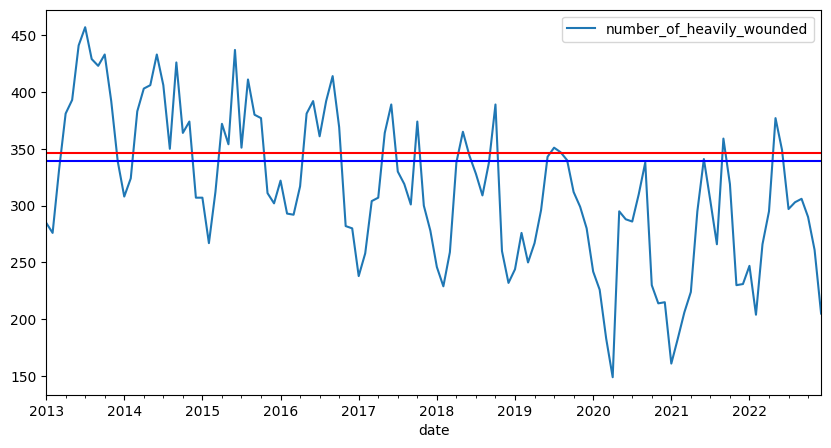

In [7]:
b_est_70 = wounded_data['number_of_heavily_wounded'].head(70).mean()
b_est_80 = wounded_data['number_of_heavily_wounded'].head(80).mean()

wounded_data.plot(y='number_of_heavily_wounded', figsize=[10,5]);
plt.axhline(y=b_est_70, color='red');   # Mean of first 70 observations
plt.axhline(y=b_est_80, color='blue')  # Mean of first 80 observations

If we want to model these values with a linear function $X_t = b_0 + b_1 t + \varepsilon_t$, we can use a technique we actually already used in another context: linear regression. A linear trend means that the time series variable changes by a constant amount each time
period.

The interpretation of $b_1$ is that it represents the expected change in the series from one
period to the next. If $b_1$ is positive, the trend is upward; if $b_1$ is negative, the trend is downward.
The intercept term $b_0$ is less important. It literally represents the expected value of the series at time t = 0.

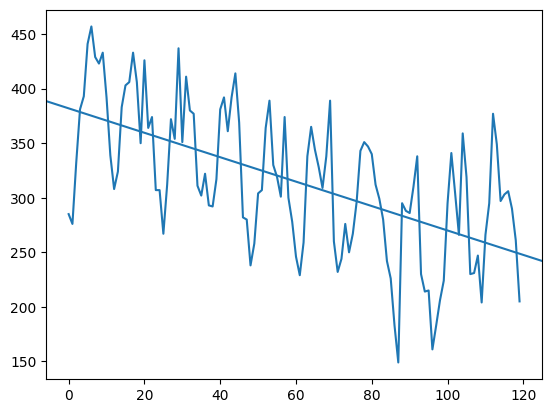

In [8]:
# Build a linear regression model
wounded_lm = LinearRegression().fit(
    np.arange(0,120).reshape((-1,1)),
    wounded_data['number_of_heavily_wounded'].values
)

# plot the time series and the regression line
plt.plot(np.arange(0,120), wounded_data['number_of_heavily_wounded']);
plt.axline((0, wounded_lm.intercept_), slope=wounded_lm.coef_[0]);

We can also use Seaborn's `regplot()` function to draw the regression line. We don't get the parameters, though...

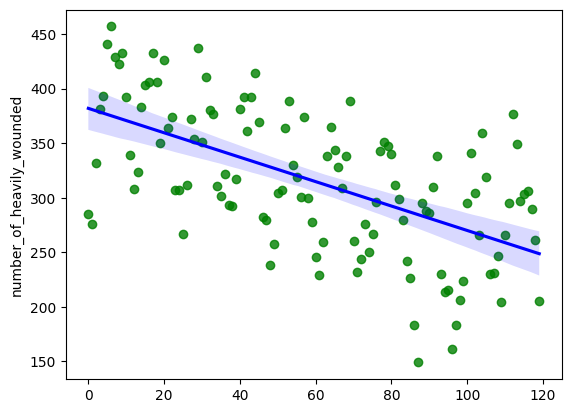

In [9]:

sns.regplot(
    x=np.arange(0,120),
    y=wounded_data['number_of_heavily_wounded'],
    line_kws={'color': 'b'},
    scatter_kws={'color':'g'});


This estimate doesn't seem useful. Maybe it's useful to adapt our model when new observations are added?

## Moving average

We basically need a method that takes the last observations into account, but forgets observations after some time. Older observations may no longer be representative of the current situation. Moving averages are such methods.

### Simple Moving Average

$$SMA(t) = \frac{1}{m} \sum_{i=k}^{t} x_i$$

With $m$ the time range (the number of observations taken into account) and $k$ = t - m + 1.

Suppose the data are monthly and you choose a time range of six months.
Then the prediction of the next month's value is the average of the values for the past six months. For example, you average January to June to forecast July, you average February to July to forecast August, and so on. This procedure is the reason for the term moving averages.
The role of the time range is important. If the span is large—say, 12 months—then many observations go into each average, and extreme values have relatively little effect on the forecasts. The resulting series of forecasts will be much smoother than the original series.  
In contrast, if the
span is small—say, three months—then extreme observations have a larger effect on the forecasts,
and the forecast series will be much less smooth.

The Pandas `Series` class has a method [`rolling()`](https://pandas.pydata.org/docs/reference/api/pandas.Series.rolling.html) for "rolling window" calculations, which is perfectly suitable for what we want to do here.

We call the method `rolling(m)` with the desired time range and then calculate the `mean()`:

In [10]:
wounded_data['SMA3'] = wounded_data['number_of_heavily_wounded'].rolling(3).mean()
wounded_data['SMA5'] = wounded_data['number_of_heavily_wounded'].rolling(5).mean()
wounded_data['SMA10'] = wounded_data['number_of_heavily_wounded'].rolling(10).mean()
wounded_data

,number_of_heavily_wounded,SMA3,SMA5,SMA10
date,,,,
2013-01-01,285,NaN,NaN,NaN
2013-02-01,276,NaN,NaN,NaN
2013-03-01,332,297.666667,NaN,NaN
2013-04-01,381,329.666667,NaN,NaN
2013-05-01,393,368.666667,333.4,NaN
...,...,...,...,...
2022-08-01,303,316.333333,324.2,279.9
2022-09-01,306,302.000000,326.4,287.5
2022-10-01,290,299.666667,309.0,293.4


You'll notice that the first data points in the SMA columns are empty (`NaN`). At those time slots there are still not enough past observations to calculate the mean. The larger the time window, the more empty data points.

If you want to avoid empty cells, you can add the parameter `min_periods=1` to the method call of `rolling()`. In that case the mean will be calculated with any available past observation.

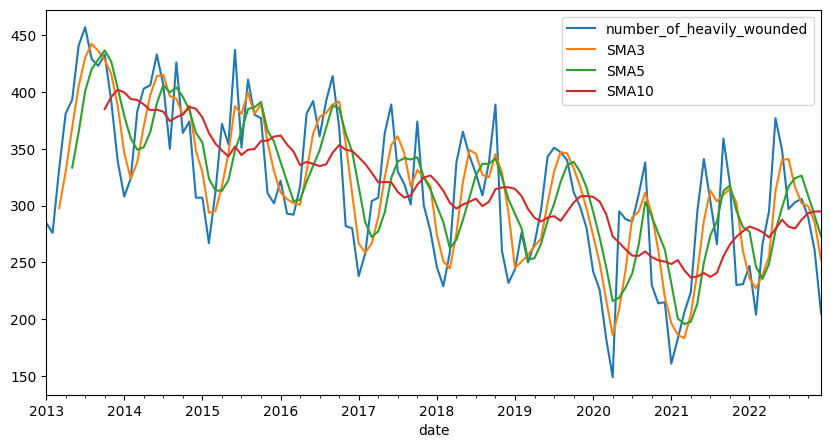

In [11]:
wounded_data.plot(
    y=['number_of_heavily_wounded', 'SMA3',	'SMA5',	'SMA10'],
    figsize=[10,5]);

As you will notice, SMA's with a short window will still follow fluctuations in the observations, while those with a longer window are more "stable", and resilient to short-term fluctuations.

There are two possible criticisms to the moving average method. First, it puts equal weight
on each value in a typical moving average. But one can argue that if the next month's
forecast should be based on the observations of the past 12 months, more weight should be
placed on the more recent observations. The second criticism is that the moving averages
method requires a lot of data storage.

**Exponential smoothing** is a method that addresses both points of criticism. It bases its
predictions on a weighted average of past observations, with more weight on the more recent
observations, and it requires very little data storage. Moreover, it is not difficult for most business people to understand, at least conceptually. Therefore, this method is widely used in the
business world, especially when frequent and automatic forecasts of many items are required.
There are many variations of exponential smoothing.
**Single exponential smoothing** is appropriate for a series with no pronounced trend or seasonality. **Holt's method** is appropriate for a series with trend but no seasonality.
**Winters' method** is appropriate for a series with seasonality (and possibly trend).

### Exponential Moving Average (EMA)

Also called *Single Exponential Smoothing* (SES).

$X_t = \alpha x_t + (1 - \alpha) X_{t-1}$

$F_{t+m} = X_t$

* $\alpha$ is the smoothing constant and is a number between 0 and 1
* $X_t$ is the _level_ of the series at time _t_. This value is not observable but can only be estimated. Essentially, it is
an estimate of where the series would be at time _t_ if there were no random noise.
* $F_{t+m}$ is the forecast at time m

The first equation shows how to update the estimate of the level.
It is a weighted average of the current observation, $x_t$ , and the previous level, $X_{t-1}$, with respective weights $\alpha$ and 1 − $\alpha$.   
The second equation shows how forecasts are made. It says
that the m-period-ahead forecast, $F_{t+m}$, made of $X_t$ in period $m$ is the most recently estimated level, $X_t$. This is the same for any value of m >= 1.
   The idea is that in simple exponential smoothing, you believe that the series is not really going anywhere. So as soon as you estimate where the series ought to be in period t (if it weren't for random noise), you use this as the forecast for any future period.

Pandas has a method [`ewm()`](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.ewm.html) that can be used to calculate the exponential moving average.

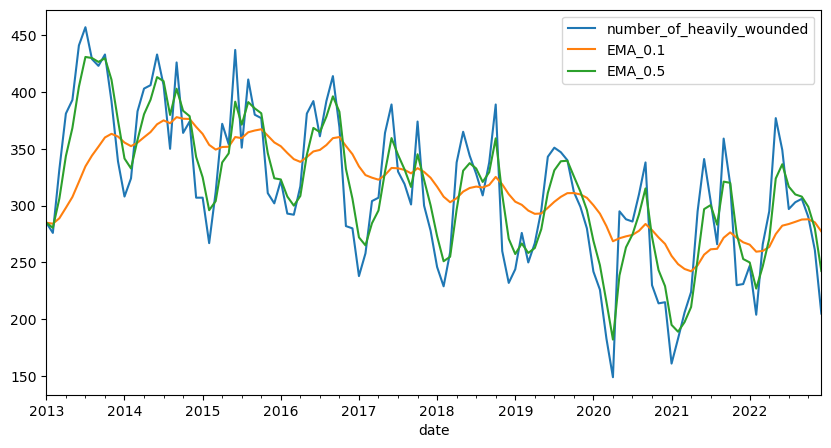

In [66]:
wounded_data['EMA_0.1'] = wounded_data['number_of_heavily_wounded'].ewm(alpha=.1, adjust=False).mean()
wounded_data['EMA_0.5'] = wounded_data['number_of_heavily_wounded'].ewm(alpha=.5, adjust=False).mean()

wounded_data.plot(y=['number_of_heavily_wounded',  'EMA_0.1', 'EMA_0.5'], figsize=[10,5]);

Play with the values of alpha. What is the effect if alpha is small (close to 0) or large (close to 1)?

A way to see the effect of α is to substitute recursively into the equation for $X_t$.  
By performing some algebra, you can verify that $X_t$ satifies the following equation, where sum extends back to the first observation at time = 1.

$X_t = \alpha x_{t} + \alpha (1 - \alpha) x_{t-1} + \alpha (1 - \alpha)^2 x_{t-2} + \alpha (1 - \alpha)^3 x_{t-3} + ...$

This equation shows how the exponentially smoothed forecast is a weighted average of previous observations. Furthermore, because 1 − $\alpha$ is less than 1, the weights on the x's decrease from time t backward.   
If $\alpha$ is close to 0, then 1 − $\alpha$ is close to 1 and the weights
decrease very slowly. In other words, observations from the distant past continue to have a large influence on the next forecast. This means that the graph of the forecasts will be relatively
smooth, just as with a large span in the moving averages method. But if $\alpha$ is close to 1, the weights decrease rapidly, and only very recent observations have much influence on
the next forecast. In this case forecasts react quickly to sudden changes in the series.

Unfortunately, the `ewm()` method does not allow us to do double or triple exponential smoothing. Statsmodels does have the necessary classes. For Single Exponential Smoothing, we can instantiate the [`SimpleExpSmoothing`](https://www.statsmodels.org/stable/generated/statsmodels.tsa.holtwinters.SimpleExpSmoothing.html#statsmodels.tsa.holtwinters.SimpleExpSmoothing) class and then call the [`fit()`](https://www.statsmodels.org/stable/generated/statsmodels.tsa.holtwinters.SimpleExpSmoothing.fit.html#statsmodels.tsa.holtwinters.SimpleExpSmoothing.fit) method. The parameter $\alpha$ can be set with argument `smoothing_level`.

In [67]:
from statsmodels.tsa.holtwinters import SimpleExpSmoothing

# Train the model
data_ses = SimpleExpSmoothing(wounded_data['number_of_heavily_wounded']).fit(
    smoothing_level=0.1, optimized=False)

# Add fitted values to the dataframe
wounded_data['SES'] = data_ses.level
wounded_data.head(20)

,number_of_heavily_wounded,SMA3,SMA5,SMA10,EMA_0.1,EMA_0.5,SES
date,,,,,,,
2013-01-01,285,NaN,NaN,NaN,285.000000,285.000000,285.000000
2013-02-01,276,NaN,NaN,NaN,284.100000,280.500000,284.100000
2013-03-01,332,297.666667,NaN,NaN,288.890000,306.250000,288.890000
2013-04-01,381,329.666667,NaN,NaN,298.101000,343.625000,298.101000
2013-05-01,393,368.666667,333.4,NaN,307.590900,368.312500,307.590900
2013-06-01,441,405.000000,364.6,NaN,320.931810,404.656250,320.931810
2013-07-01,457,430.333333,400.8,NaN,334.538629,430.828125,334.538629
2013-08-01,429,442.333333,420.2,NaN,343.984766,429.914062,343.984766
2013-09-01,423,436.333333,428.6,NaN,351.886289,426.457031,351.886289


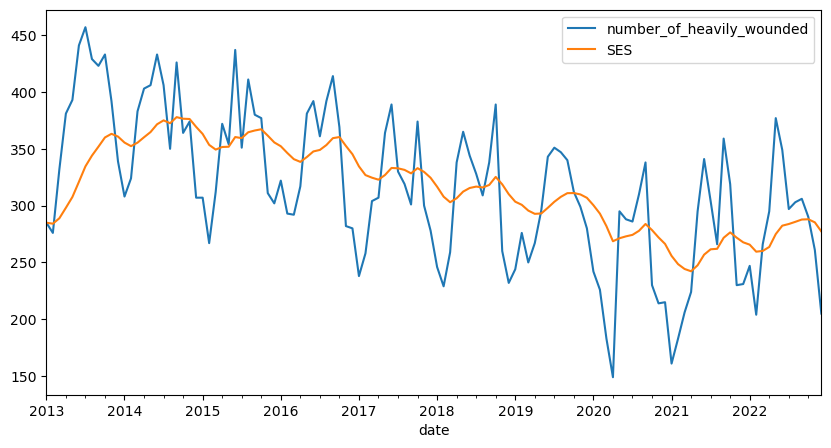

In [68]:
wounded_data.plot(y=['number_of_heavily_wounded',  'SES'], figsize=[10,5]);

These statsmodels classes allow us to do a prediction based on the model:

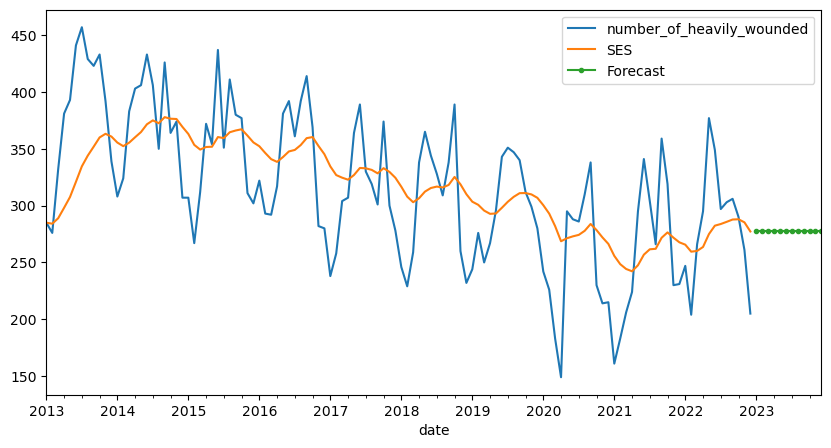

In [69]:
data_ses_fcast = data_ses.forecast(12)

wounded_data.plot(y=['number_of_heavily_wounded',  'SES'], figsize=[10,5])
data_ses_fcast.plot(marker='.', legend=True, label='Forecast');

If we look back at the formulae of Single Exponential Smoothing, the forecasted value for any value of m >= 1 is the _level_ of the series at time _t_:

$X_t = \alpha x_t + (1 - \alpha) X_{t-1}$

$F_{t+m} = X_t$

If we take a look at the plot, this looks correct, but let's check if this is actually the case using the data coming out of the model.  
First we retrieve the level's $X_t$ of the model

In [70]:
data_ses.level

date
2013-01-01    285.000000
2013-02-01    284.100000
2013-03-01    288.890000
2013-04-01    298.101000
2013-05-01    307.590900
                 ...    
2022-08-01    285.743838
2022-09-01    287.769454
2022-10-01    287.992509
2022-11-01    285.293258
2022-12-01    277.263932
Freq: MS, Length: 120, dtype: float64

Now we print out the forecasted values:

In [71]:
data_ses_fcast.values

array([277.26393201, 277.26393201, 277.26393201, 277.26393201,
       277.26393201, 277.26393201, 277.26393201, 277.26393201,
       277.26393201, 277.26393201, 277.26393201, 277.26393201])

We can see that the last value of data_ses.level is indeed the same as all the forecasted values for m >= 1.

When we use Single Exponential Smoothing, we assume that the underlying time series fluctutates around some constant value. This is what is reflected by the forecasted values (in green), which are always the same.

Sometimes we want to compare the actual, observed value to the value that was predicted by the model. In the previous example, we saw that the value  $X_t$  at time $t$ is the model's prediction for the actual value at time $t + 1$.
So, to calculate the difference between the actual, observed value (at time $t + 1$) and the predicted value (at time $t$), we would need to shift the column data['SES'] one down and make the difference between the columns data['number_of_heavily_wounded'] and data['SES']. This seems quite a burden. Luckily .fittedvalues is there to come to the rescue: it contains the value predicted by the model at time $t$.

In [72]:
wounded_data['SES_predicted_value'] = data_ses.fittedvalues
wounded_data.tail()

,number_of_heavily_wounded,SMA3,SMA5,SMA10,EMA_0.1,EMA_0.5,SES,SES_predicted_value
date,,,,,,,,
2022-08-01,303,316.333333,324.2,279.9,285.743838,309.859432,285.743838,283.826486
2022-09-01,306,302.000000,326.4,287.5,287.769454,307.929716,287.769454,285.743838
2022-10-01,290,299.666667,309.0,293.4,287.992509,298.964858,287.992509,287.769454
2022-11-01,261,285.666667,291.4,294.8,285.293258,279.982429,285.293258,287.992509
2022-12-01,205,252.000000,273.0,294.9,277.263932,242.491215,277.263932,285.293258


Finally we can also retrieve the automatically calculated parameters of the model: use .params_formatted to obtain a dataframe containing all parameters:

In [73]:
data_ses.params_formatted

,name,param,optimized
smoothing_level,alpha,0.1,False
initial_level,l.0,285.0,False


### Double exponential smoothing

The single exponential smoothing model generally works well if there is no obvious trend in the series. But if there is a trend, this method consistently lags behind it. For example, if the series is constantly increasing, single exponential smoothing forecasts will be consistently
low. Holt's method rectifies this by dealing with trend explicitly. In addition to
the level of the series, $X_{t}$, Holt's method includes a trend term, $b_{t}$ , and a corresponding
smoothing constant $\beta$. The interpretation of $X_{t}$ is exactly as before. The interpretation of $b_{t}$ is that it represents an estimate of the change in the series from one period to the next.

So, if we suspect that there is a long-term (increasing or decreasing) trend in the time series, we can use Holt's Method or also called Double Exponential Smoothing (DES).

$X_{t} = \alpha x_{t} + (1-\alpha)(X_{t-1} + b_{t-1})$

$b_{t} = \beta(X_{t}-X_{t-1}) + (1-\beta)b_{t-1}$

$F_{t+m} = X_t + mb_t$

with smoothing parameters $0 < \alpha < 1$ and $0 < \beta < 1$. $b_t$ is an estimate for the trend at time $t$ and can also be interpreted as the slope of a regression line.

The first equation says that the updated level is a weighted average of the current observation and the previous level plus the estimated change.  
The second equation says that the updated trend is a weighted average of the difference between two consecutive levels and the previous trend.  
The third equation says that the $m$-period-ahead forecast made in period t is the estimated level plus m times the estimated change per period.

Everything that was said about $\alpha$ for single exponential smoothing applies to both $\alpha$ and $\beta$ in Holt's model. The new smoothing constant $\beta$ controls how quickly the method reacts to observed changes in the trend. If $\beta$ is small, the method reacts slowly. If it is large, the method reacts more quickly.

In Python, you can instantiate the class [`Holt`](https://www.statsmodels.org/stable/generated/statsmodels.tsa.holtwinters.Holt.html#statsmodels.tsa.holtwinters.Holt) and call the [`fit()`](https://www.statsmodels.org/stable/generated/statsmodels.tsa.holtwinters.Holt.fit.html#statsmodels.tsa.holtwinters.Holt.fit) method. The smoothing parameters $\alpha$ and $\beta$ can be set with arguments `smoothing_level` and `smoothing_trend`, respectively. If you don't specify these, suitable values will be calculated using some rule of thumb.

In [74]:
from statsmodels.tsa.api import Holt

data_des = Holt(wounded_data['number_of_heavily_wounded']).fit(
    smoothing_level=.1,
    smoothing_trend=.2,
    optimized=False)

wounded_data['DES'] = data_des.level
wounded_data.tail()


,number_of_heavily_wounded,SMA3,SMA5,SMA10,EMA_0.1,EMA_0.5,SES,SES_predicted_value,DES
date,,,,,,,,,
2022-08-01,303,316.333333,324.2,279.9,285.743838,309.859432,285.743838,283.826486,302.285306
2022-09-01,306,302.000000,326.4,287.5,287.769454,307.929716,287.769454,285.743838,308.133299
2022-10-01,290,299.666667,309.0,293.4,287.992509,298.964858,287.992509,287.769454,311.753826
2022-11-01,261,285.666667,291.4,294.8,285.293258,279.982429,285.293258,287.992509,311.677225
2022-12-01,205,252.000000,273.0,294.9,277.263932,242.491215,277.263932,285.293258,304.994739


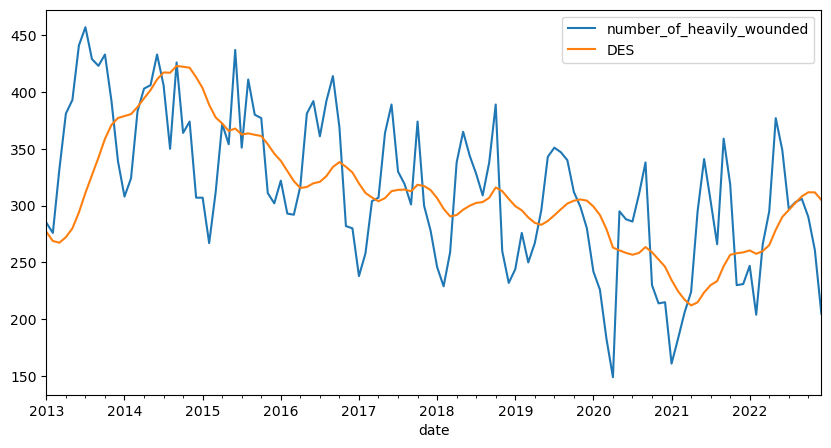

In [75]:
wounded_data.plot(y=['number_of_heavily_wounded',  'DES'], figsize=[10,5]);

We can retrieve the parameters of the model (smoothing parameters, initial estimate of constant term and trend):

In [76]:
data_des.params_formatted

,name,param,optimized
smoothing_level,alpha,0.1,False
smoothing_trend,beta,0.2,False
initial_level,l.0,285.0,False
initial_trend,b.0,-9.0,False


To use this model for forecasting:

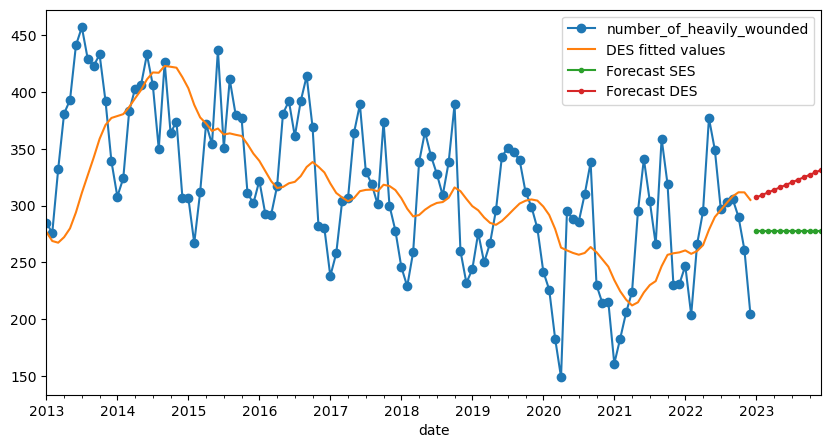

In [77]:
data_des_fcast = data_des.forecast(12)

# Plot observations, fitted values and forecast
wounded_data['number_of_heavily_wounded'].plot(marker='o', legend=True)
wounded_data['DES'].plot(legend=True, label='DES fitted values', figsize=[10,5]);
data_ses_fcast.plot(marker='.', legend=True, label='Forecast SES');
data_des_fcast.plot(marker='.', legend=True, label='Forecast DES');

As we can see, the predictions are now increasing:


In [78]:
data_des_fcast

2023-01-01    307.200674
2023-02-01    309.406609
2023-03-01    311.612544
2023-04-01    313.818479
2023-05-01    316.024415
2023-06-01    318.230350
2023-07-01    320.436285
2023-08-01    322.642220
2023-09-01    324.848155
2023-10-01    327.054091
2023-11-01    329.260026
2023-12-01    331.465961
Freq: MS, dtype: float64

The formula for predicting values, was:

$F_{t+m} = X_t + mb_t$

Take a look at the values of the level's $X_t$ and the trend $b_t$, to  understand the predicted values, as are printed here before.
*   Explain the forecasted value of 2023-01-01
*   Explain the forecasted value of 2023-02-01
*   ...



In [79]:
data_des.level

date
2013-01-01    276.900000
2013-02-01    268.872000
2013-03-01    267.389360
2013-04-01    272.247197
2013-05-01    279.994306
                 ...    
2022-08-01    302.285306
2022-09-01    308.133299
2022-10-01    311.753826
2022-11-01    311.677225
2022-12-01    304.994739
Freq: MS, Length: 120, dtype: float64

In [80]:
data_des.trend

date
2013-01-01   -8.820000
2013-02-01   -8.661600
2013-03-01   -7.225808
2013-04-01   -4.809079
2013-05-01   -2.297841
                ...   
2022-08-01    6.085026
2022-09-01    6.037619
2022-10-01    5.554201
2022-11-01    4.428040
2022-12-01    2.205935
Freq: MS, Length: 120, dtype: float64

Again, we can use .fittedvalues to compare the predicted value at time $t$ to the actual, observed value at time $t$.

In [81]:
wounded_data['DES_prediction_next_month'] = data_des.level + data_des.trend # predicted value for next month => m = 1
wounded_data['DES_fittedvalues'] = data_des.fittedvalues
wounded_data.tail()

,number_of_heavily_wounded,SMA3,SMA5,SMA10,EMA_0.1,EMA_0.5,SES,SES_predicted_value,DES,DES_prediction_next_month,DES_fittedvalues
date,,,,,,,,,,,
2022-08-01,303,316.333333,324.2,279.9,285.743838,309.859432,285.743838,283.826486,302.285306,308.370332,302.205896
2022-09-01,306,302.000000,326.4,287.5,287.769454,307.929716,287.769454,285.743838,308.133299,314.170918,308.370332
2022-10-01,290,299.666667,309.0,293.4,287.992509,298.964858,287.992509,287.769454,311.753826,317.308028,314.170918
2022-11-01,261,285.666667,291.4,294.8,285.293258,279.982429,285.293258,287.992509,311.677225,316.105265,317.308028
2022-12-01,205,252.000000,273.0,294.9,277.263932,242.491215,277.263932,285.293258,304.994739,307.200674,316.105265


### Triple Exponential Smoothing

As mentioned in the introduction, seasonality is the consistent
month-to-month (or quarter-to-quarter) differences that occur each year. (It could also be the day-to-day differences that occur each week.) For example, there is seasonality toy sales, with
a huge peak in the months preceding Christmas.

How can you tell whether there is seasonality in a time series? The easiest way is to check whether a graph of the time series has a regular pattern of ups and/or downs in particular months or quarters.

In an **additive seasonal model**, an appropriate seasonal index is added to a base
forecast.

In a **multiplicative seasonal model**, a base forecast is multiplied by an appropriate
seasonal index.

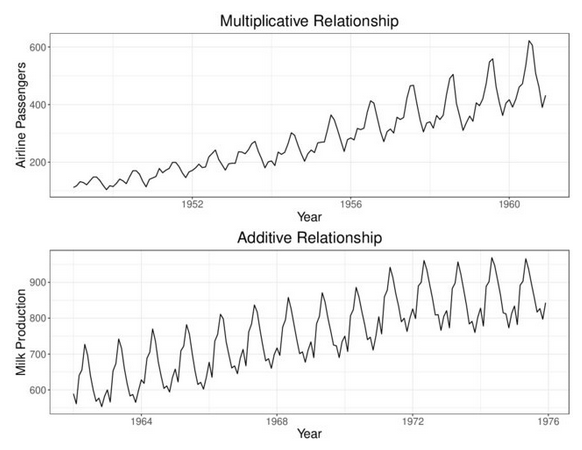

To deal with seasonality, one can use (a.o.) Holt-Winters' exponential smoothing model. It is very similar to Holt's model—
it again has level and trend terms and corresponding smoothing constants $\alpha$ and $\beta$ —but it also has seasonal indexes and a corresponding smoothing constant $\gamma$ (gamma). This new
smoothing constant controls how quickly the method reacts to observed changes in the seasonality pattern. If $\gamma$ is small, the method reacts slowly. If it is large, the method reacts more
quickly. As with Holt's model, there are equations for updating the level and trend terms, and there is one extra equation for updating the seasonal indexes.

Triple Exponential Smoothing (TES), also called *Holt-Winter's Method*, can in addition also model seasonally recurring trends.

- Level smoothing: $X_{t} = \alpha \frac{x_{t}}{c_{t-L}} + (1-\alpha) (X_{t-1} + b_{t-1})$
- Trend smoothing: $b_{t} = \beta (X_{t} - X_{t-1}) + (1-\beta)b_{t-1}$
- Seasonal smoothing: $c_{t} = \gamma \frac{x_{t}}{X_{t}} + (1-\gamma)c_{t-L}$
- Forecast for $m$ time units after the last observation: $F_{t+m} = (X_{t} + m b_{t})c_{t-L+1+(m-1) \mod L}$

In these formulas, the following additional notation is used:

- $L$ is the length (in number of time units) of the seasonal cycle. Common values are 7 for a weekly cycle, 4 for a quarterly one, 12 for a monthly cycle, etc.
- $0 < \gamma < 1$ is the smoothing parameter for the seasonal trend (like $\alpha$ and $\beta$). Set this value in the `fit()` method using argument `smoothing_seasonal`.
- $c_t$ are estimates for the seasonal correction factors, one for each time unit $t\mod L$ within the seasonal cycle.

To understand how the forecast equation works, suppose you have observed data through June and you want a forecast for the coming September, that is, a three-month-ahead forecast. (In this case t refers to June and t + m = t + 3 refers to September.) The method first adds 3 times the current trend term to the current level. This gives a forecast
for September that would be appropriate if there were no seasonality. Next, it adds this forecast by the most recent estimate of September's seasonal index (the one from the
previous September) to get the forecast for September.

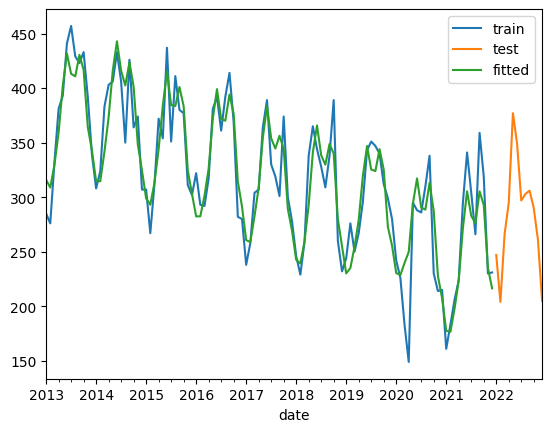

In [21]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

train = wounded_data.number_of_heavily_wounded[:-12]
test = wounded_data.number_of_heavily_wounded[-12:]

wounded_hw = ExponentialSmoothing(train, trend='add', seasonal='add', seasonal_periods=12, freq='MS').fit()

train.plot(legend=True, label='train')
test.plot(legend=True, label='test')
(wounded_hw.level + wounded_hw.season).plot(legend=True, label='fitted');

Let's use the model to make a forecast.
Applied to the number of heavily wounded, we calculate a forecast for the last year (i.e. the test data) as follows:

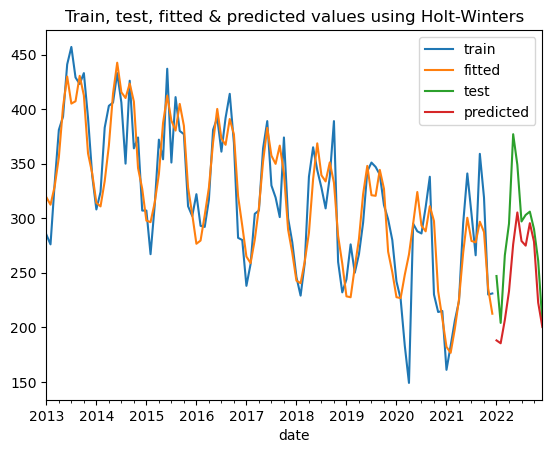

In [83]:
wounded_predicted = wounded_hw.forecast(12)

train.plot(legend=True, label='train')
wounded_hw.fittedvalues.plot(legend=True, label='fitted')

test.plot(legend=True, label='test')
wounded_predicted.plot(legend=True, label='predicted')

plt.title('Train, test, fitted & predicted values using Holt-Winters');


Let's zoom in on the forecasted period to compare test data and predictions:

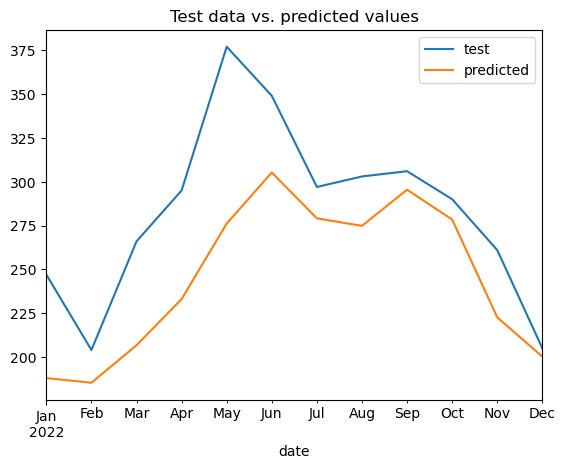

In [84]:
test.plot(legend=True, label='test');
wounded_predicted.plot(legend=True, label='predicted');
plt.title('Test data vs. predicted values');

In [85]:
wounded_predicted

2022-01-01    187.986439
2022-02-01    185.351494
2022-03-01    206.708105
2022-04-01    233.072289
2022-05-01    276.132494
2022-06-01    305.248726
2022-07-01    279.096507
2022-08-01    274.844103
2022-09-01    295.462496
2022-10-01    278.427250
2022-11-01    222.638073
2022-12-01    200.258976
Freq: MS, dtype: float64

Again, we can retrieve the internals of the model. These are the relevant attributes:

- `level` contains all level estimates ($X_i$) for each time unit in the training data
- `trend` contains all trend estimates ($b_i$)
- `season` contains all estimates for the seasonal adjustment factors. ($c_i$)
- `params` (dict output) or `params_formatted` (table output) contains all parameters used to bootstrap the model (including automatically calculated ones).

In [86]:
# Retrieve the automatically calculated parameters of the model:
wounded_hw.params_formatted

,name,param,optimized
smoothing_level,alpha,0.122687,True
smoothing_trend,beta,0.009324,True
smoothing_seasonal,gamma,0.001778,True
initial_level,l.0,384.940128,True
initial_trend,b.0,-1.203172,True
initial_seasons.0,s.0,-64.495486,True
initial_seasons.1,s.1,-65.931719,True
initial_seasons.2,s.2,-43.362649,True
initial_seasons.3,s.3,-15.793236,True
initial_seasons.4,s.4,28.461948,True


Forecasting is done using the final values for the level, trend and seasonal adjustment factor estimates. Let's retrieve them from the model:

In [87]:
wounded_hw.level

date
2013-01-01    379.535967
2013-02-01    373.832485
2013-03-01    372.893802
2013-04-01    374.702365
2013-05-01    372.357014
                 ...    
2021-08-01    245.600070
2021-09-01    251.907301
2021-10-01    254.531244
2021-11-01    252.634588
2021-12-01    253.686847
Freq: MS, Length: 108, dtype: float64

In [88]:
wounded_hw.trend

date
2013-01-01   -1.242342
2013-02-01   -1.283938
2013-03-01   -1.280719
2013-04-01   -1.251914
2013-05-01   -1.262109
                ...   
2021-08-01   -1.326642
2021-09-01   -1.255464
2021-10-01   -1.219292
2021-11-01   -1.225608
2021-12-01   -1.204369
Freq: MS, Length: 108, dtype: float64

In [89]:
wounded_hw.season

date
2013-01-01   -64.556384
2013-02-01   -65.996388
2013-03-01   -43.357644
2013-04-01   -15.748454
2013-05-01    28.446097
                ...    
2021-08-01    30.792209
2021-09-01    52.614972
2021-10-01    36.784094
2021-11-01   -17.800713
2021-12-01   -38.942421
Freq: MS, Length: 108, dtype: float64

The model performs forecasts by:

- Taking the last level estimate
- Taking the last trend estimate
- Taking the last estimate for the appropriate seasonal adjustment factor
- Computing the forecast formula given above

Let's verify this for the first forecasted value, for 2022-01-01:

In [96]:
# Predicted value by forecast():
print(wounded_predicted.iloc[0])

# Computed manually from model internals:
(wounded_hw.level.iloc[-1] + wounded_hw.trend.iloc[-1]) + wounded_hw.season.iloc[-12]

187.98643922124091


187.98643922124091

How would you calculate the forecast for 2022-02-01? And 2022-03-01?  

### Evaluating the quality of a model

In the Holt-Winters model, there are 3 smoothing constants: $\alpha$, $\beta$ and $\gamma$. What are the most appropriate values? Should $\alpha$ be 0.1, or rather 0.5? And what about $\beta$?
We need a metric to help us decide if one model performs better than another model.

Two commonly used metrics for this are the Mean Absolute Error (MAE) and Mean Squared Error (MSE), in which we compare the $m$ forecasted values with the observed values in the test set.

$$MAE = \frac{1}{m} \sum_{i=t+1}^{t+m} \left| x_i - F_i \right|$$

$$MSE = \frac{1}{m} \sum_{i=t+1}^{t+m} (x_i - F_i)^{2}$$

Remark the similarities between the formula for MSE and variance!

Applied to our case, we get:

In [91]:
wounded_predicted

2022-01-01    187.986439
2022-02-01    185.351494
2022-03-01    206.708105
2022-04-01    233.072289
2022-05-01    276.132494
2022-06-01    305.248726
2022-07-01    279.096507
2022-08-01    274.844103
2022-09-01    295.462496
2022-10-01    278.427250
2022-11-01    222.638073
2022-12-01    200.258976
Freq: MS, dtype: float64

In [92]:
test

date
2022-01-01    247
2022-02-01    204
2022-03-01    266
2022-04-01    295
2022-05-01    377
2022-06-01    349
2022-07-01    297
2022-08-01    303
2022-09-01    306
2022-10-01    290
2022-11-01    261
2022-12-01    205
Freq: MS, Name: number_of_heavily_wounded, dtype: int64

In [93]:
from sklearn.metrics import mean_absolute_error,mean_squared_error

print(f'MAE = {mean_absolute_error(test,wounded_predicted)}')
print(f'MSE = {mean_squared_error(test,wounded_predicted)}')

MAE = 37.897753969287784
MSE = 2176.811417767226


In order to evaluate whether our model performs well, we can compare MSE with the variance in the data, or the square root of the MSE with the standard deviation:

In [97]:
print(f'√MSE  = {np.sqrt(mean_squared_error(test,wounded_predicted))}')
print(f'stdev = {wounded_data.number_of_heavily_wounded.std()}')

√MSE  = 46.65631166055913
stdev = 66.03568341884434


The square root of the MSE is well within one standard deviation of the original data, which is an indicator that the model performs well.

A data scientist could try to tweak the parameters (like $\alpha$, $\beta$ and $\gamma$, but also initial values of the estimators like $X_t$, $b_t$ and $c_t$) of the model to attain an even lower MSE. When we are satisfied with the model's performance, we can start using it "in production". We could retrain the model with these parameters on the entire dataset and make forecasts for time units.

### Decomposing a time series

A data series that shows a long term and seasonal trend can be "decomposed":

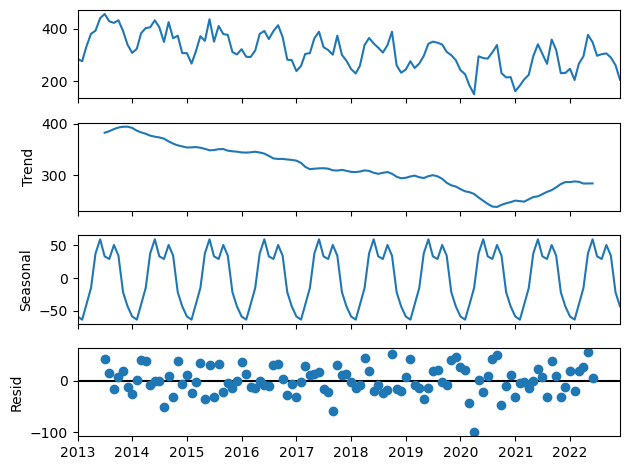

In [98]:
from statsmodels.tsa.seasonal import seasonal_decompose

# remove other columns (e.g. SES, DES, ...)
data = wounded_data[['number_of_heavily_wounded']]

wounded_decomposed = seasonal_decompose(data, model='additive')
wounded_decomposed.plot();

- The top graph shows the observations
- The second graph is the long term trend (which seems to be linear, so the choice for an additive model was appropriate)
- The third graph shows the seasonal trend
- The final graph are the residues

The semicolon at the end of line 4 is not strictly necessary, but if you leave it out, it's possible that the plot is shown twice.




## Sources

Khan, E. (2021-01-05) *Python Code on Holt-Winters Forecasting.* Retrieved 2022-04-15 from <https://medium.com/analytics-vidhya/python-code-on-holt-winters-forecasting-3843808a9873>

Moreno, A.I. (2020-07-08) *Moving Averages with Python: Simple, cumulative and exponential moving averages with Pandas*, retrieved 2022-04-15 from <https://towardsdatascience.com/moving-averages-in-python-16170e20f6c>

Paramita (2020-12-17) *Holt winters Model, Easiest Times series Model. Additive multiplicative trend and seasonality*, retrieved 2022-04-16 from <https://www.youtube.com/watch?v=O6cUkdQeLUQ>

Perktold, J., et al. (2022-04-13) *statsmodels manual: Exponential Smoothing.* Retrieved 2022-04-15 from <https://www.statsmodels.org/dev/examples/notebooks/generated/exponential_smoothing.html>